In [1]:
!pip install keras-tcn
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 3.4 MB/s eta 0:00:00


Librerias a Utilizar

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, LSTM, Concatenate, LeakyReLU, Dropout
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error, mean_squared_error
from tensorflow.keras.layers import LSTM, Dense, Dropout, LeakyReLU, Concatenate, BatchNormalization
from sklearn.preprocessing import MinMaxScaler
from  sklearn.model_selection import TimeSeriesSplit
from keras.callbacks import EarlyStopping
import tensorflow as tf
import keras_tuner as kt
import os
import warnings
from tensorflow.keras.utils import plot_model
from tcn import TCN
import math as m
from tensorflow.keras import layers, models
from tensorflow.keras.models import Model
from keras import backend as K
import pdb
import copy
from tensorflow.keras.regularizers import l1, l2
from matplotlib.dates import DateFormatter
from keras_tuner import HyperParameters
from keras_tuner.engine.hyperparameters import HyperParameters
from numpy import hstack

# Lectura de Dataset preprocesado

In [ ]:
arch='TCN'
project_path='/content/drive/MyDrive/Price_Prediction'
df=pd.read_csv(project_path+'/DataCompleta_Resultados/Complete.csv')

In [ ]:
# Lista de fechas a eliminar
fechas_a_eliminar = ['2015-03-26', '2015-07-08', '2015-10-12', '2015-12-17']
df = df[~df['Date'].isin(fechas_a_eliminar)]

In [ ]:
# Lista de fechas a eliminar
fechas_a_eliminar = ['2015-03-26', '2015-07-08', '2015-10-12', '2015-12-17']
df2 = df[~df['Date'].isin(fechas_a_eliminar)]

# Analisis Dataset Final

In [ ]:
dfDate=pd.read_csv(project_path+'/DataCompleta_Resultados/Complete.csv',
                 low_memory=False,
                 parse_dates=["Date"])

In [ ]:
# Obtener una lista única de los nombres de las empresas
empresas = df['ticker_symbol'].unique()
empresas

array(['AAPL', 'AMZN', 'GOOG', 'GOOGL', 'MSFT', 'TSLA'], dtype=object)

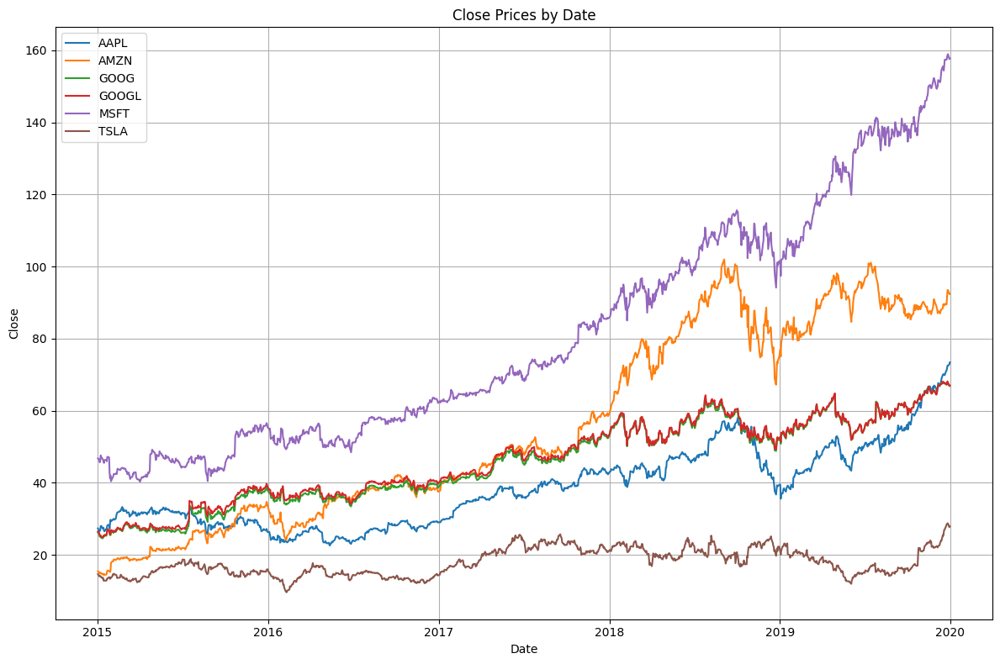

In [ ]:
# Crear el gráfico
plt.figure(figsize=(12, 8))

# Iterar sobre cada empresa y trazar la columna 'Open'
for empresa in empresas:
    datos_empresa = dfDate[dfDate['ticker_symbol'] == empresa]
    plt.plot(datos_empresa['Date'], datos_empresa['Close'], label=empresa)

# Agregar título y etiquetas a los ejes
plt.title('Close Prices by Date')
plt.xlabel('Date')
plt.ylabel('Close')
plt.legend()  # Mostrar leyenda con los nombres de las empresas
plt.grid(True)  # Agregar una cuadrícula al gráfico

plt.tight_layout()  # Ajustar el diseño para que quepa todo el contenido
plt.show()

# Separacion de Empresas en diccionario

Creacion de las secuencias de entrada y salida de cada empresa (ventana de tiempo)

In [ ]:
df_dict = {key: group.drop(columns=['ticker_symbol']).sort_values(by=['Date']).reset_index(drop=True)
           for key, group in df.groupby('ticker_symbol')}

# Lista para almacenar los datos de entrada para cada canal
X_channels, y_channels = [], []

keys=df_dict.keys()
keys_list=list(keys)


# Preprocesamiento de datos y almacenamiento en las listas X_channels y y_channels
for ticker_symbol in keys_list:
    #pdb.set_trace()
    df = df_dict[ticker_symbol]#.copy()
    df = df[['Date','p_sentiment', 'Open', 'High', 'Low', 'Volume', 'unrate', 'psr', 'm2', 'dspic', 'pce', 'reer', 'ir', 'ffer', 'tcs', 'indpro', 'ccpi', 'Close']]

    dates = pd.to_datetime(df['Date'])
    cols=list(df)[1:]

    df_for_training = df[cols].astype(float)

    n_future = 1
    n_past = 1
    X_ticker, y_ticker  = [], []

    # División de datos en entrada y salida para cada canal
    for i in range(n_past, len(df_for_training) - n_future + 1):
        X_ticker.append(df_for_training.values[i - n_past:i])
        y_ticker.append(df_for_training.values[i + n_future - 1:i + n_future, -1])

    X_channels.append(np.array(X_ticker))
    y_channels.append(np.array(y_ticker))

In [ ]:
df_dict2 = {key: group.drop(columns=['ticker_symbol']).sort_values(by=['Date']).reset_index(drop=True)
           for key, group in df2.groupby('ticker_symbol')}

# Lista para almacenar los datos de entrada para cada canal
X_c, y_c = [], []

keys=df_dict2.keys()
keys_list=list(keys)

scalers=[]

# Preprocesamiento de datos y almacenamiento en las listas X_channels y y_channels
for ticker_symbol in keys_list:
    #pdb.set_trace()
    df2 = df_dict2[ticker_symbol]#.copy()
    df2 = df2[['Date','p_sentiment', 'Open', 'High', 'Low', 'Volume', 'unrate', 'psr', 'm2', 'dspic', 'pce', 'reer', 'ir', 'ffer', 'tcs', 'indpro', 'ccpi', 'Close']]

    dates = pd.to_datetime(df2['Date'])
    cols=list(df2)[1:]

    df_for_t = df2[cols].astype(float)

    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(df_for_t)
    #scaler_d.append(scaled_data)
    scalers.append(scaler)

    n_future = 1
    n_past = 1
    X_tick, y_tick  = [], []

    # División de datos en entrada y salida para cada canal
    for i in range(n_past, len(scaled_data) - n_future + 1):
        X_tick.append(scaled_data[i - n_past:i, 0:df_for_t.shape[1]])
        y_tick.append(scaled_data[i + n_future - 1:i + n_future, len(cols)-1])

    X_c.append(np.array(X_tick))
    y_c.append(np.array(y_tick))

Funcion que contiene implementacion del modelo MILSTM

In [ ]:
def n_layers(ks):
    n=m.ceil(m.log2((((6)*(2-1))/(ks-1))+1))
    return n
def build_model(hp):
    hp_ks=hp.Int('kernel_size',min_value=3,max_value=6,step=1)
    hp_nb=hp.Int('nb_filters',min_value=16,max_value=240,step=16)
    hp_dp=hp.Choice('dropout_rate',[0.0,0.2,0.3])
    hp_alpha = hp.Float('alpha', min_value=0.1, max_value=0.3, step=0.1)#3
    hp_units1 = hp.Int('units1', min_value=20, max_value=160, step=4)#35
    hp_l1 = hp.Choice('l1', values=[0.01, 0.1, 0.2])
    hp_l2 = hp.Choice('l2', values=[0.0001, 0.001])

    model=Sequential()

    concatenated_input = Concatenate(axis=2)(X_channels)
    input_shape = (concatenated_input.shape[1], concatenated_input.shape[2])

    model.add(
            TCN(
                input_shape=input_shape,
                kernel_size=hp_ks,
                return_sequences=False,
                dilations=[2**i for i in range(0,n_layers(hp_ks))],
                activation=LeakyReLU(alpha=hp_alpha),
                nb_filters=hp_nb,
                padding='causal',
                dropout_rate=hp_dp,
                kernel_initializer='he_normal',
                use_skip_connections=True))


    model.add(Dense(hp_units1, activation=LeakyReLU(alpha=hp_alpha), kernel_regularizer=l2(hp_l1), bias_regularizer=l2(hp_l1)))

    model.add(Dense(6, kernel_regularizer=l2(hp_l2)))

    model.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-4),loss='mse')
    return model

In [ ]:
X_channels_copy = copy.deepcopy(X_channels)
y_channels_copy = copy.deepcopy(y_channels)

x_channels_combined = tf.concat(X_channels_copy, axis=2)
y_channels_combined = tf.concat(y_channels_copy, axis=1)

#-------------------------------------------------------------

X_channels_c = copy.deepcopy(X_c)
y_channels_c = copy.deepcopy(y_c)

x_channels_comb = tf.concat(X_channels_c, axis=2)
y_channels_comb = tf.concat(y_channels_c, axis=1)

# Metricas MAPE, MAE, MSE, RMSE, MPE

In [ ]:
def mape(y_true, y_pred):
    mape = mean_absolute_percentage_error(y_true, y_pred)
    mape_desviacion_estandar = np.std(mape)
    return mape, mape_desviacion_estandar

def mae(y_true, y_pred):
    mae_resultado = mean_absolute_error(y_true, y_pred)
    mae_desviacion_estandar = np.std(np.abs(y_pred - y_true))
    return mae_resultado, mae_desviacion_estandar

def mse(y_true, y_pred):
    mse_resultado = mean_squared_error(y_true, y_pred)
    mse_desviacion_estandar = np.sqrt(np.mean((y_pred - y_true)**2))
    return mse_resultado, mse_desviacion_estandar

def rmse(y_true, y_pred):

    rmse_resultado = np.sqrt(mean_squared_error(y_true, y_pred))
    rmse_desviacion_estandar = np.sqrt(np.mean((y_pred - y_true)**2))
    return rmse_resultado, rmse_desviacion_estandar

def mpe(y_true, y_pred):
    mpe_resultado = np.mean((y_pred - y_true) / y_true) * 100
    mpe_desviacion_estandar = np.std((y_pred - y_true) / y_true) * 100
    return mpe_resultado, mpe_desviacion_estandar


# Optimizadores de hiperparámetros

Trial 30 Complete [00h 01m 22s]
val_loss: 0.013133666478097439

Best val_loss So Far: 0.012344508431851864
Total elapsed time: 00h 58m 54s
Fold_1 Started


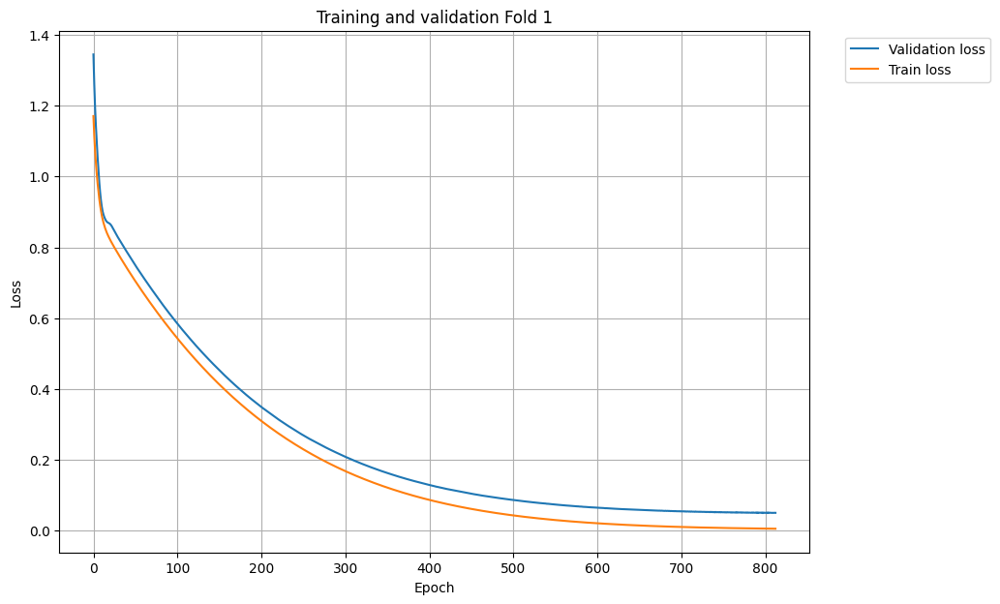

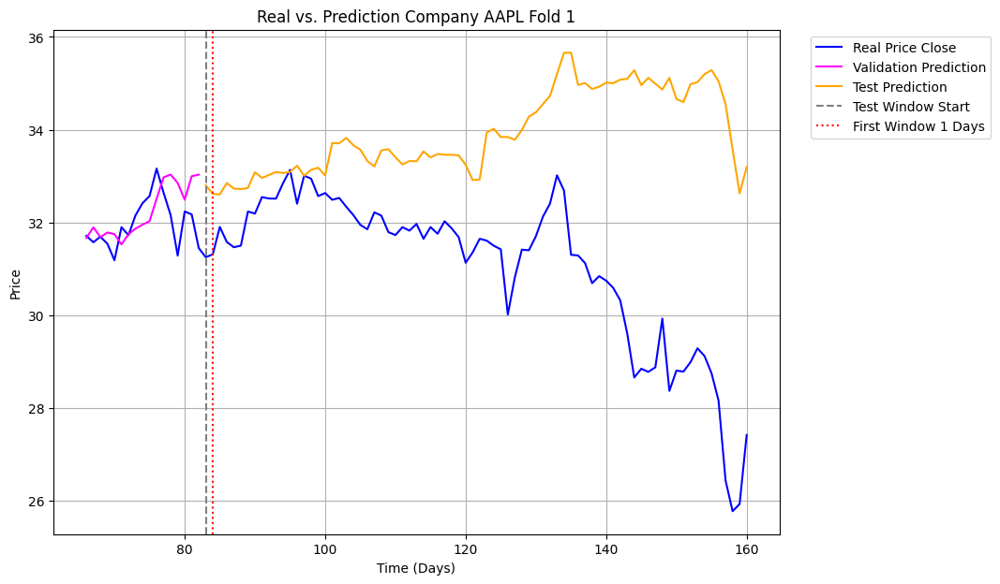

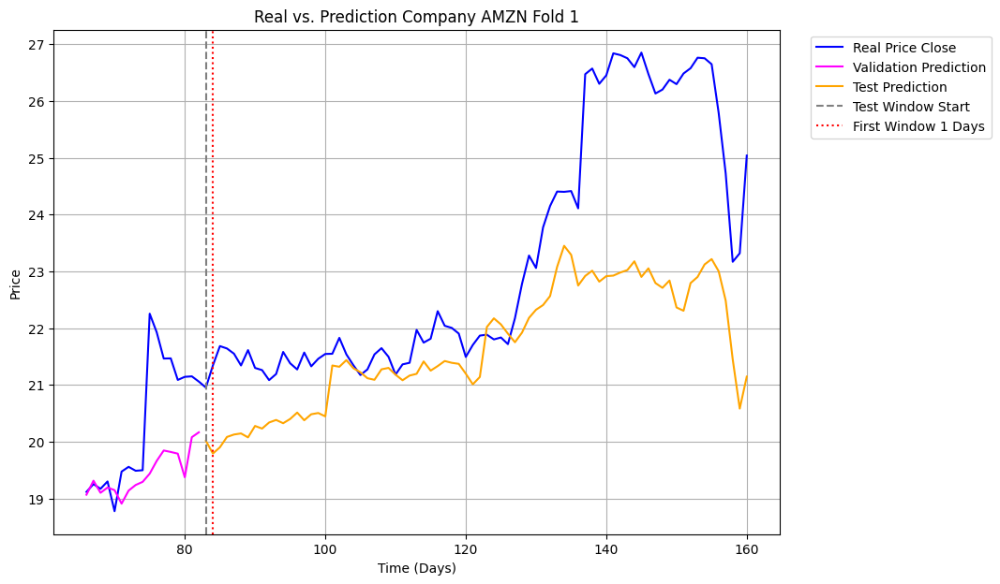

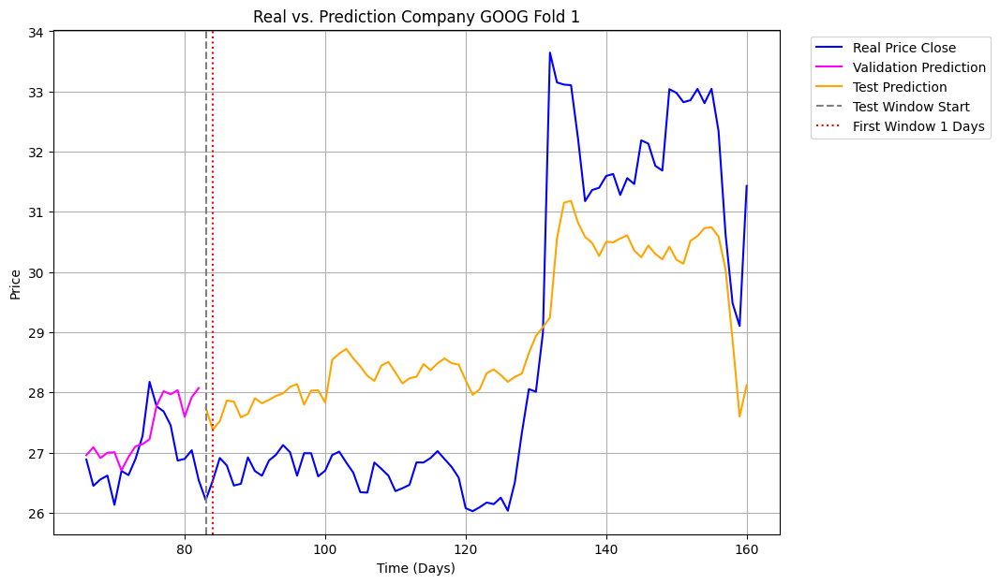

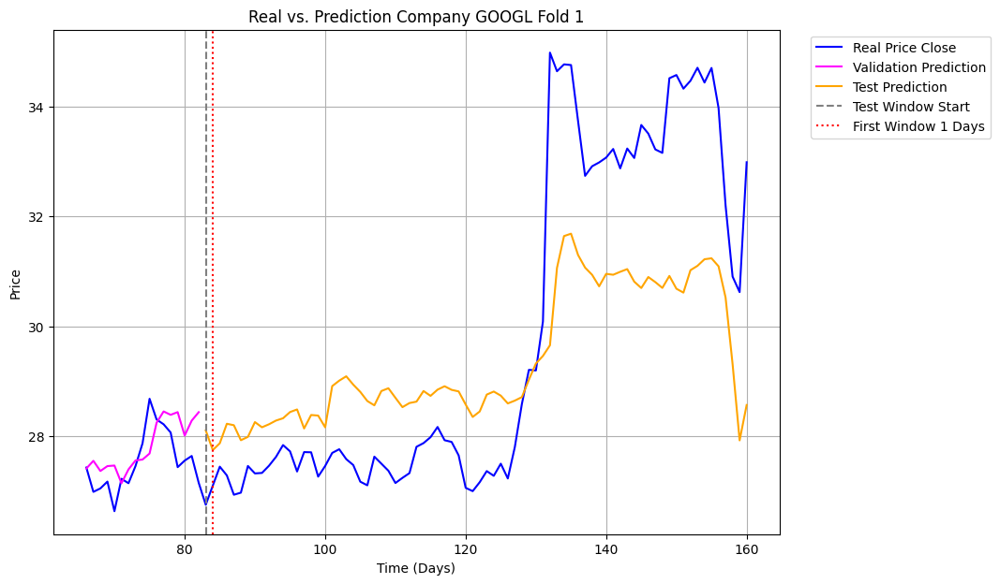

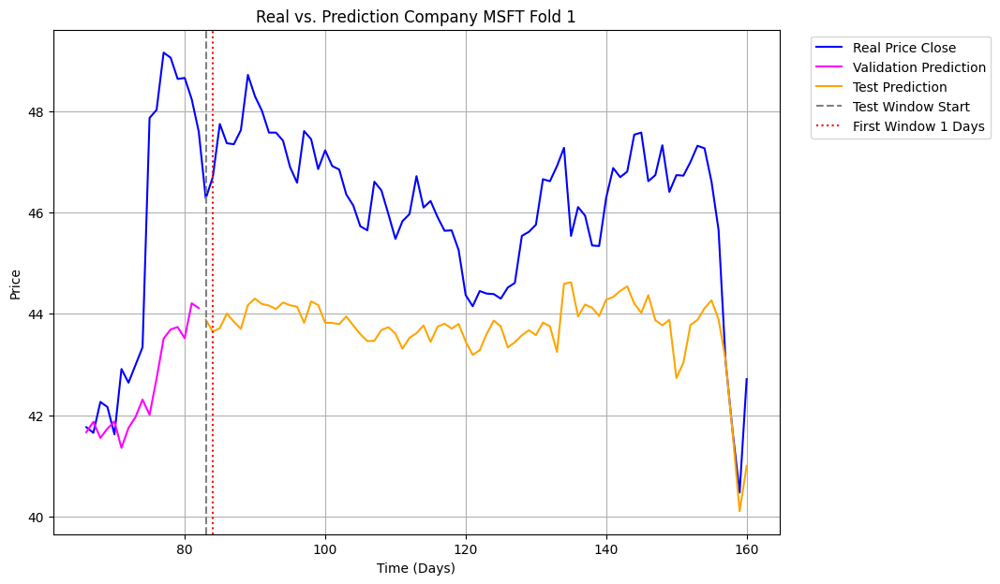

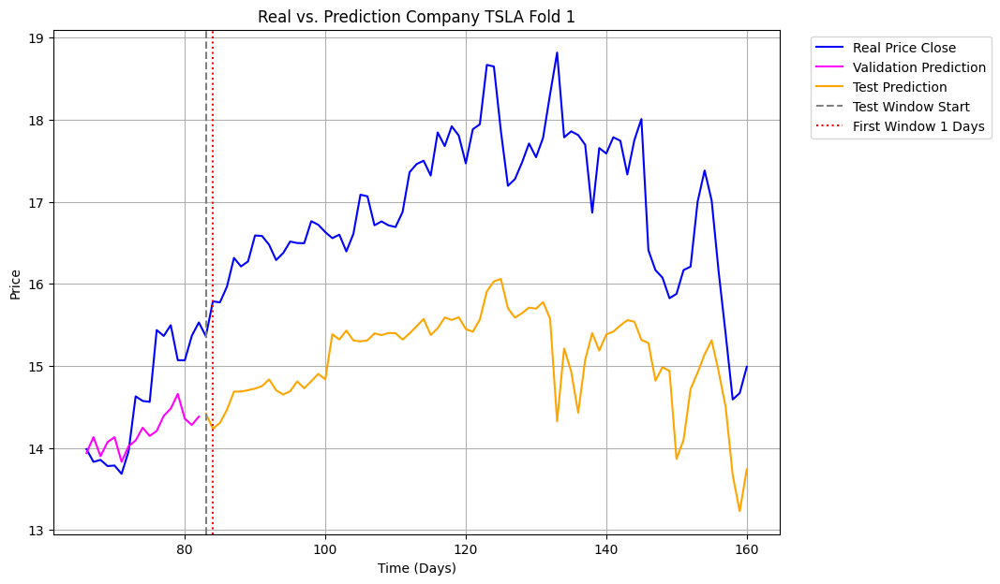

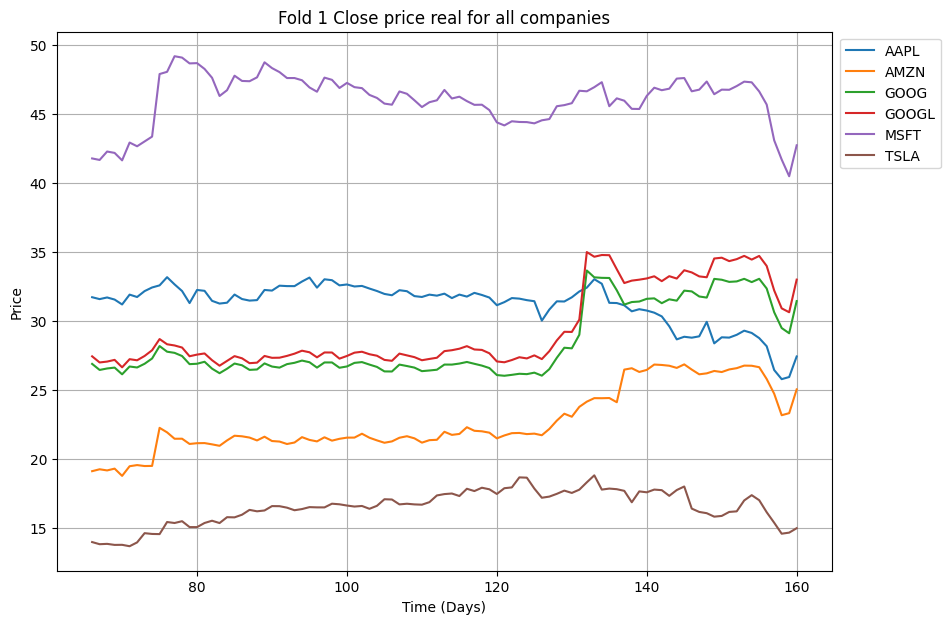

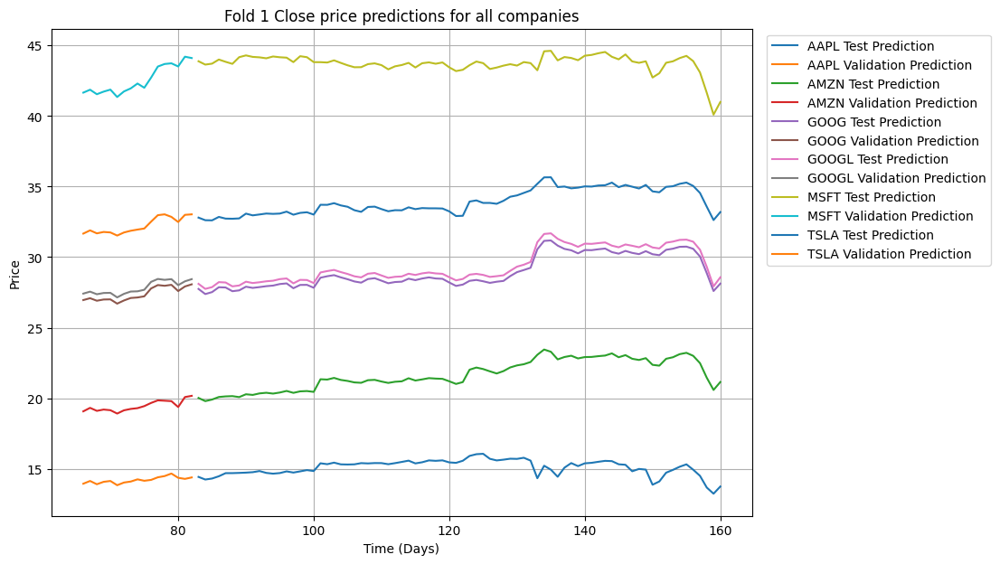

Fold_1 Done
Fold_2 Started


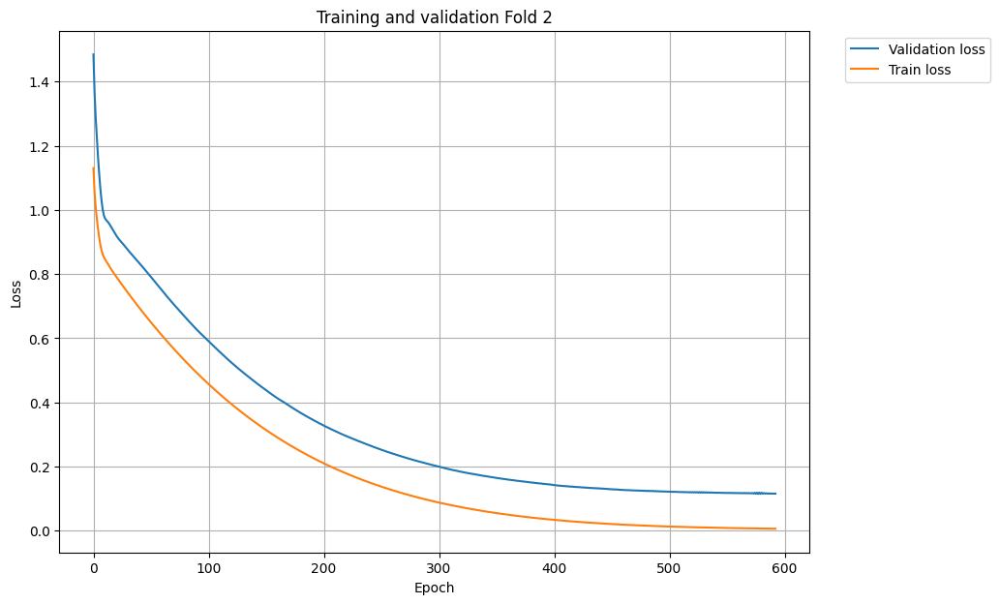

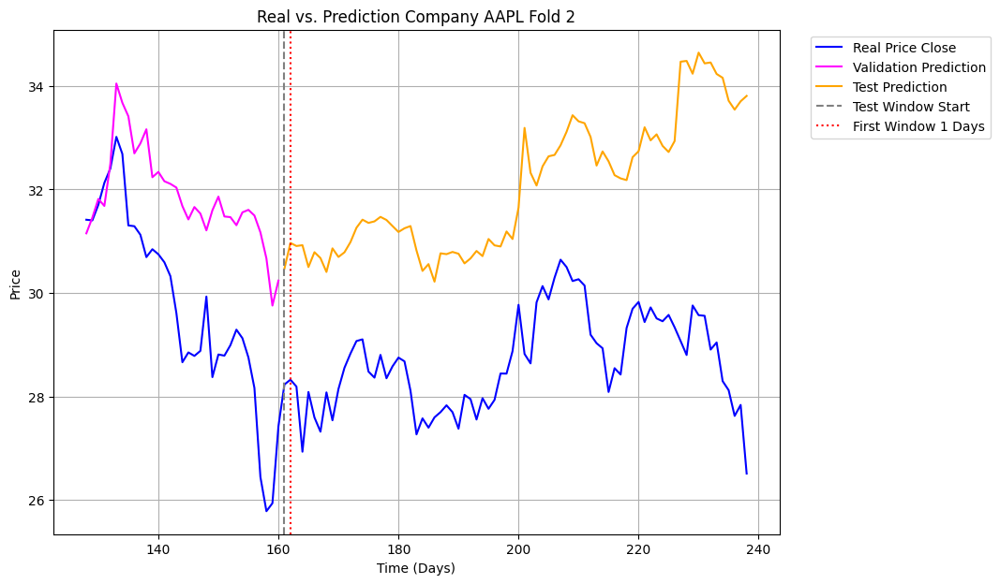

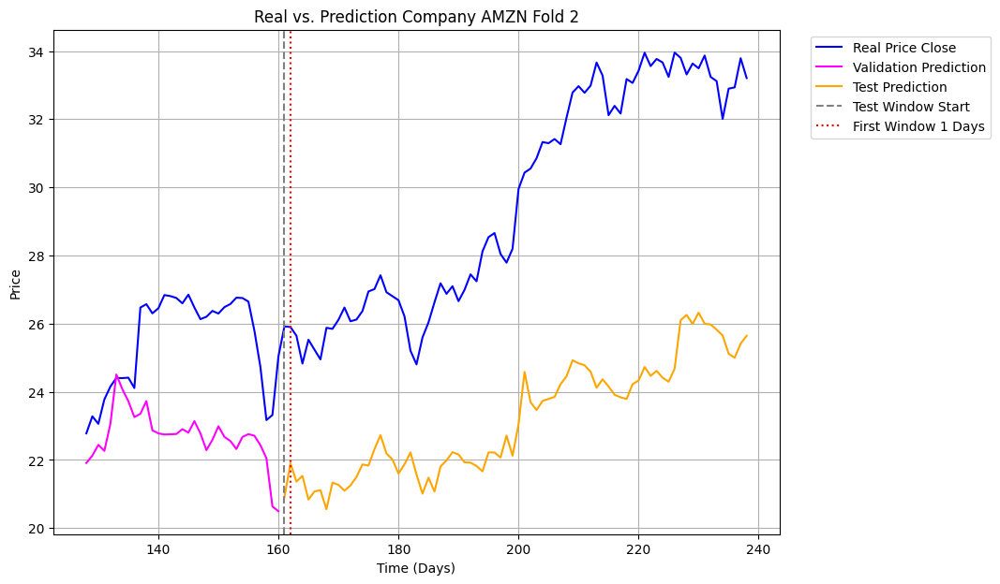

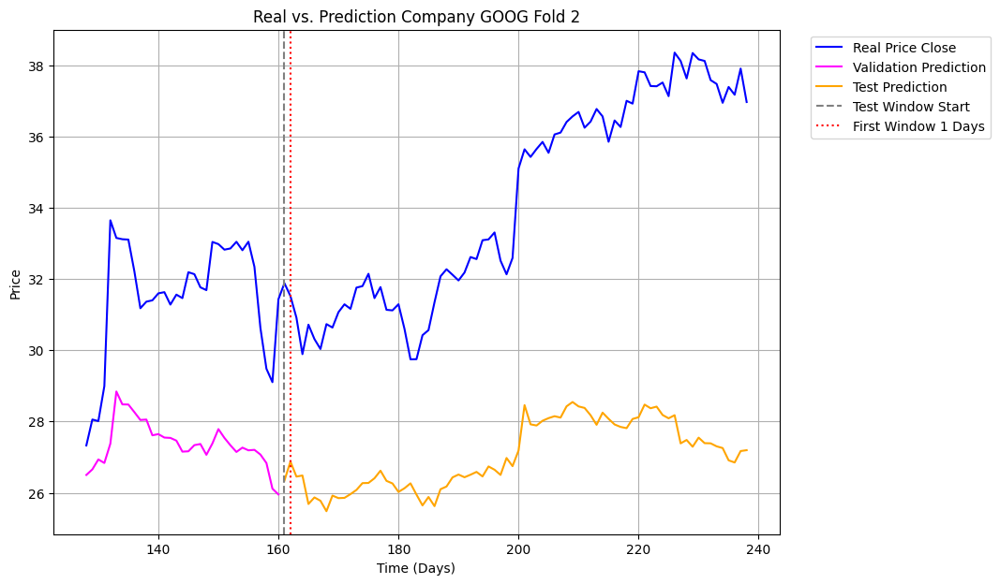

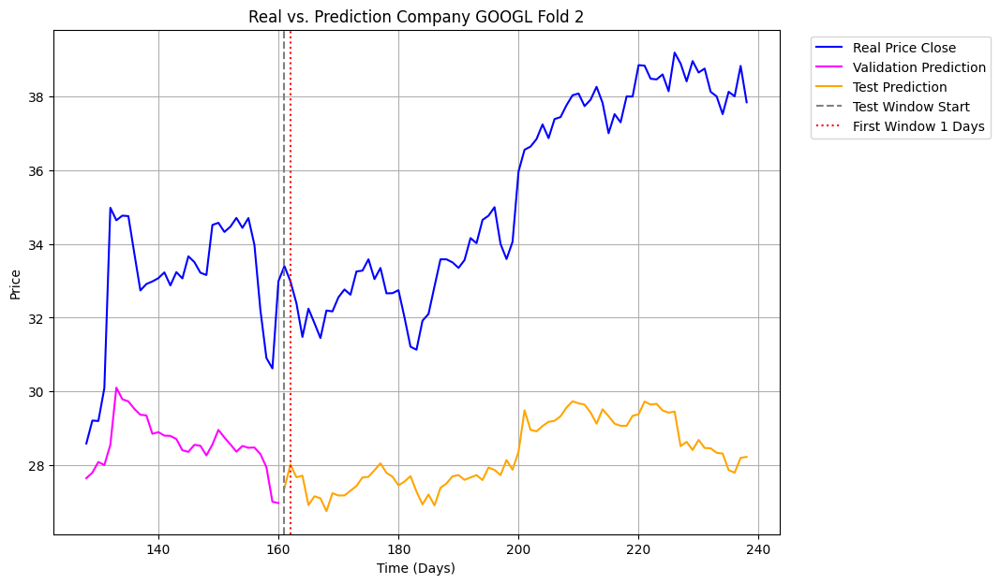

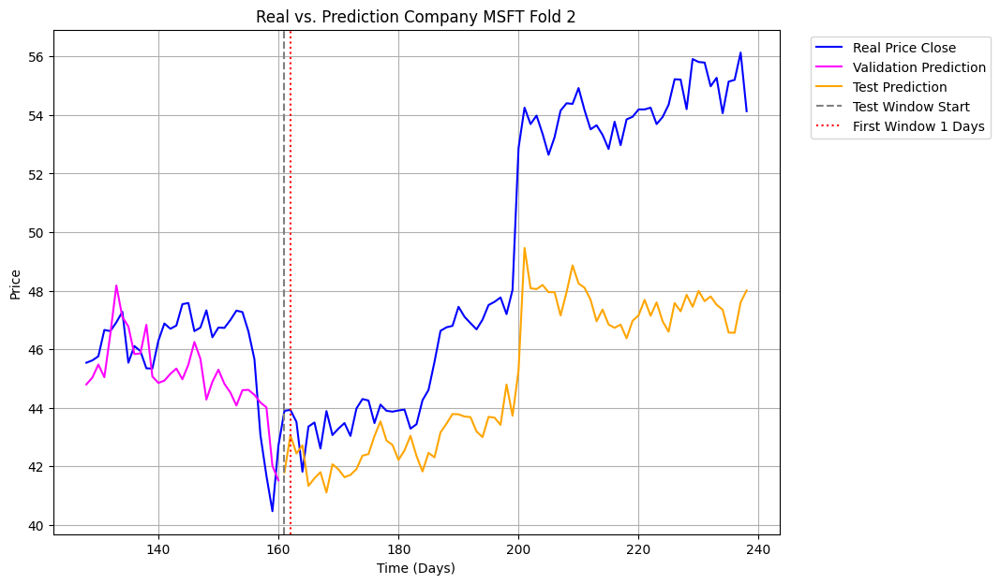

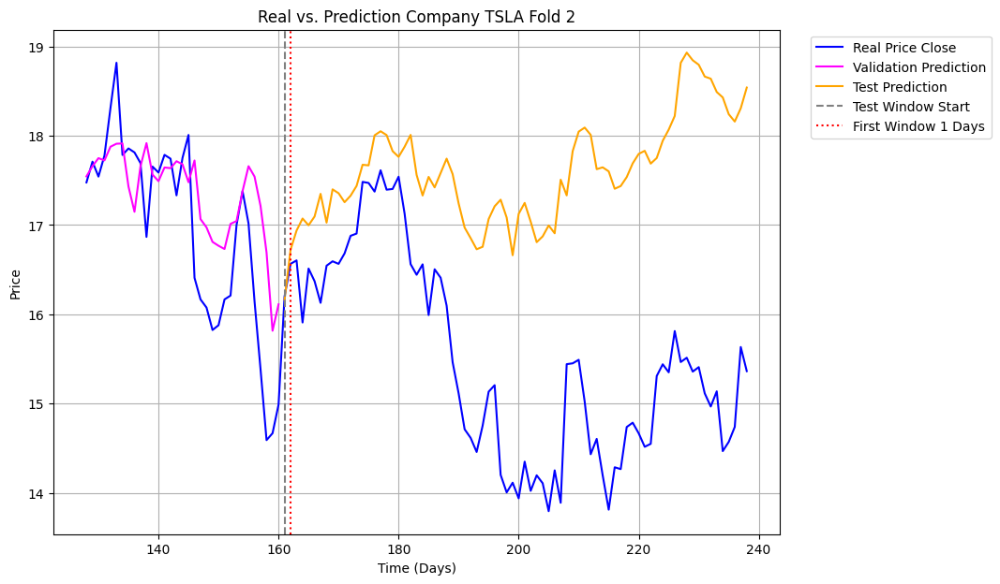

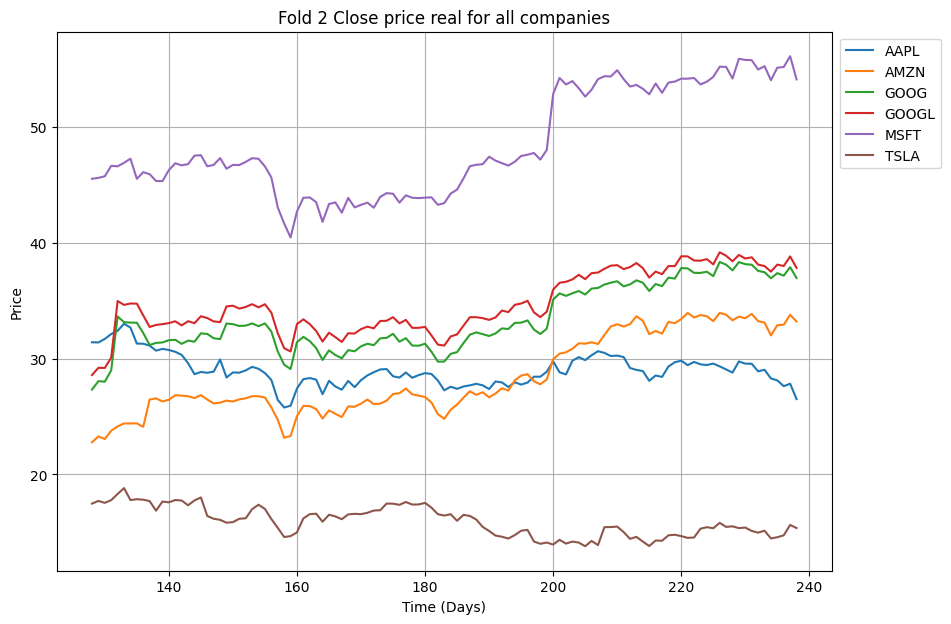

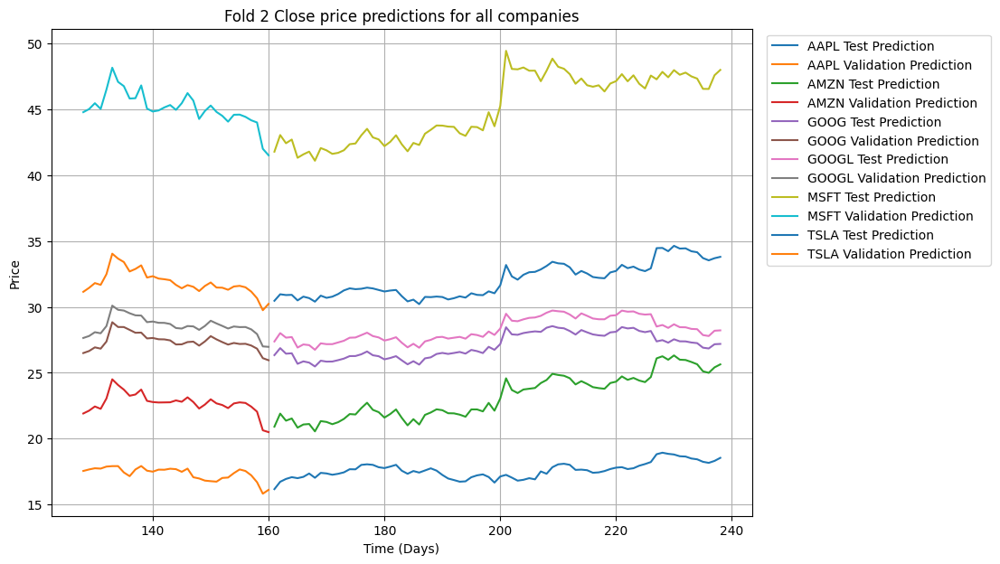

Fold_2 Done
Fold_3 Started


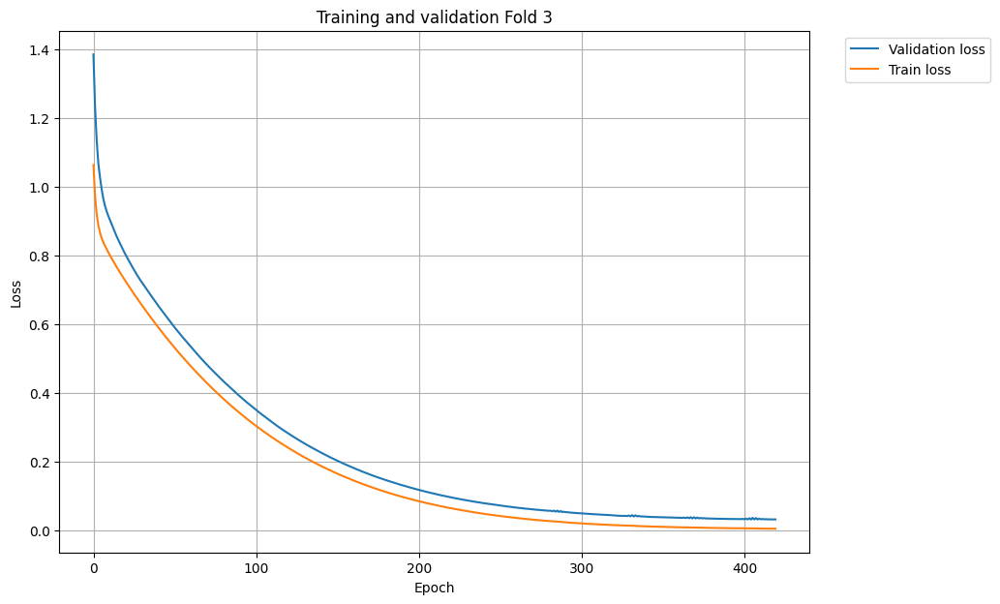

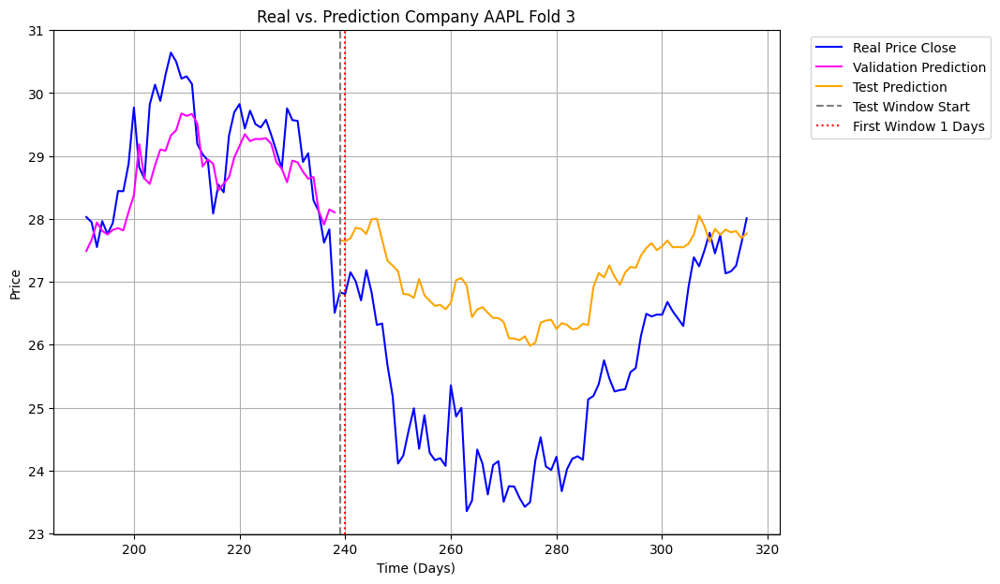

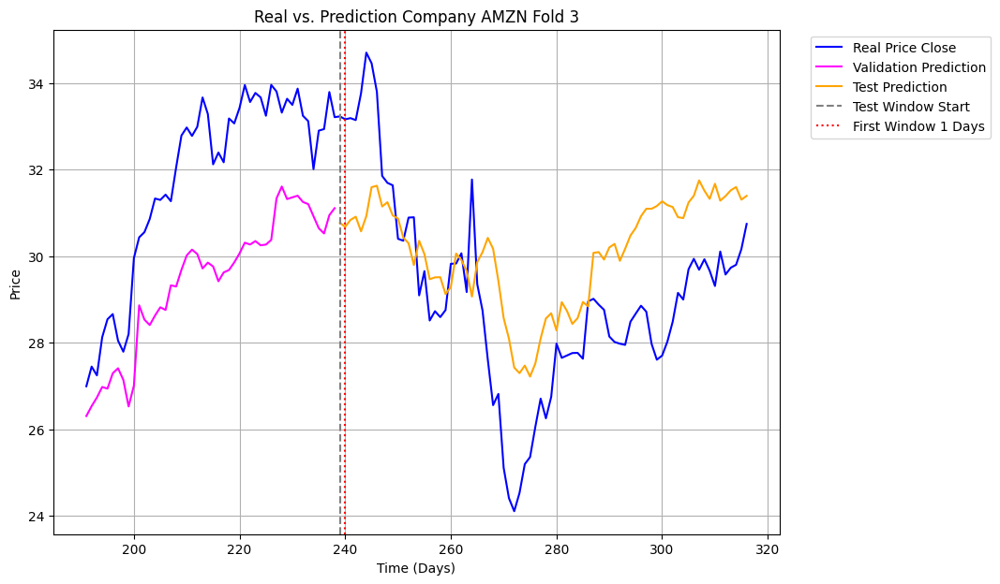

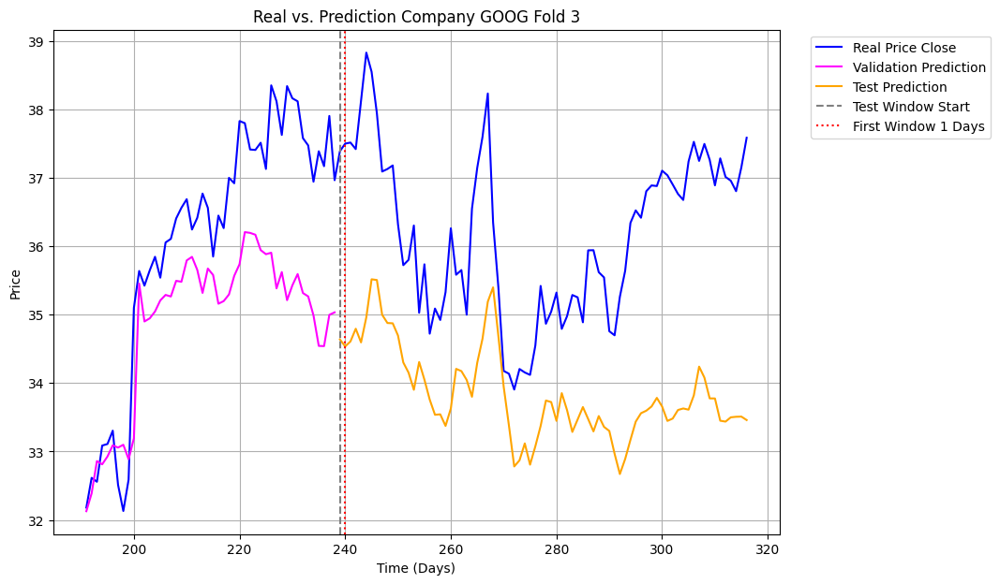

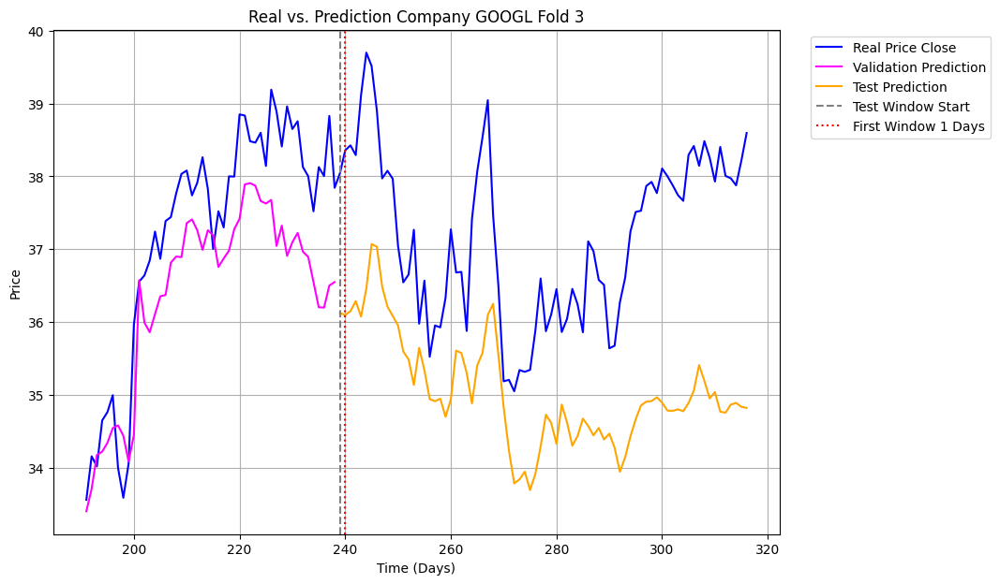

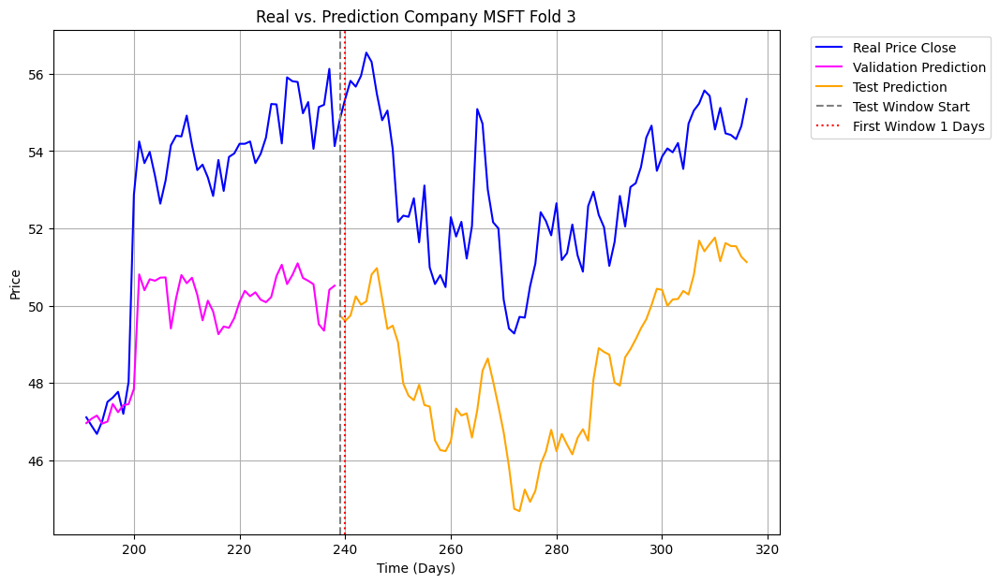

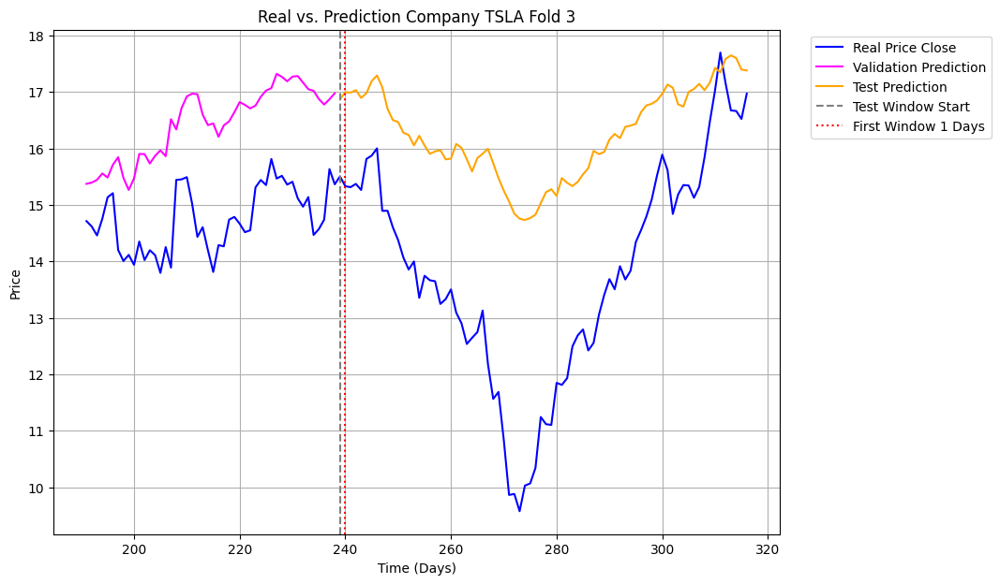

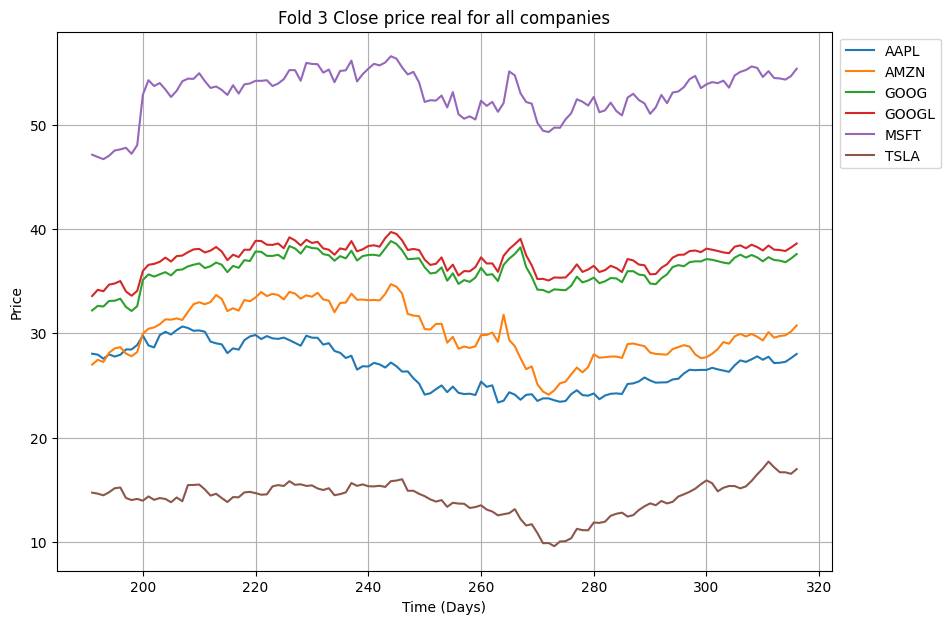

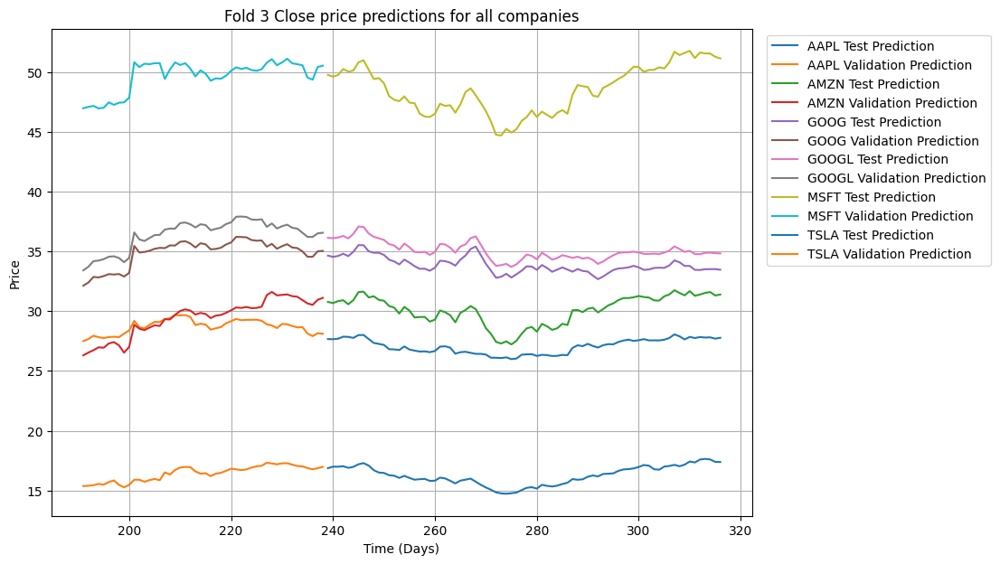

Fold_3 Done
Fold_4 Started


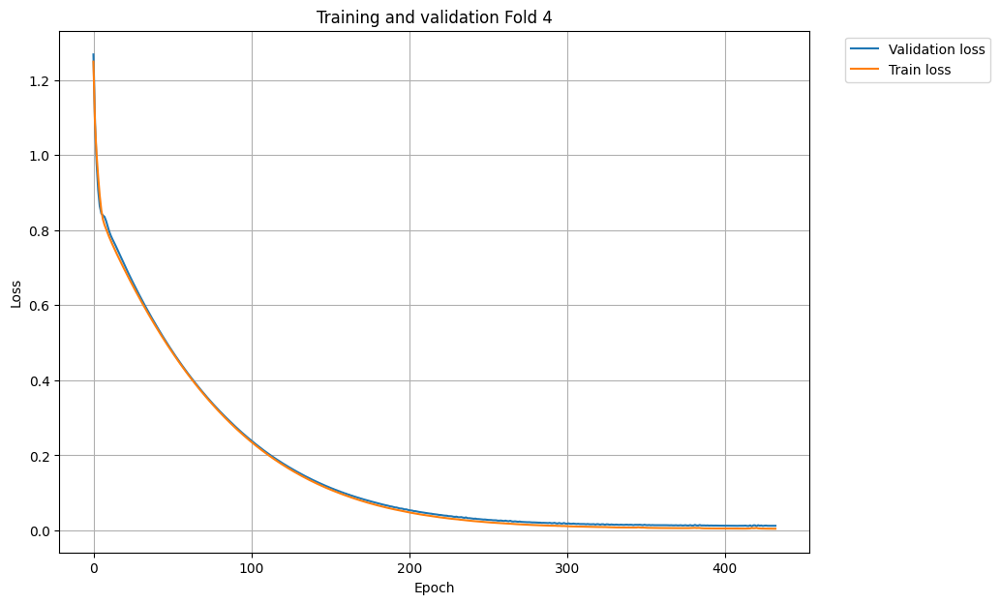

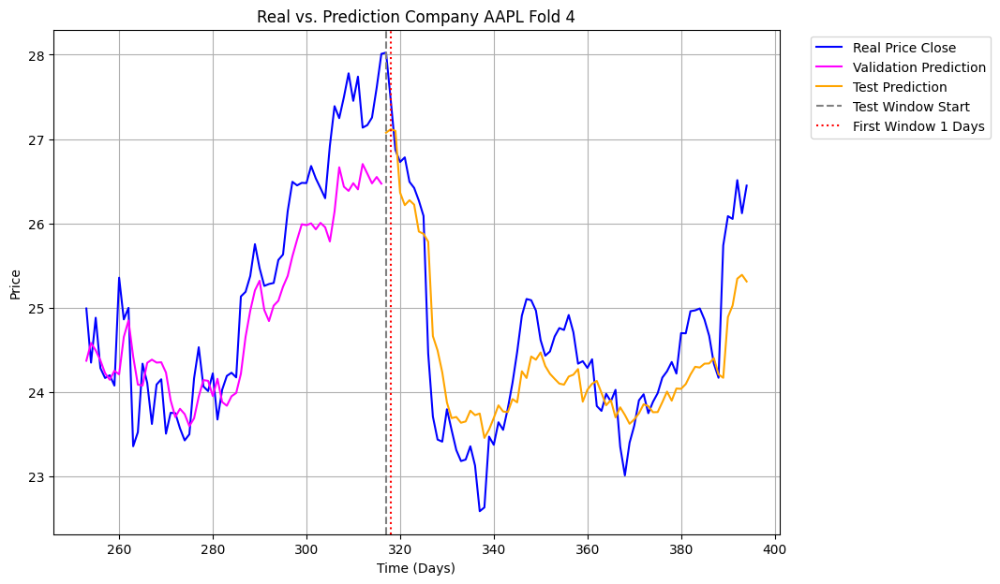

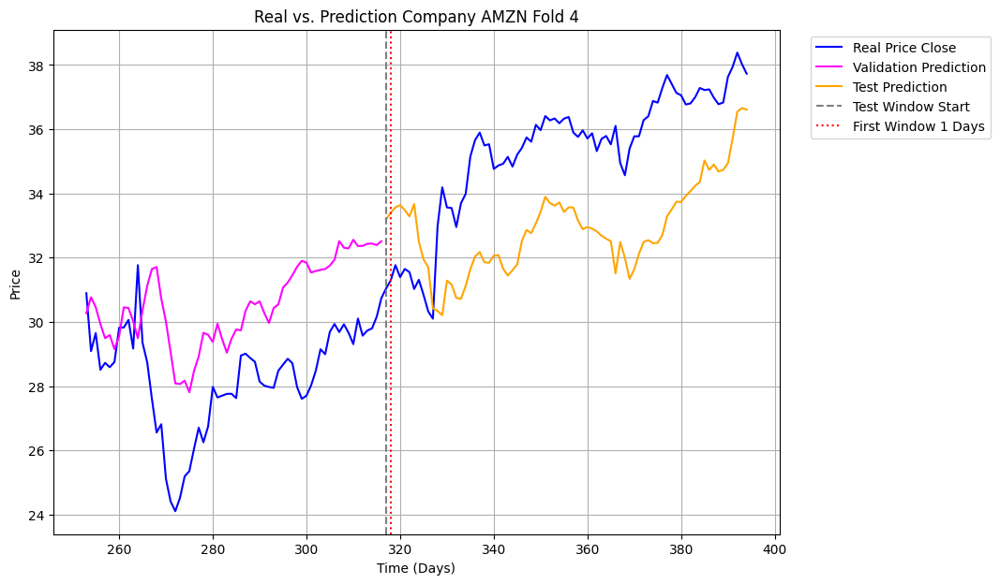

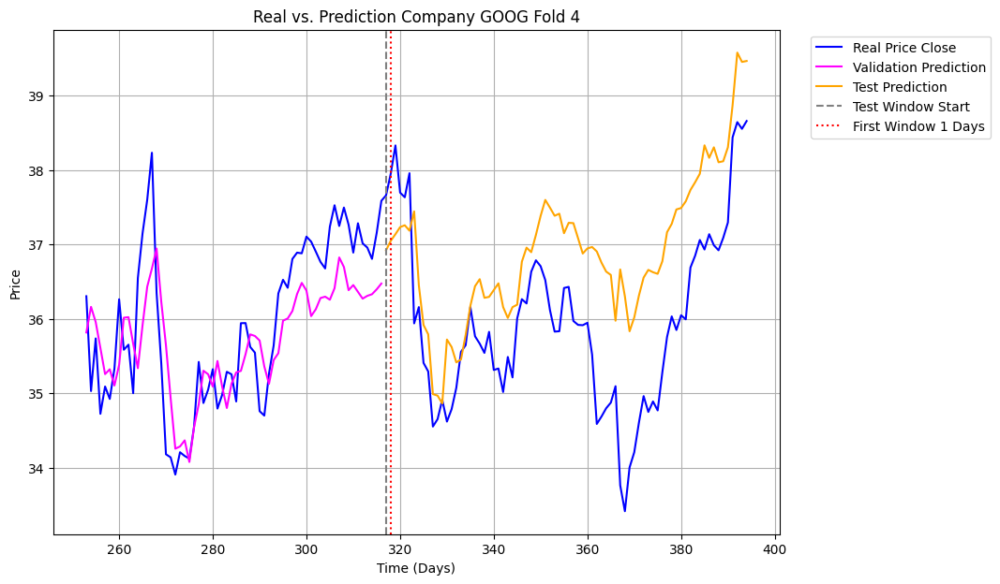

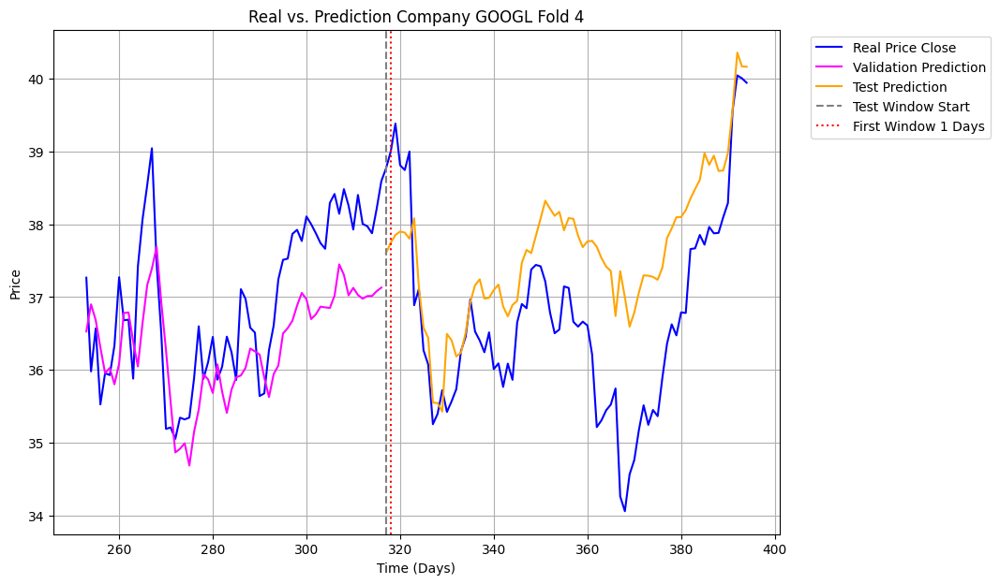

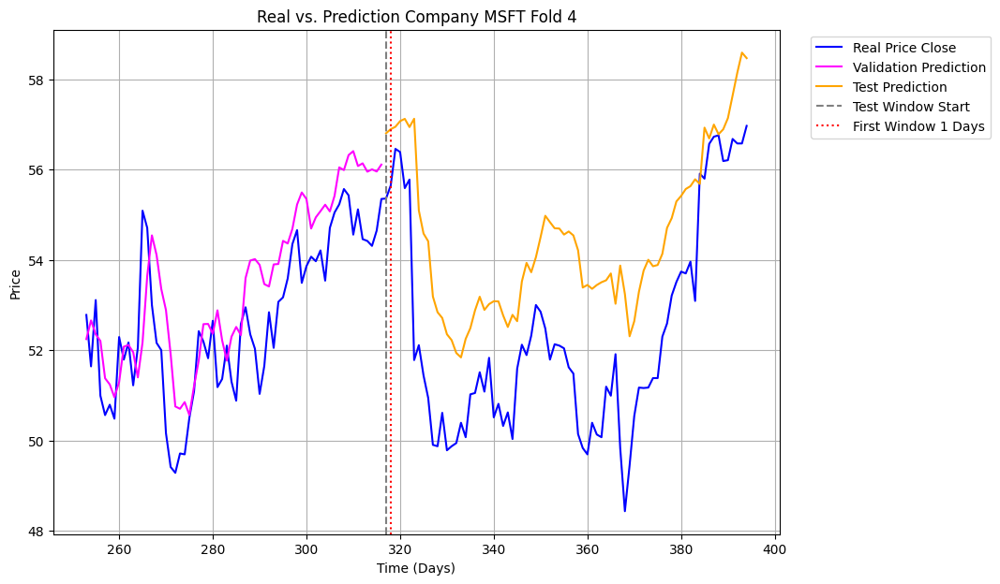

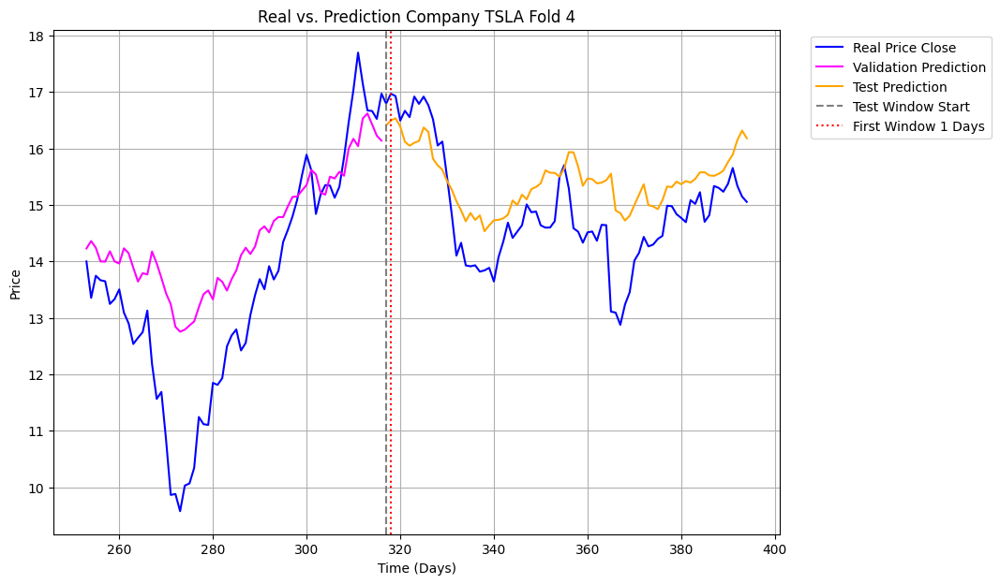

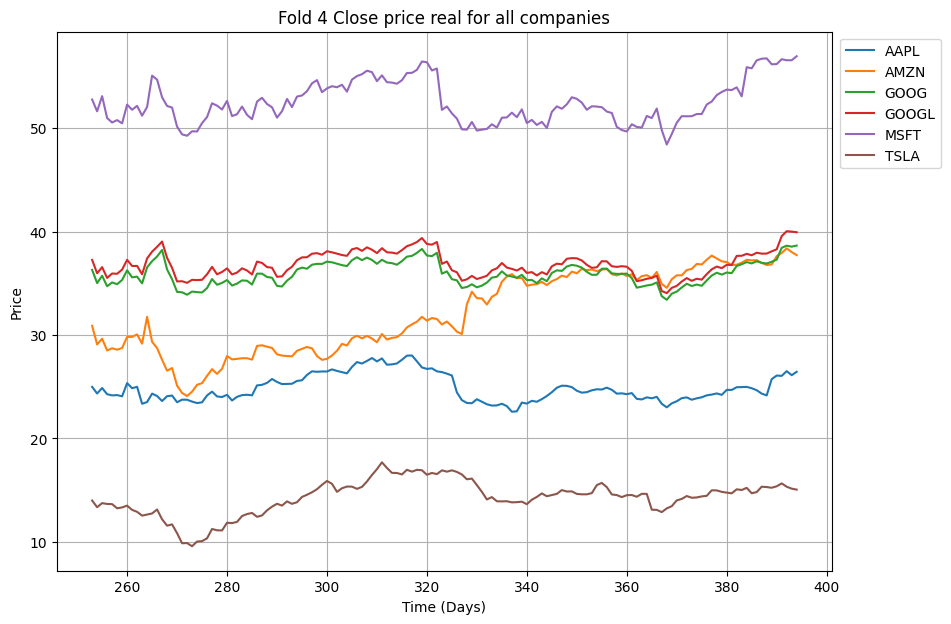

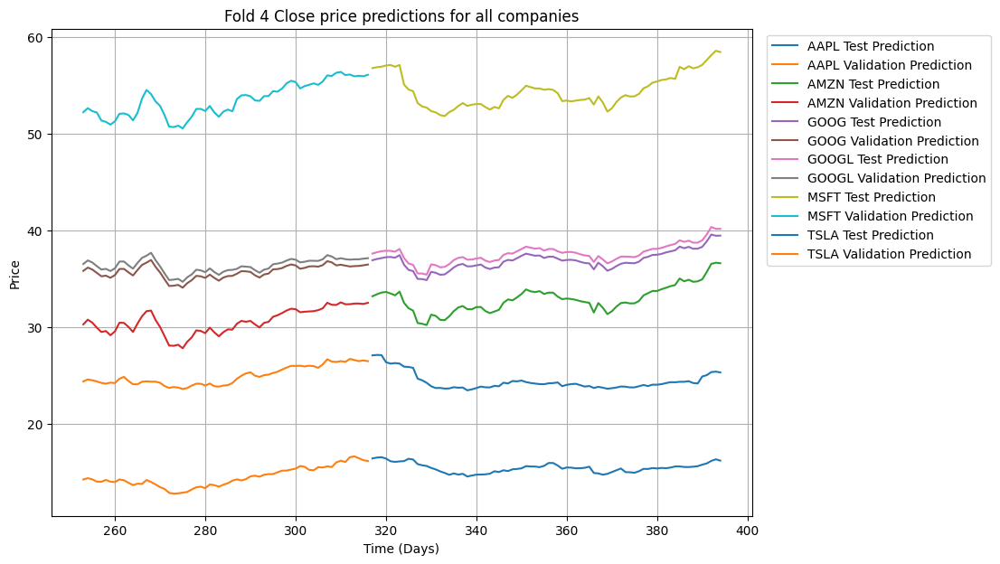

Fold_4 Done
Fold_5 Started


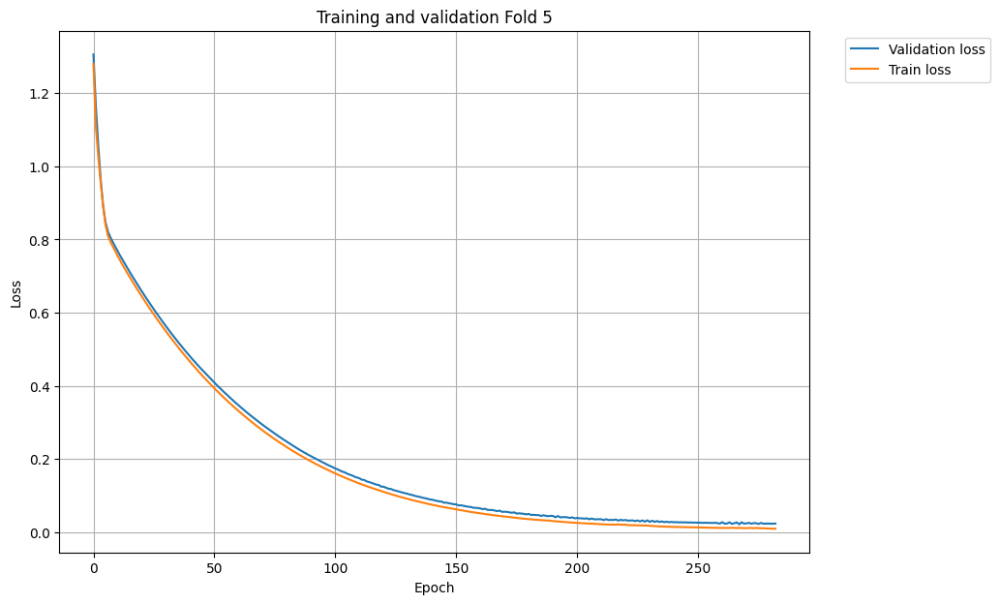

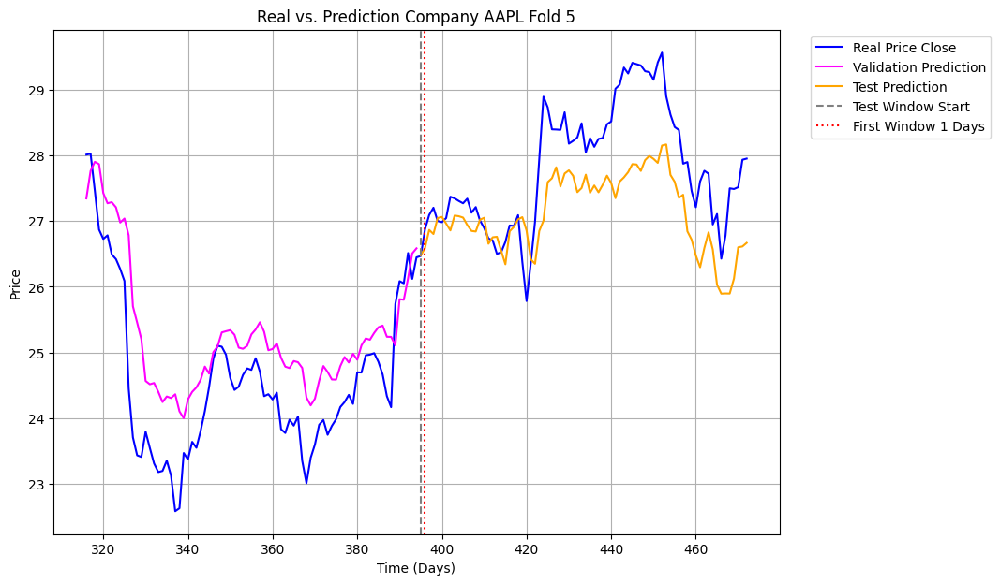

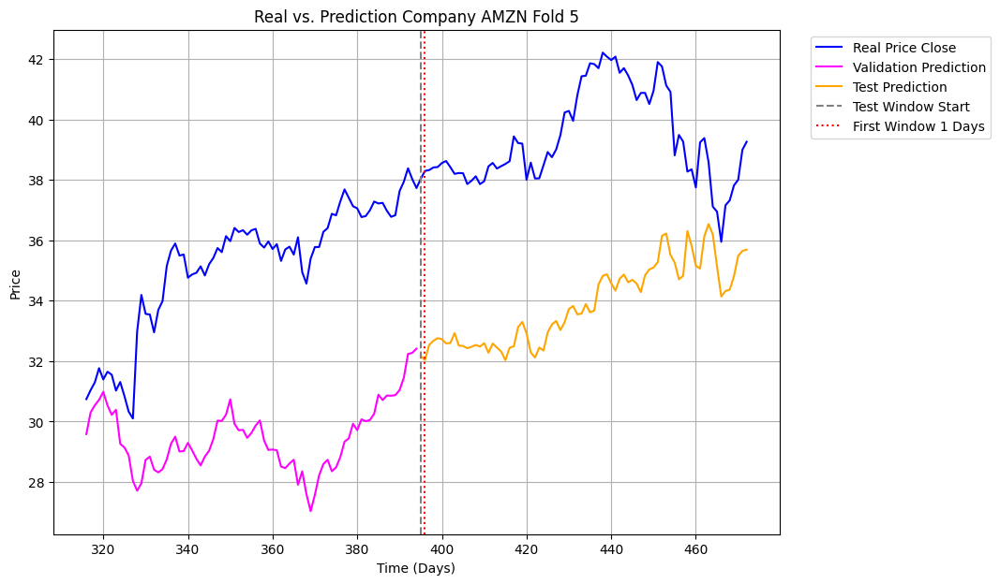

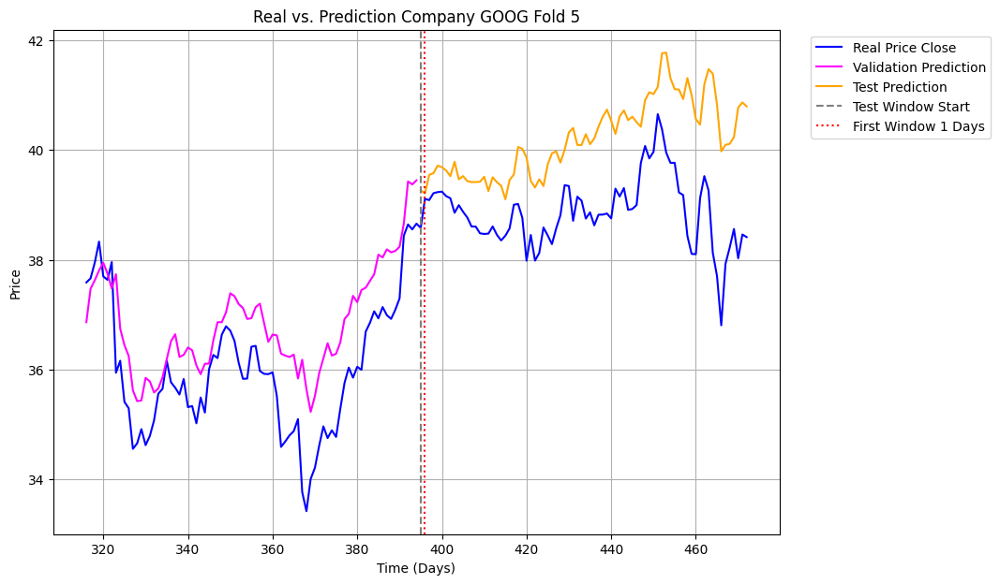

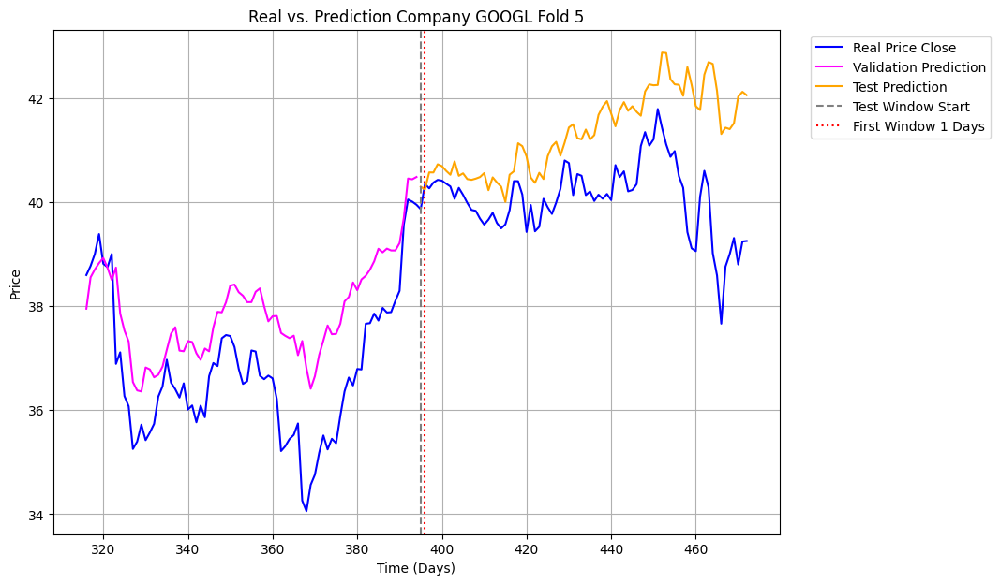

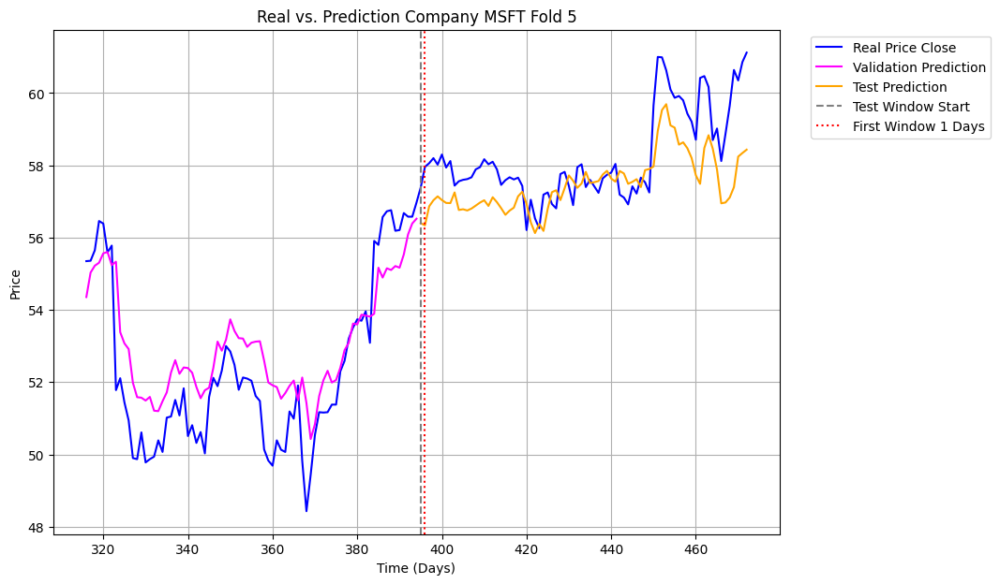

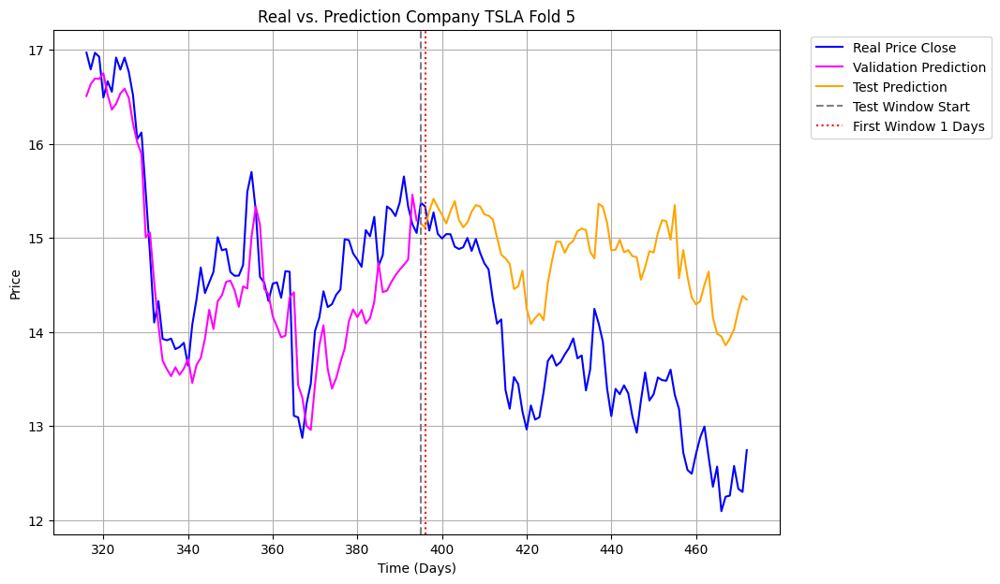

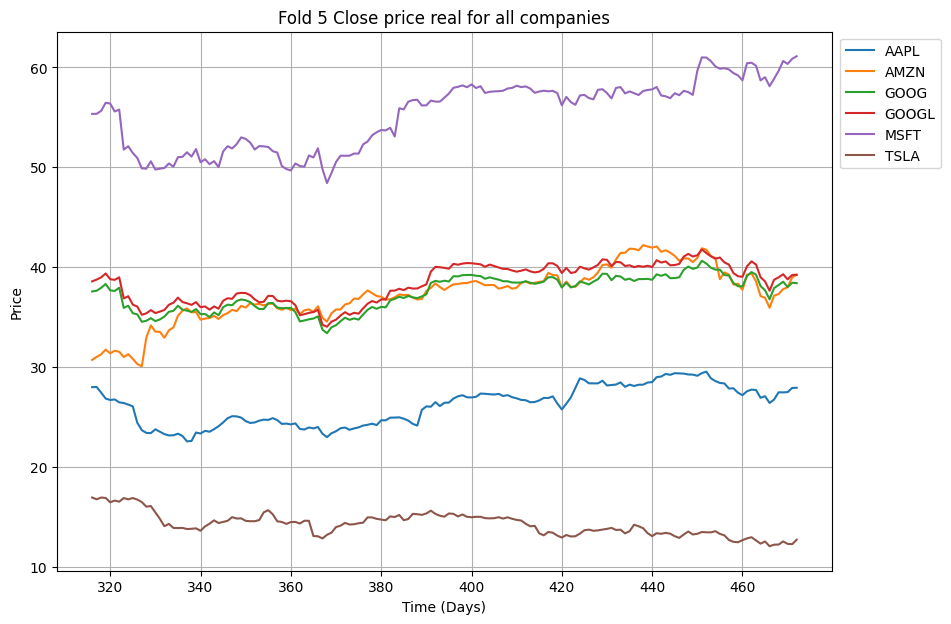

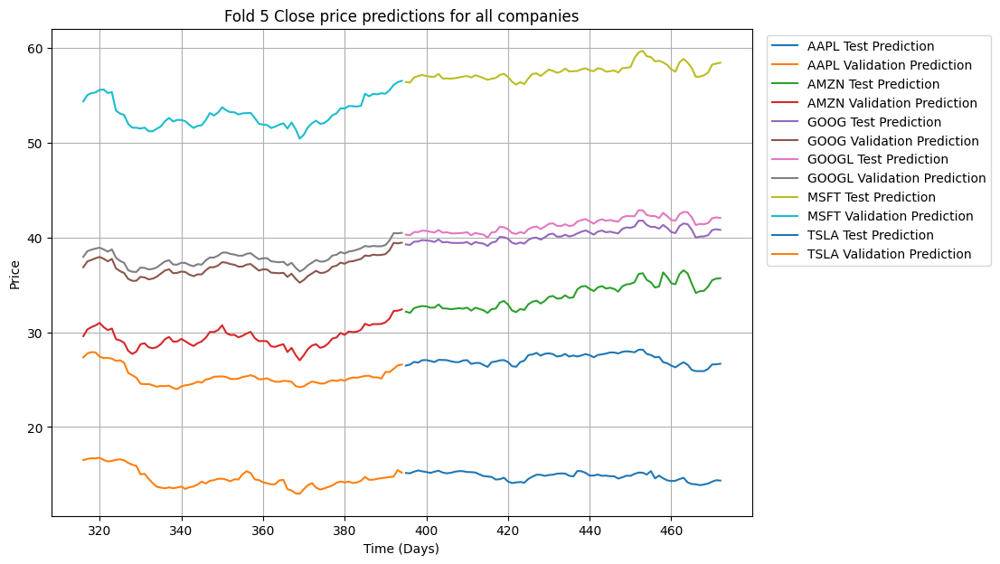

Fold_5 Done
Fold_6 Started


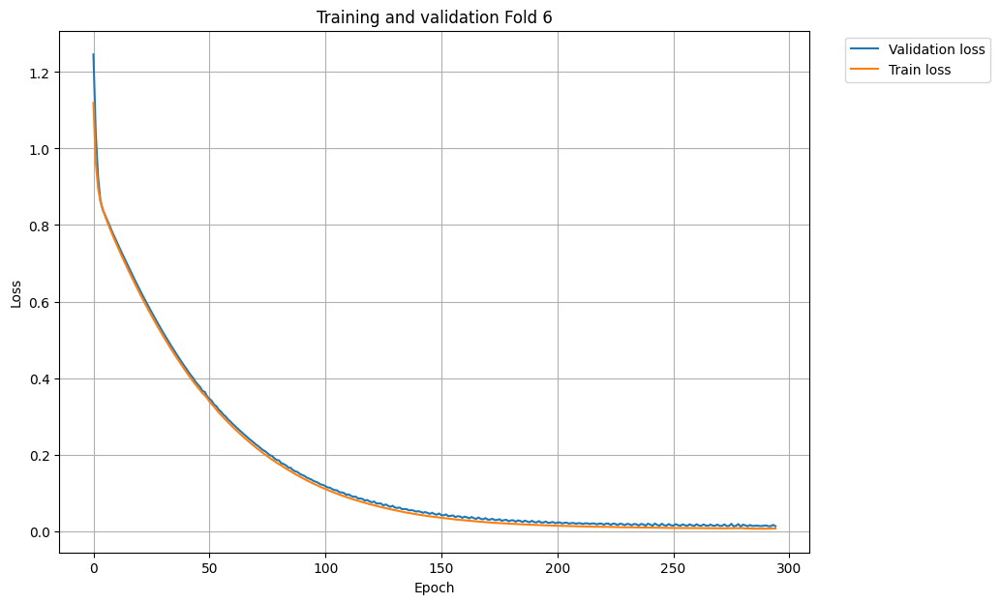

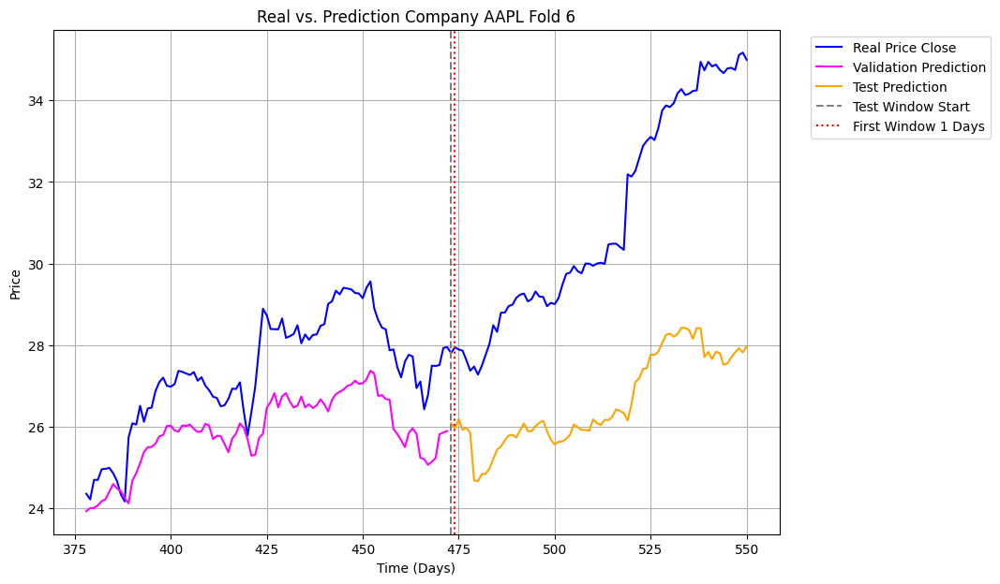

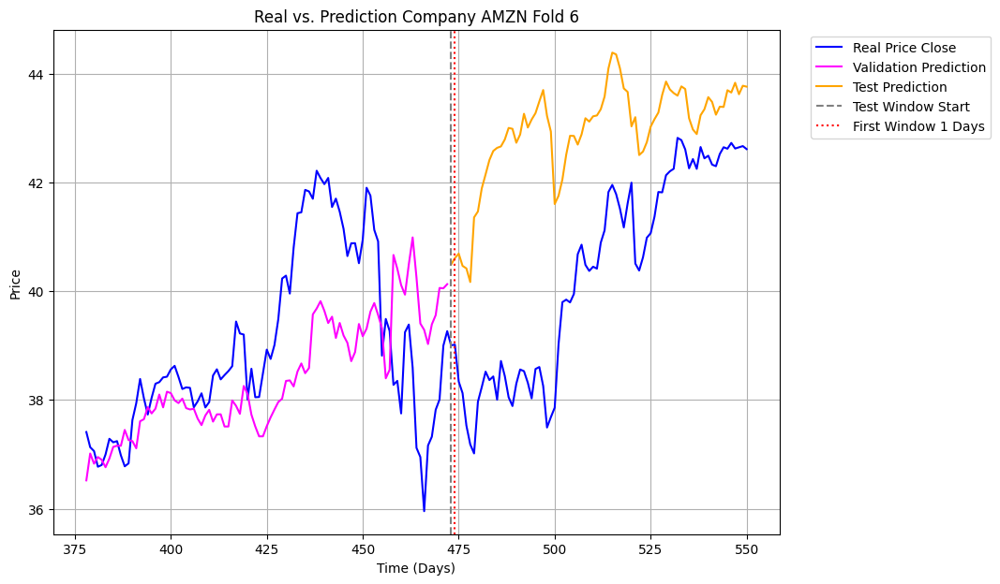

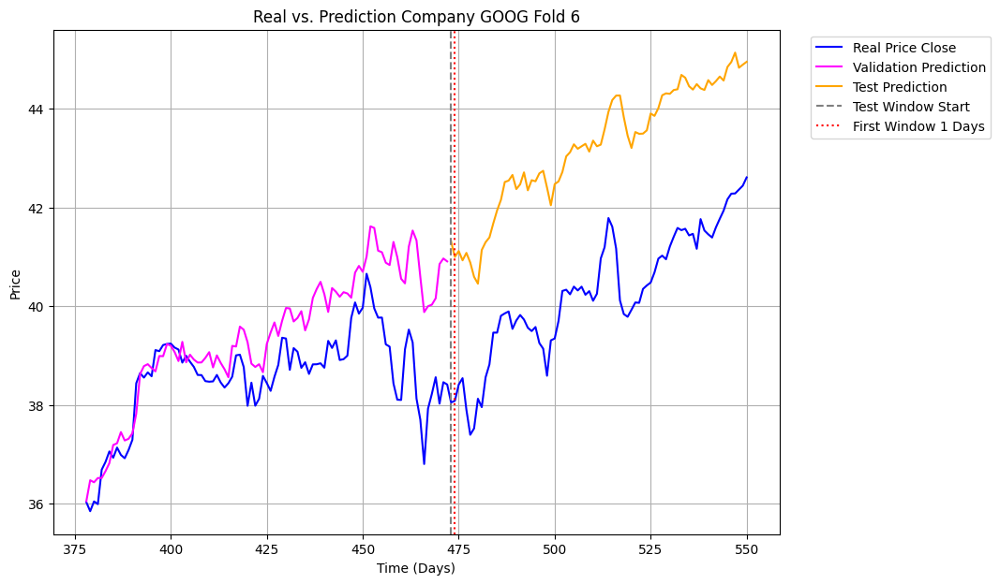

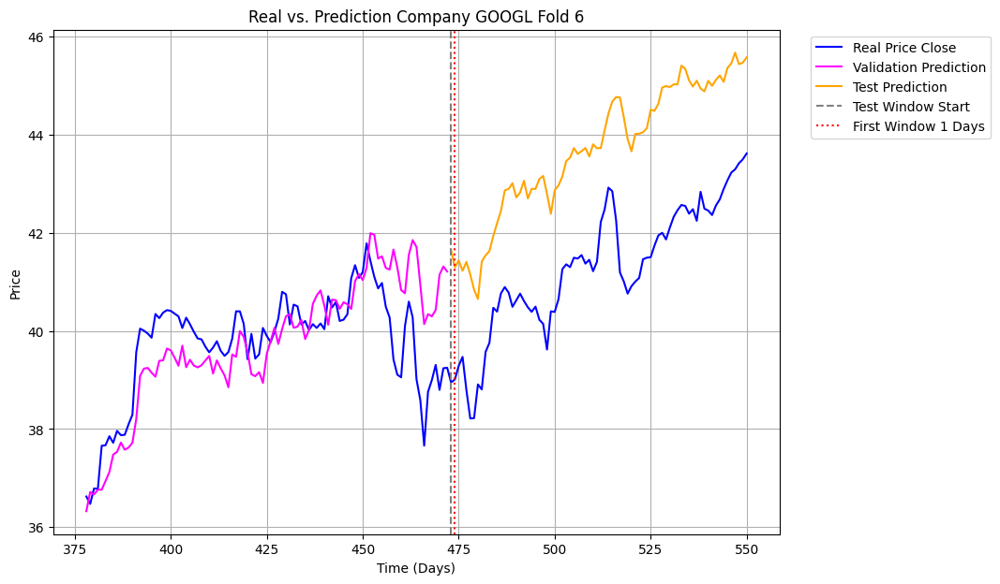

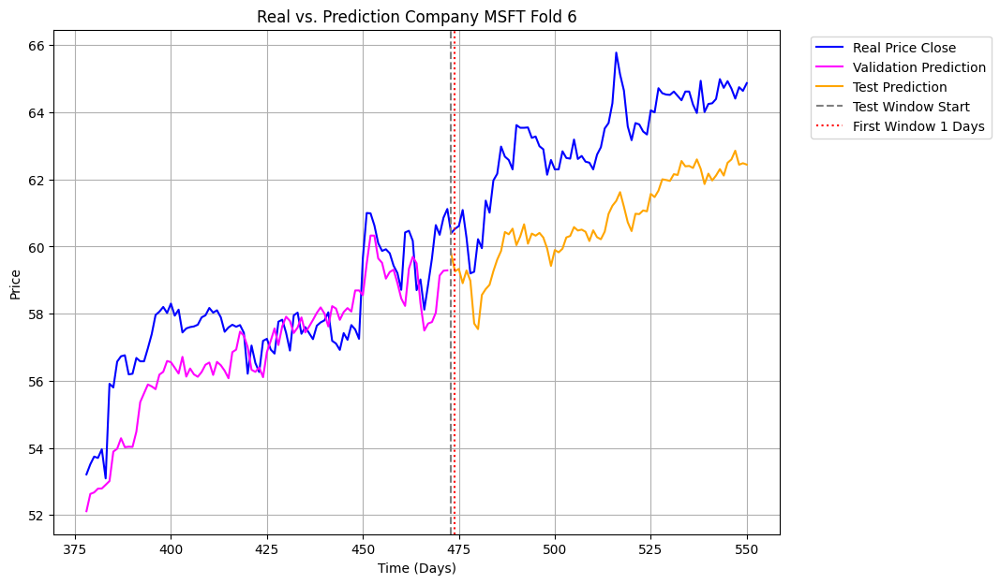

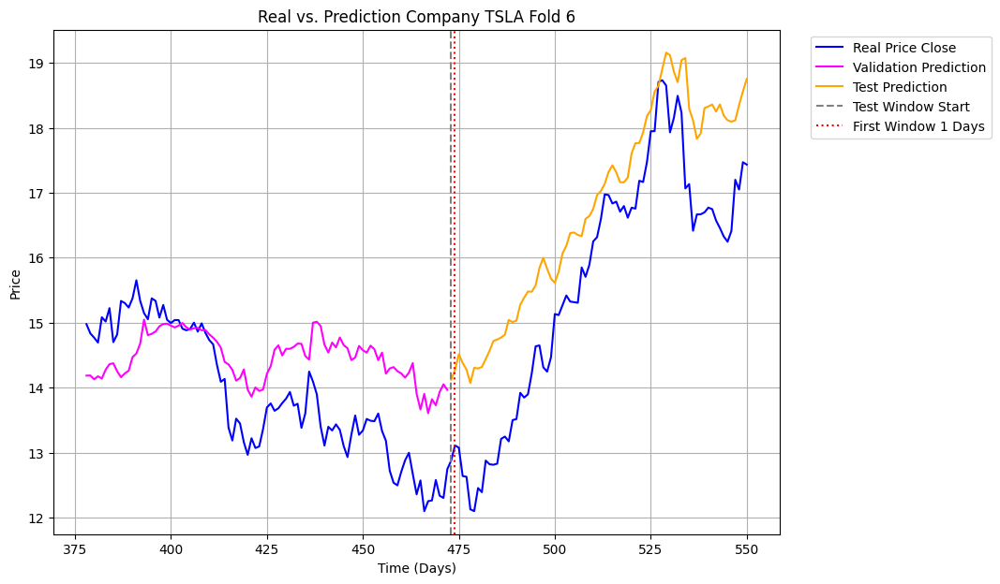

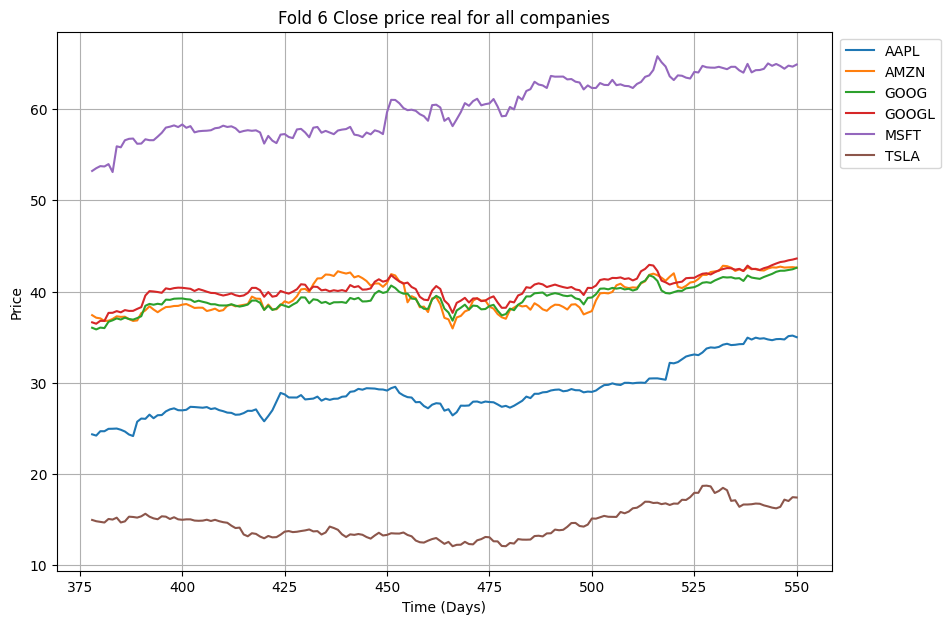

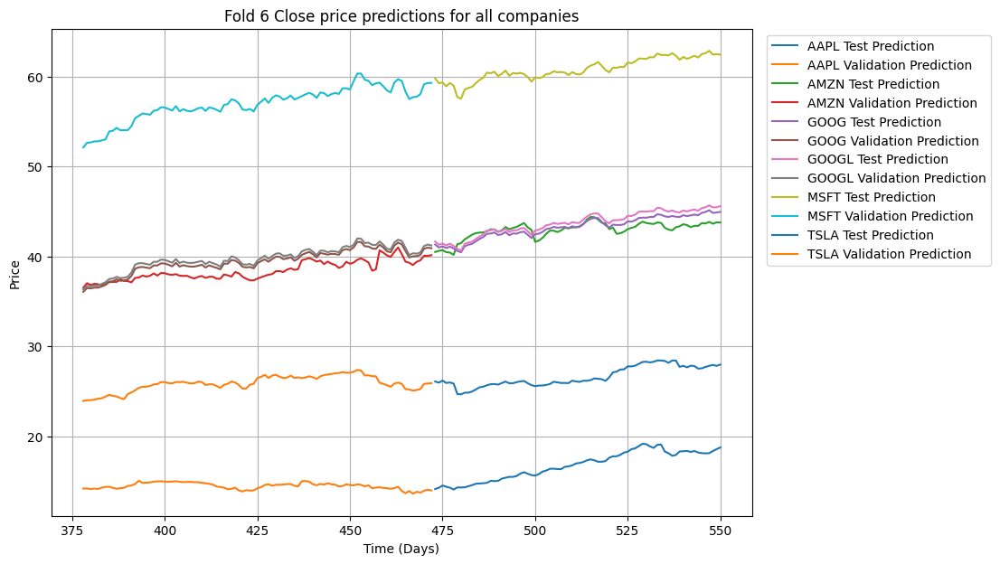

Fold_6 Done
Fold_7 Started


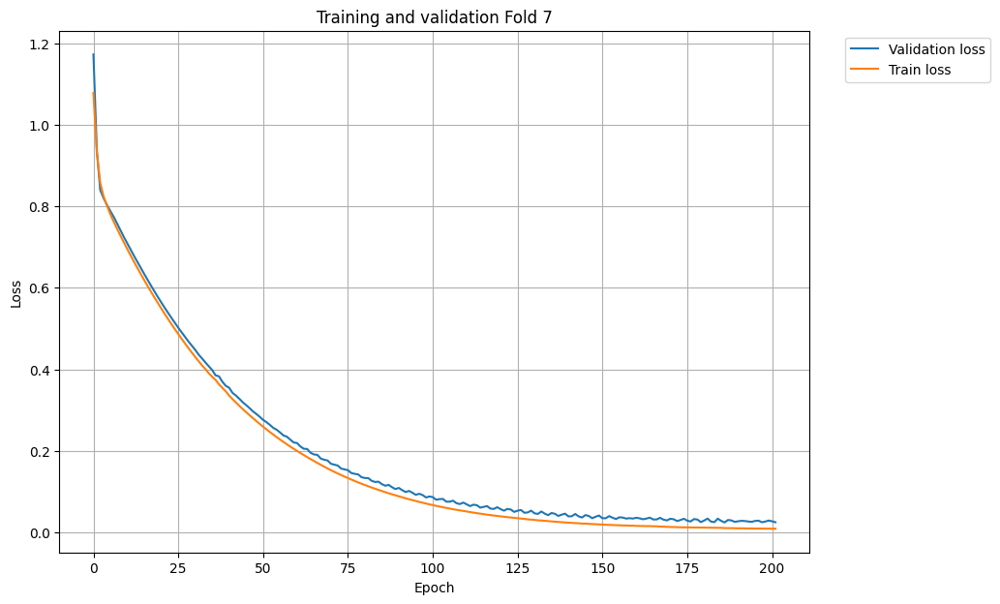

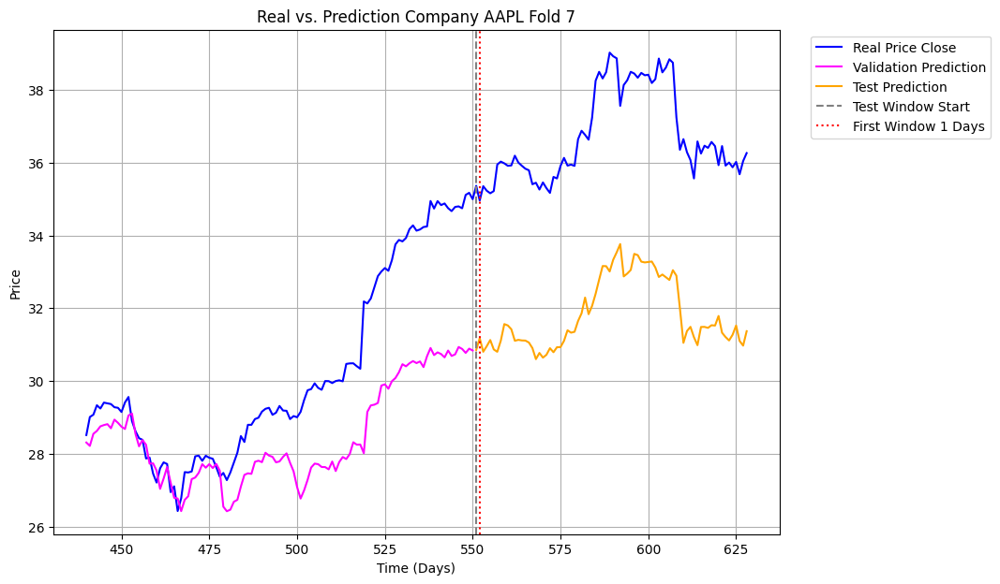

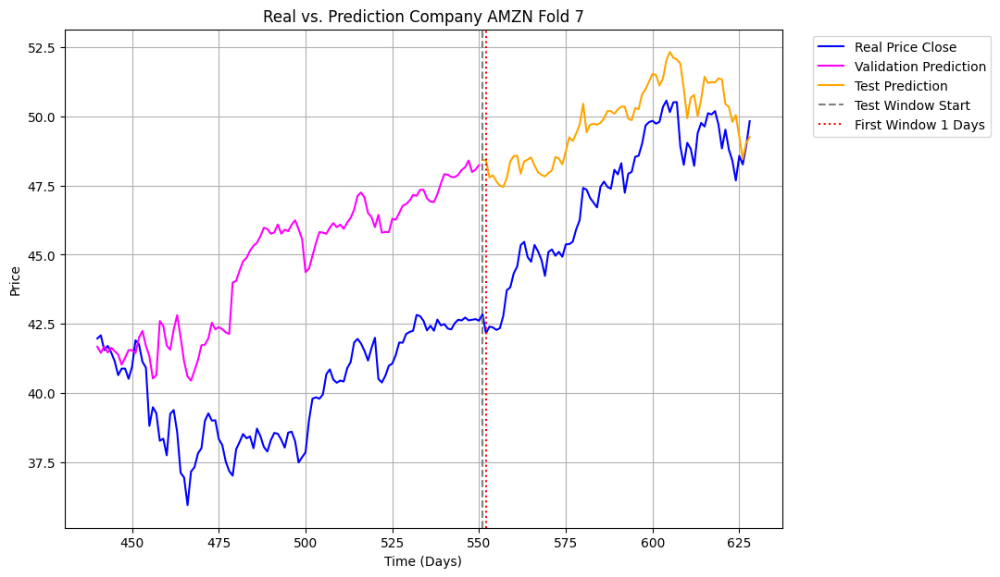

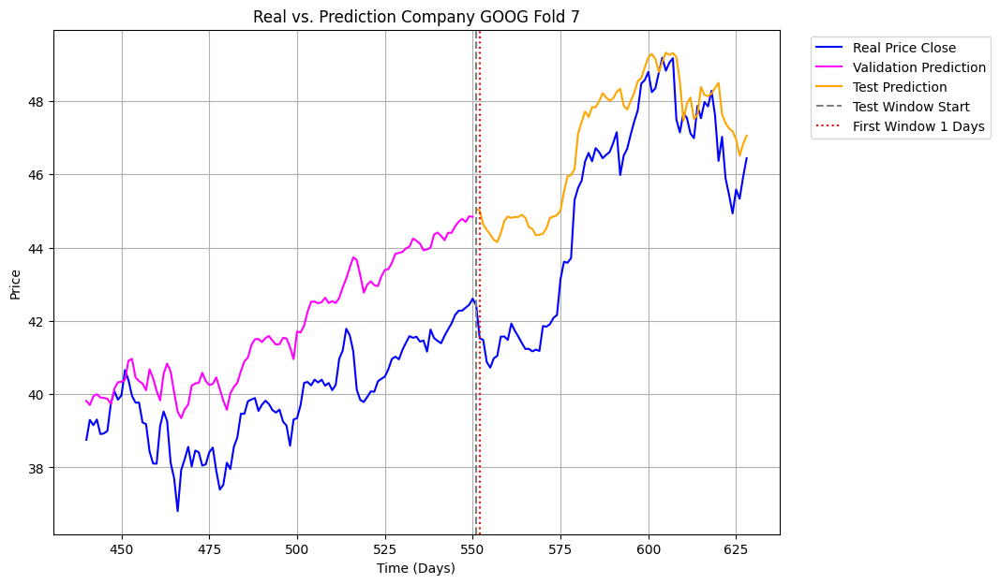

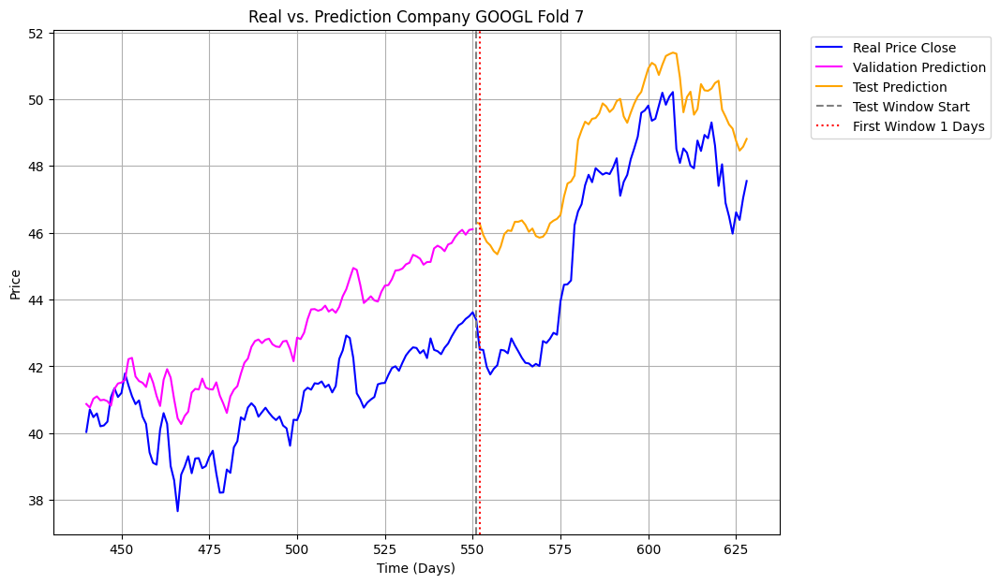

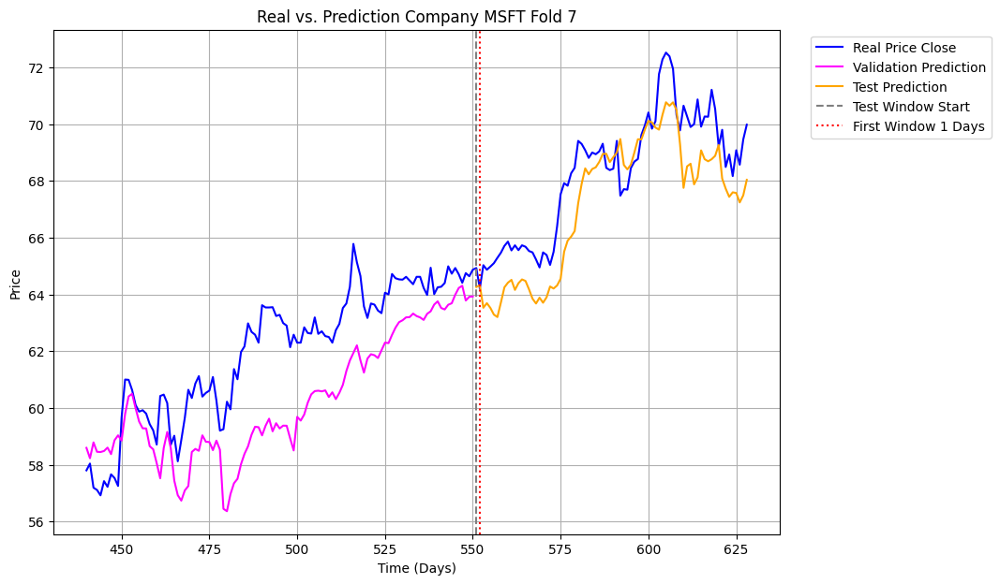

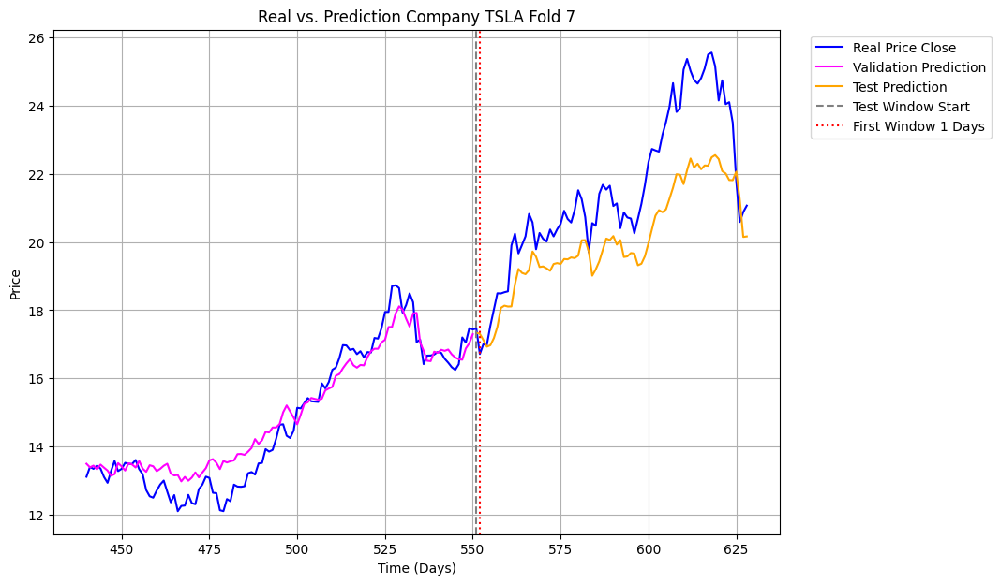

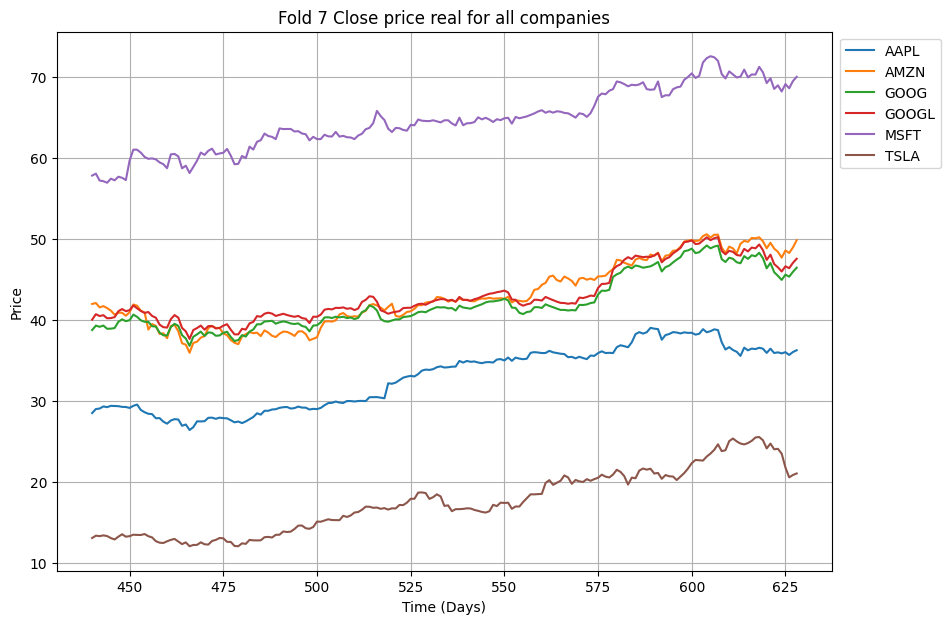

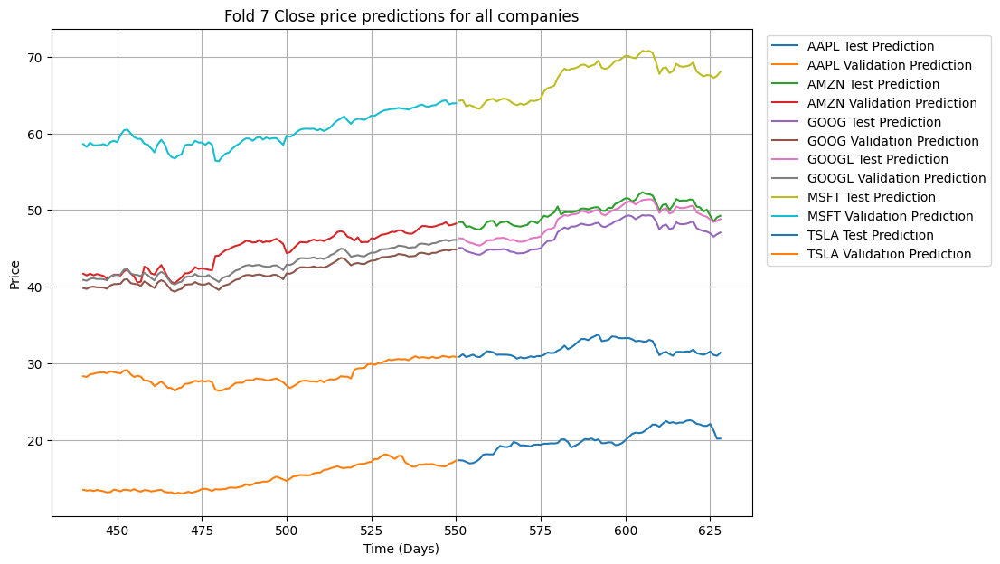

Fold_7 Done
Fold_8 Started


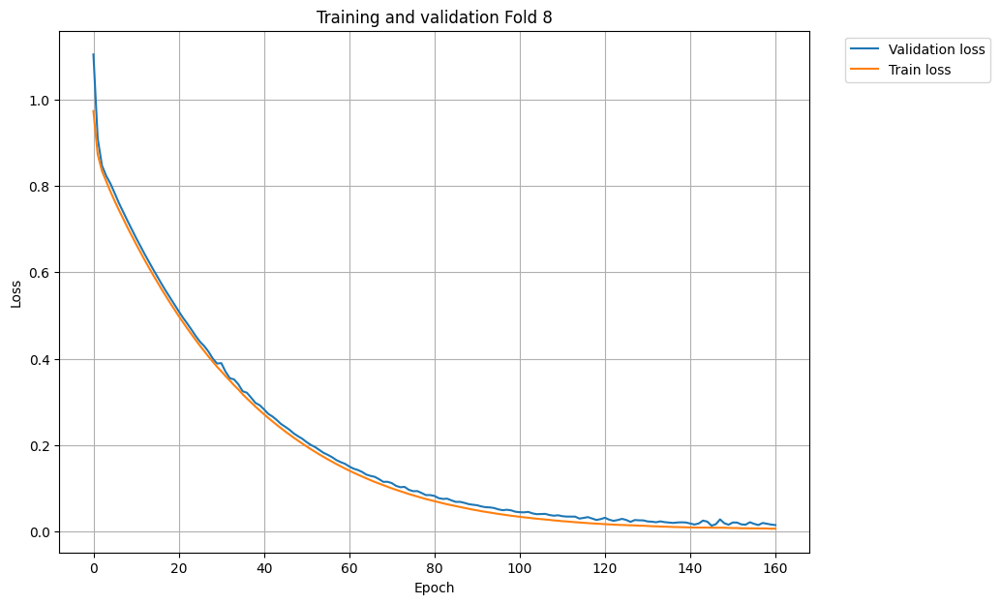

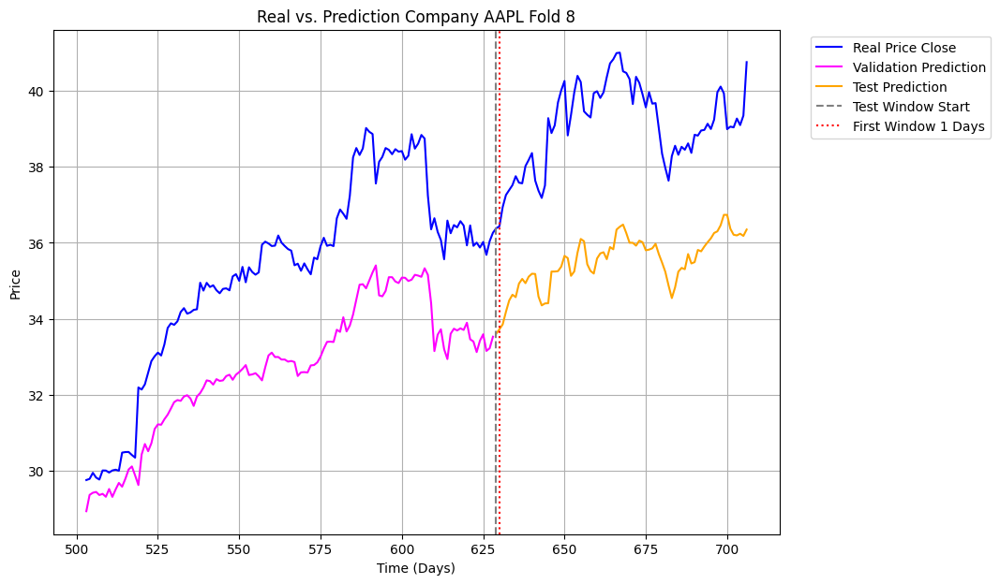

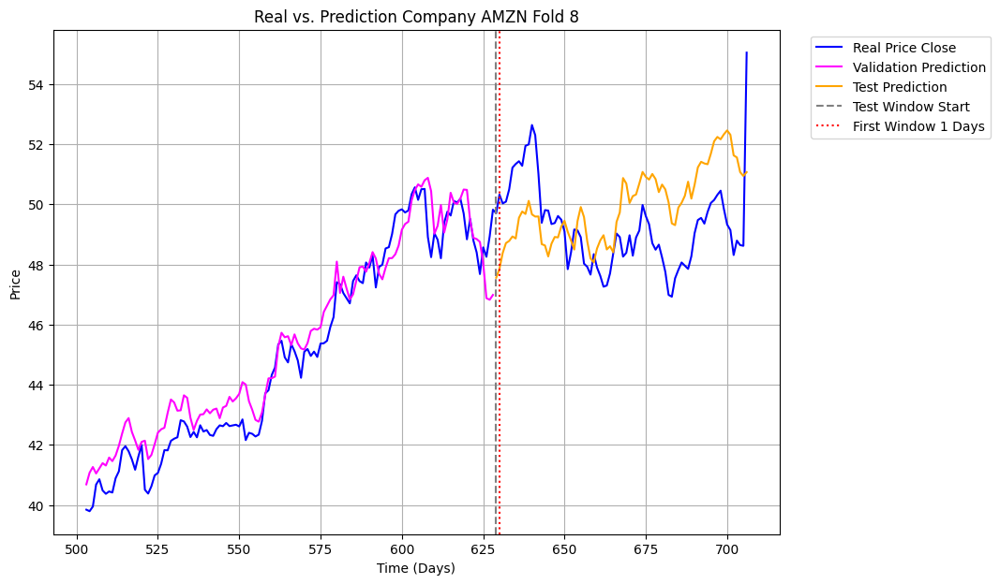

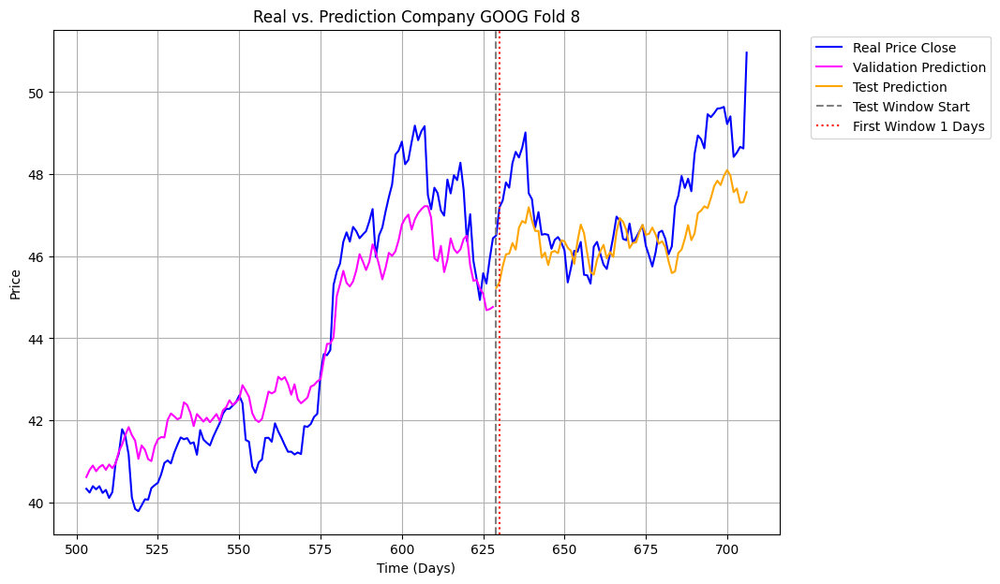

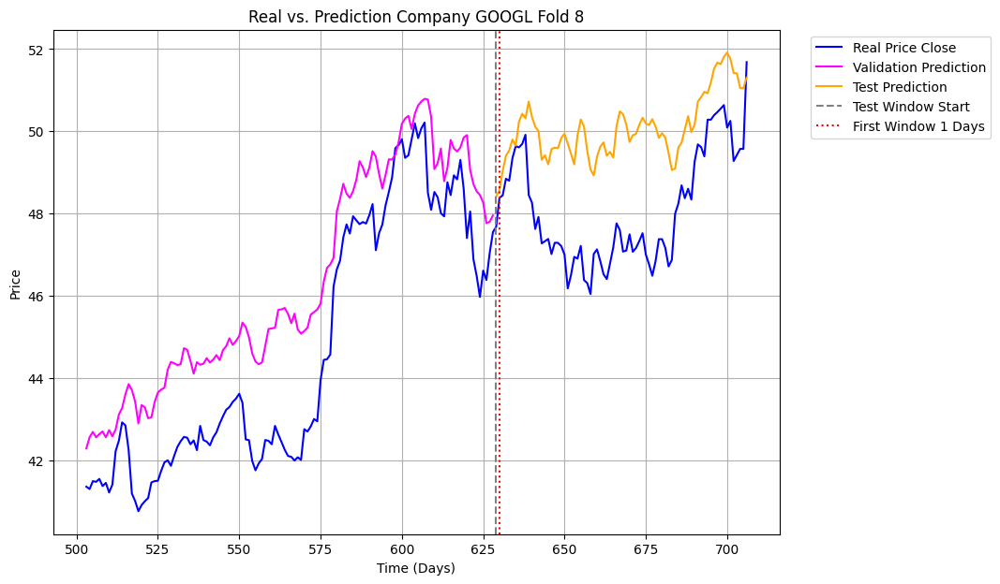

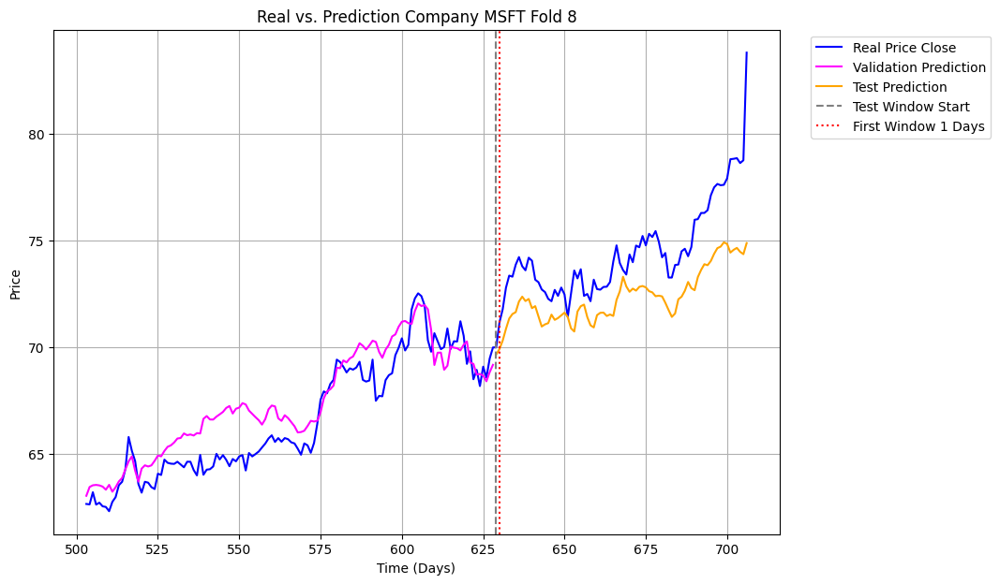

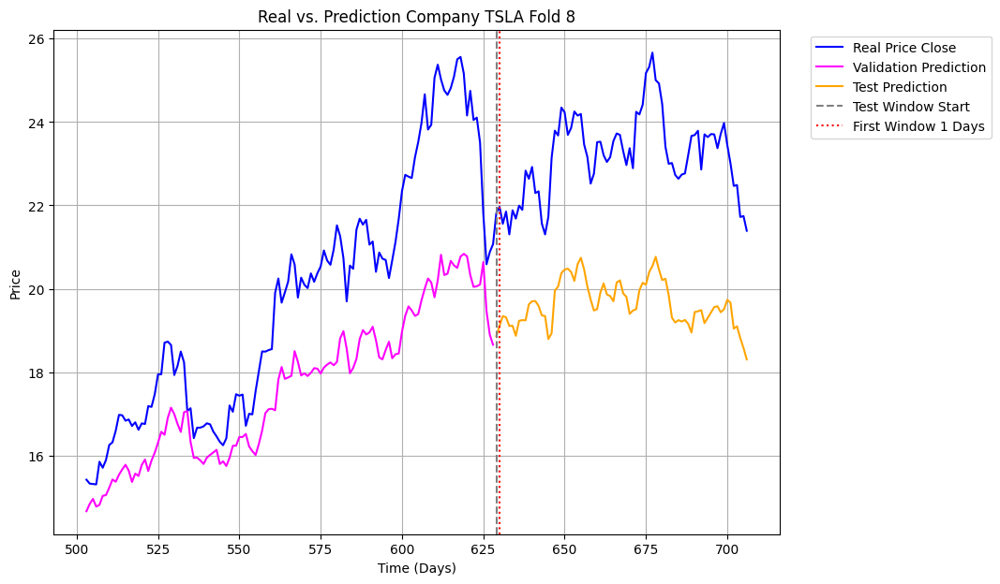

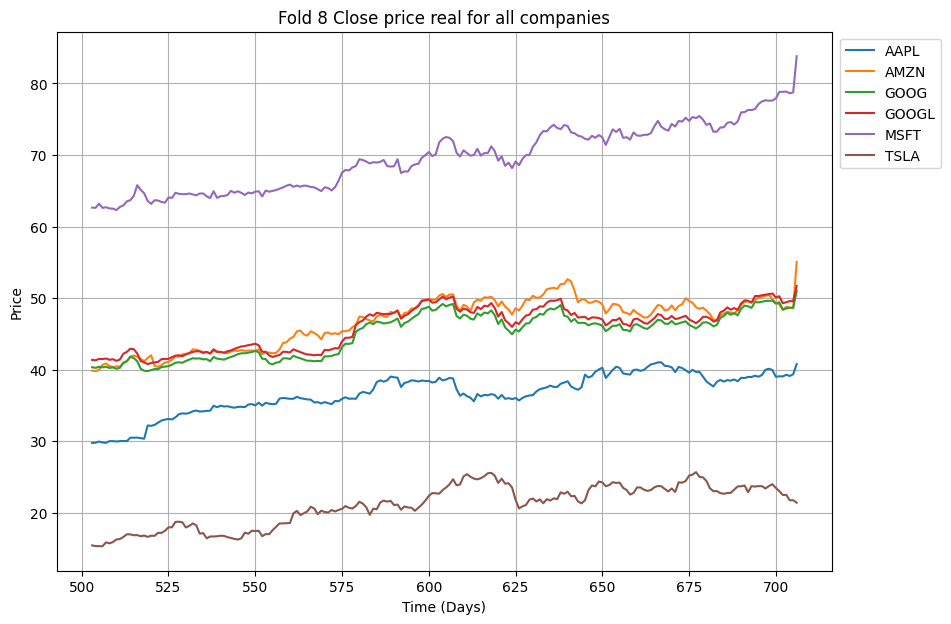

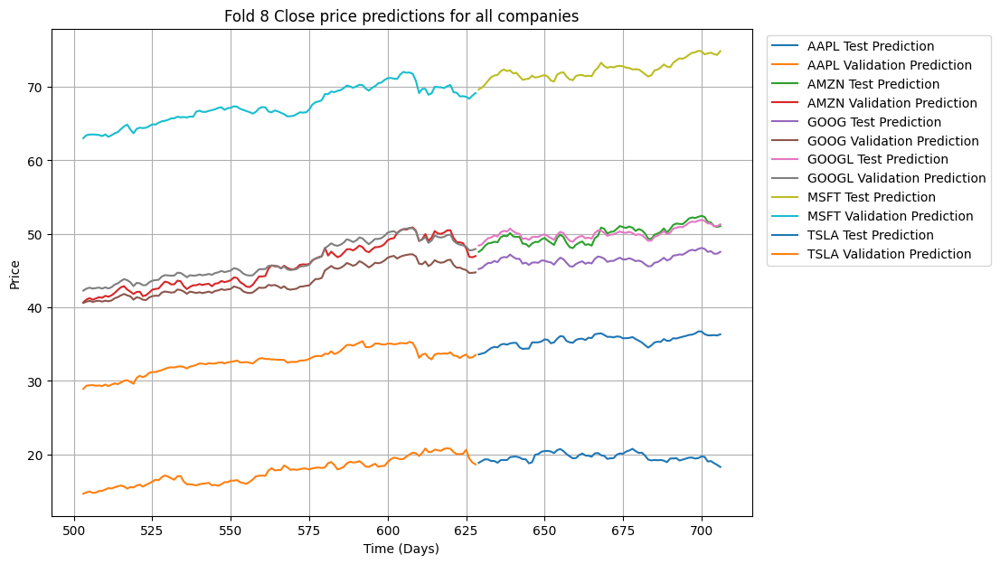

Fold_8 Done
Fold_9 Started


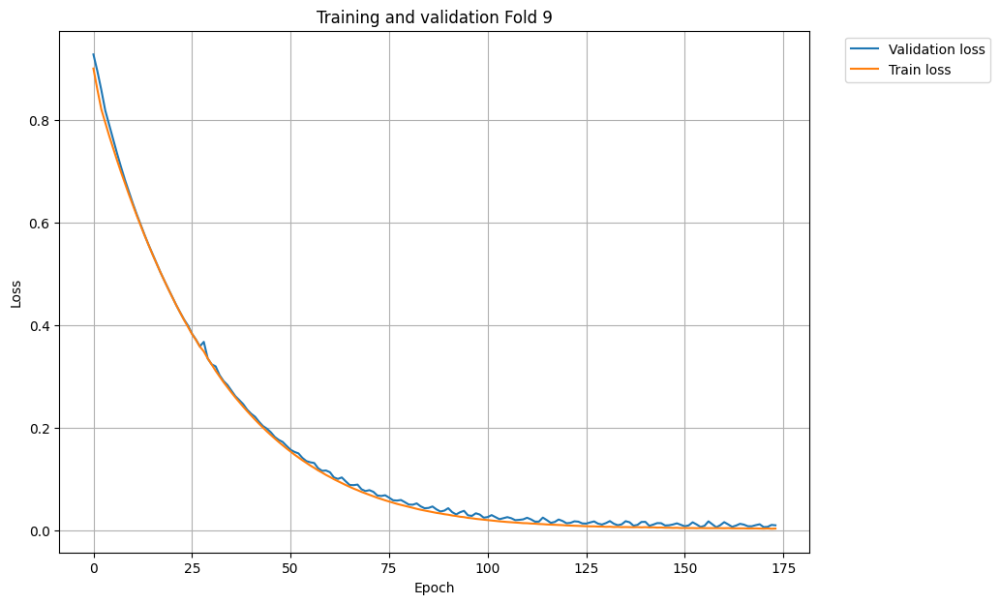

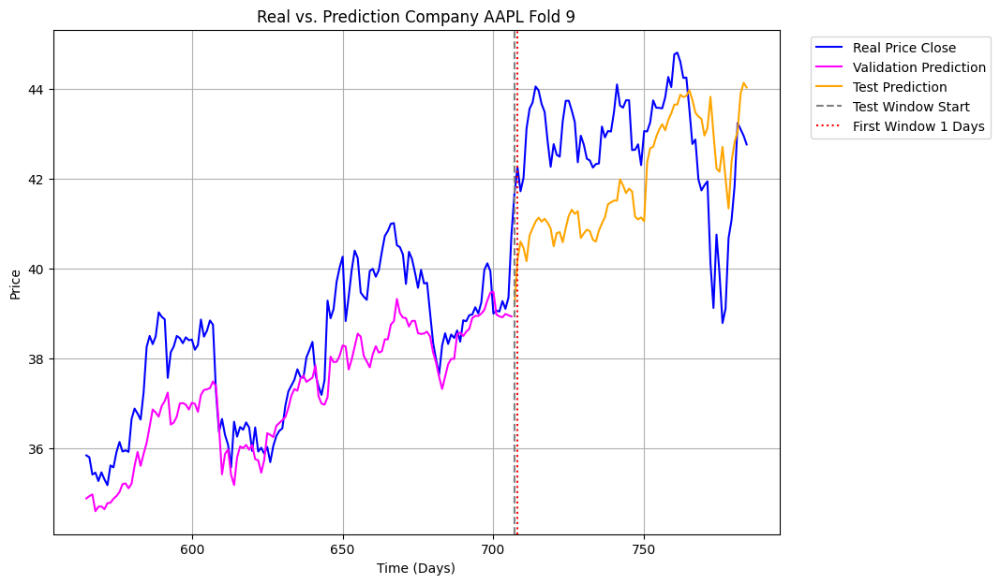

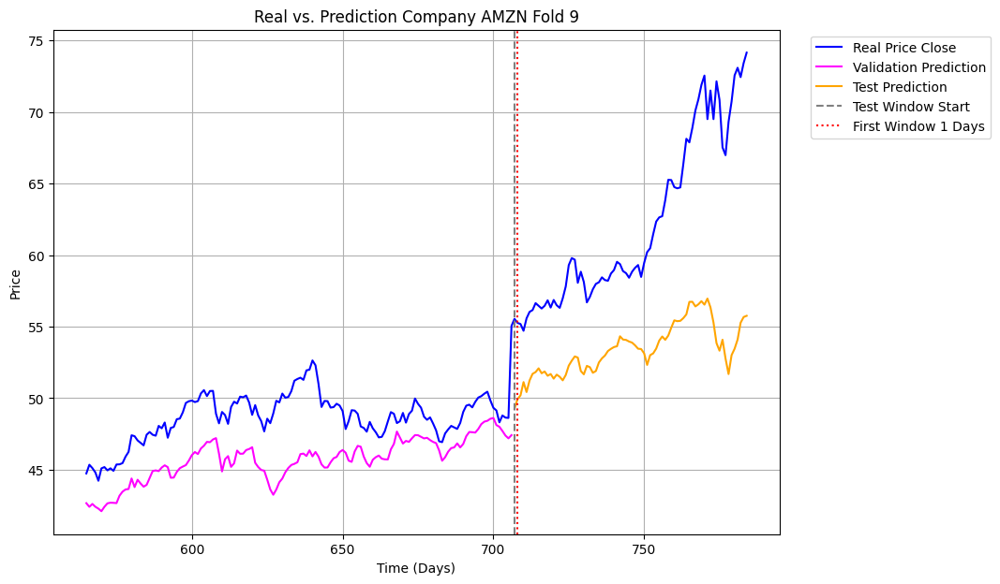

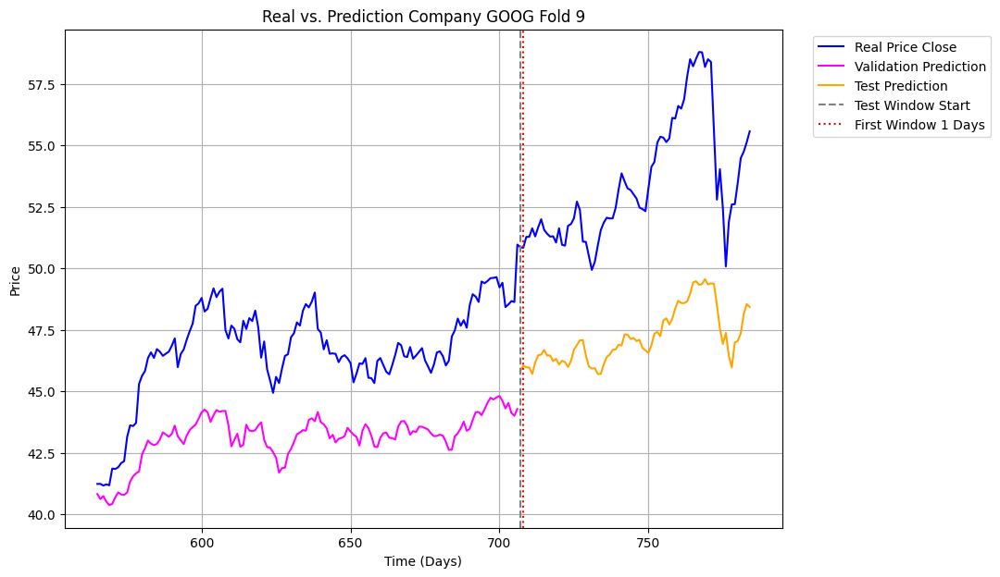

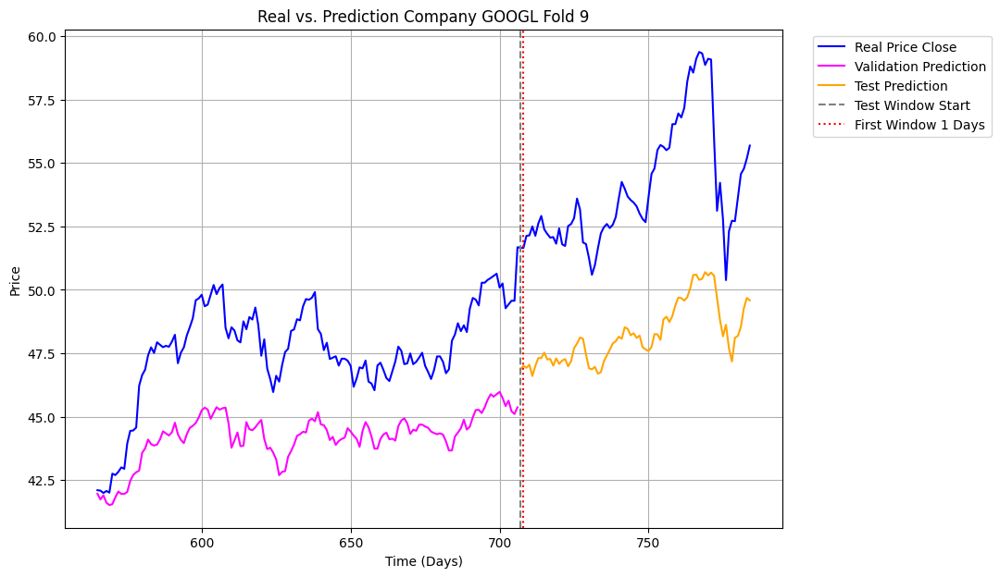

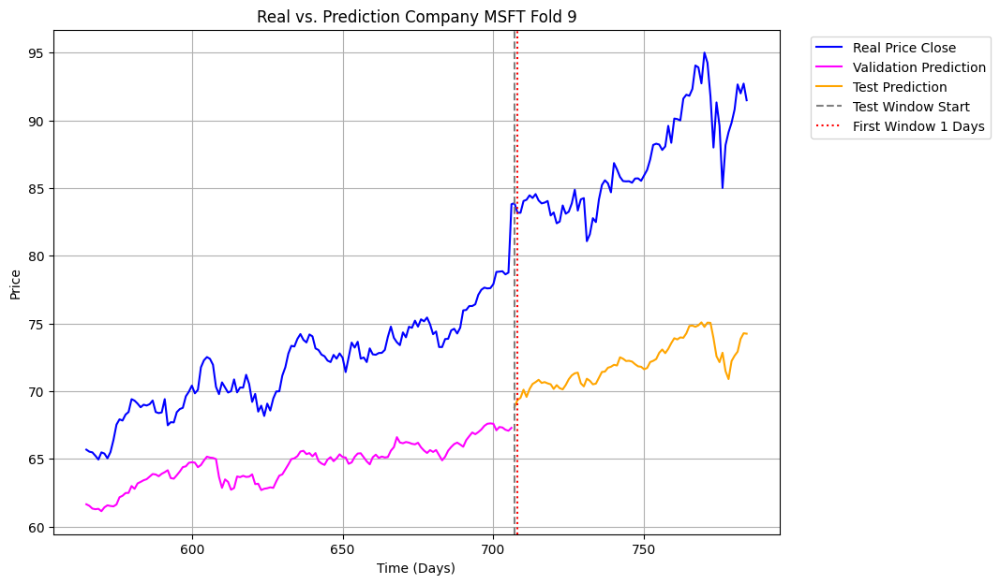

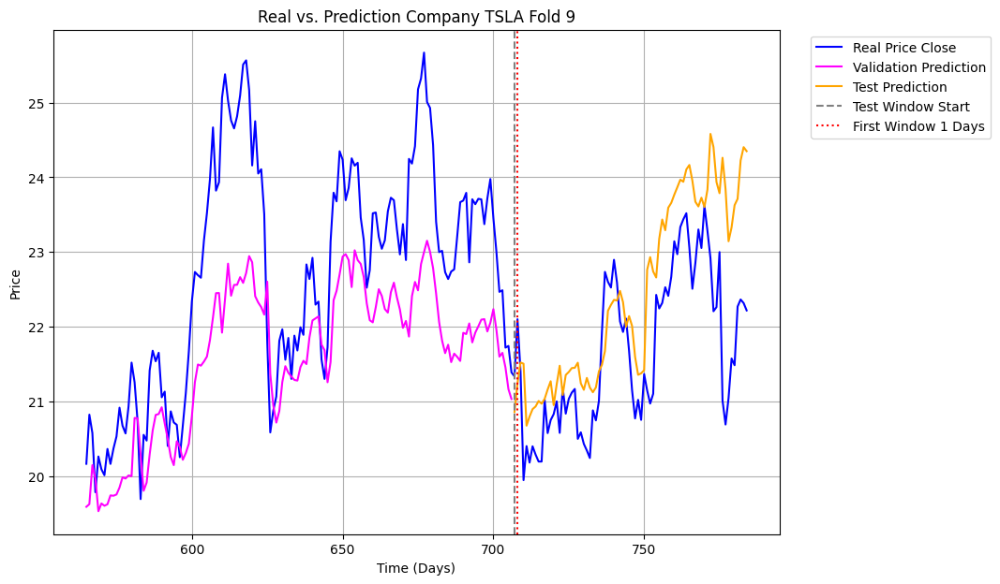

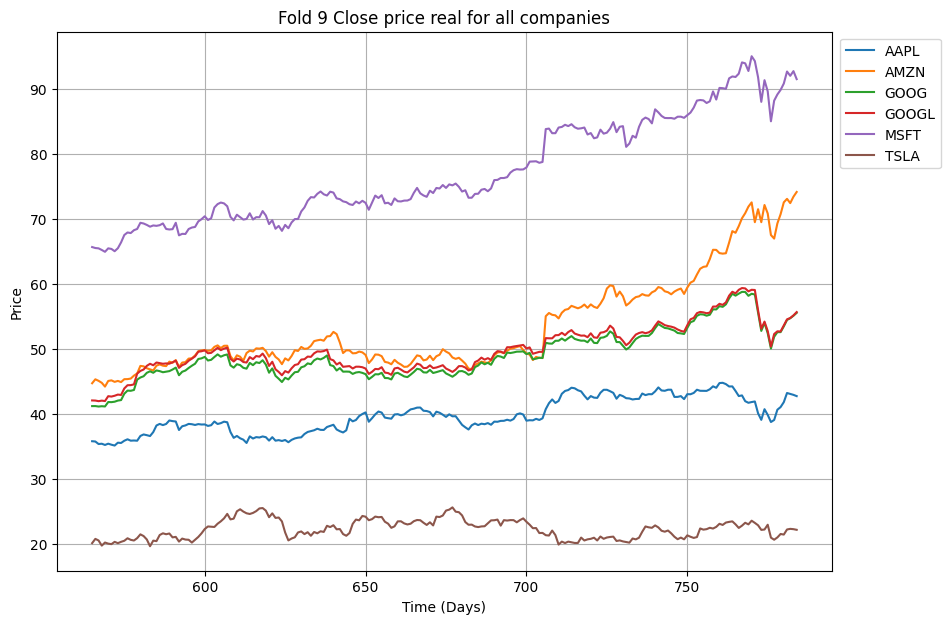

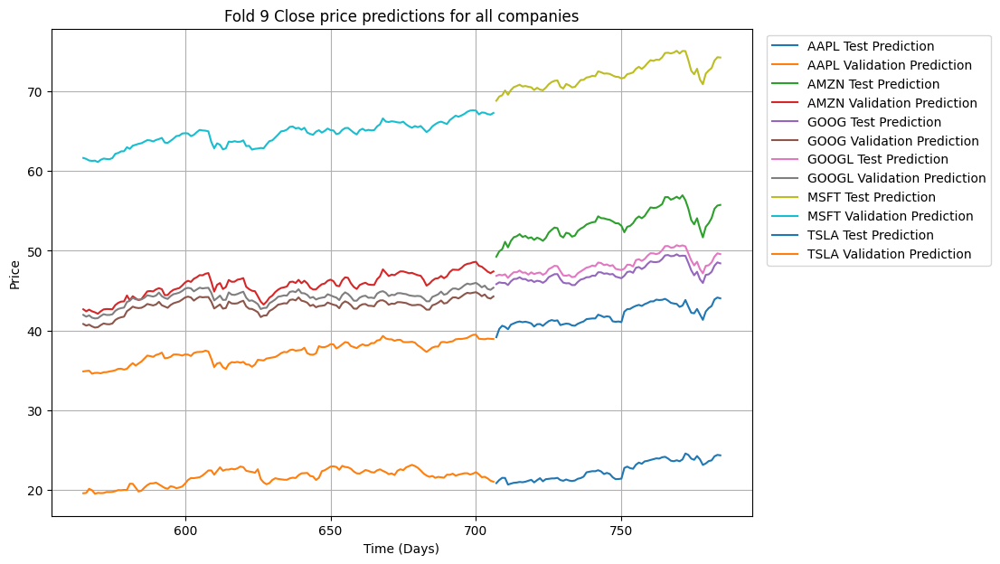

Fold_9 Done
Fold_10 Started


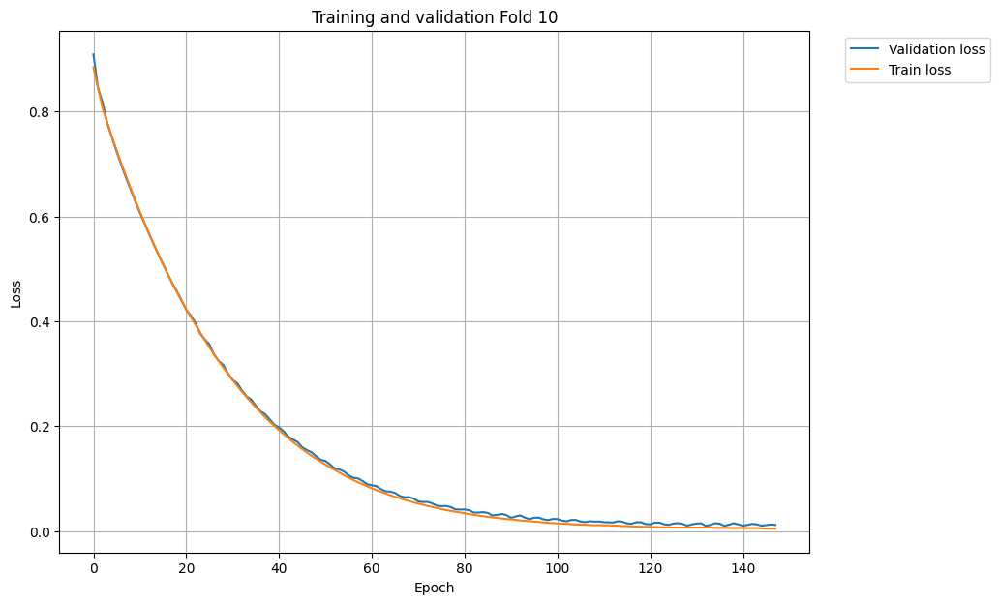

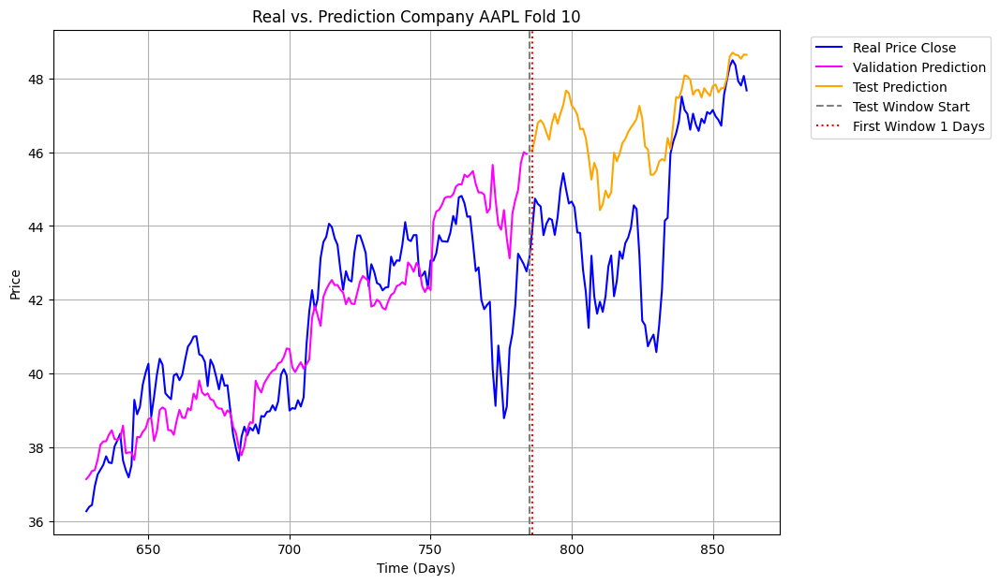

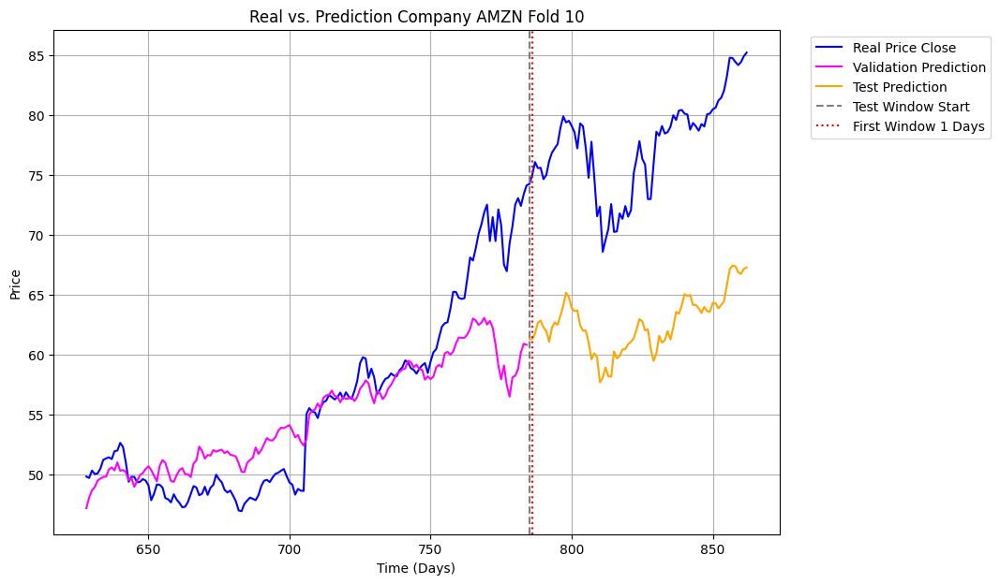

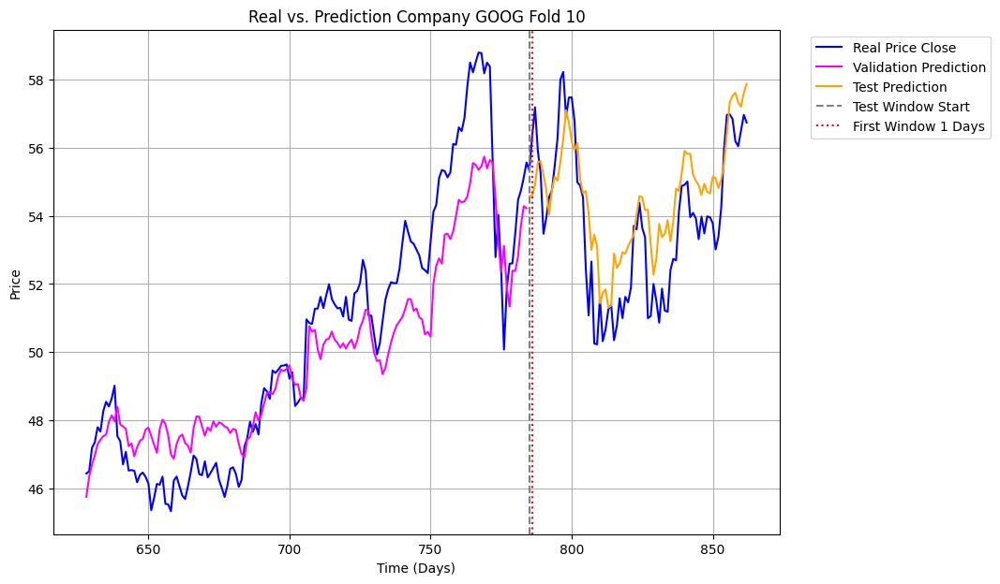

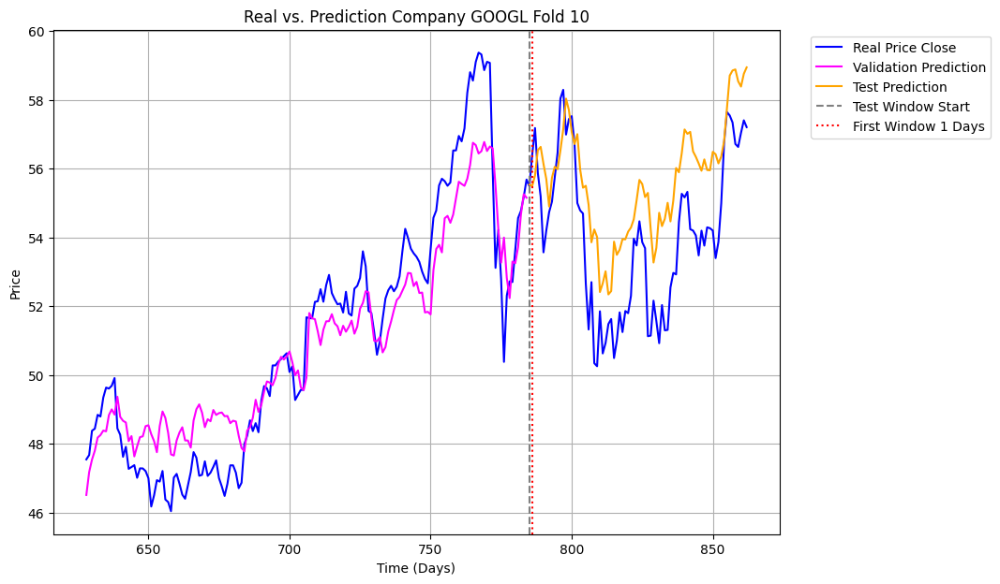

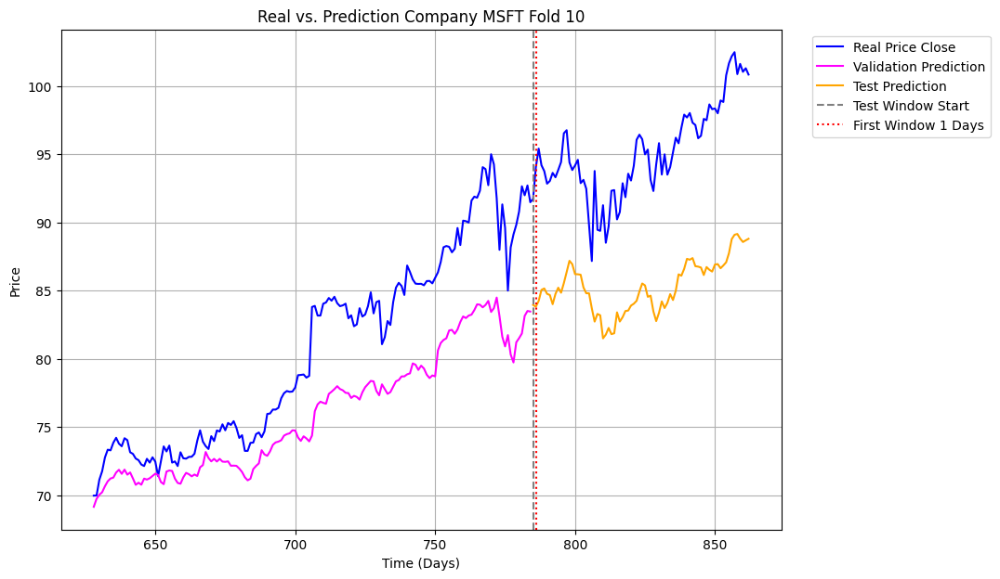

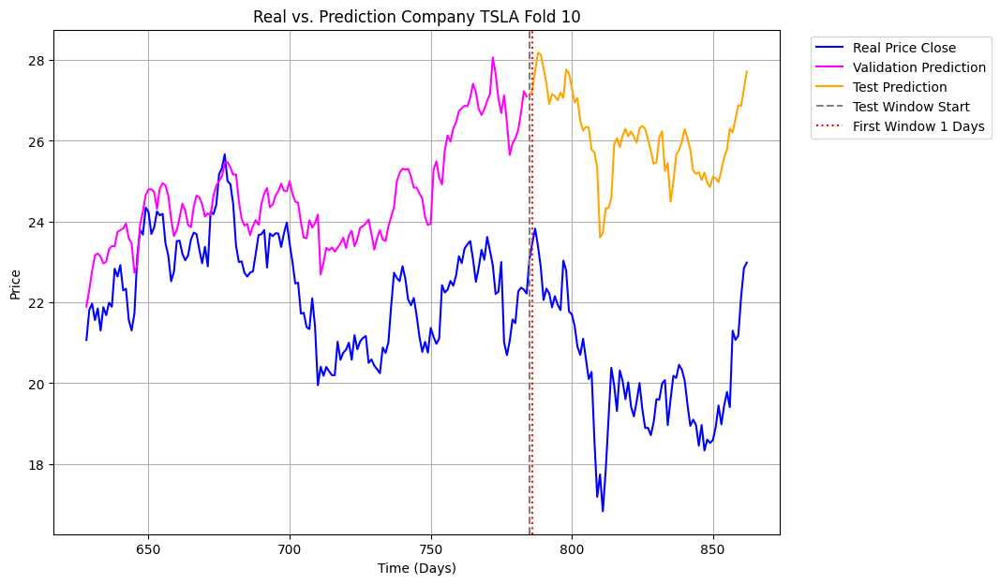

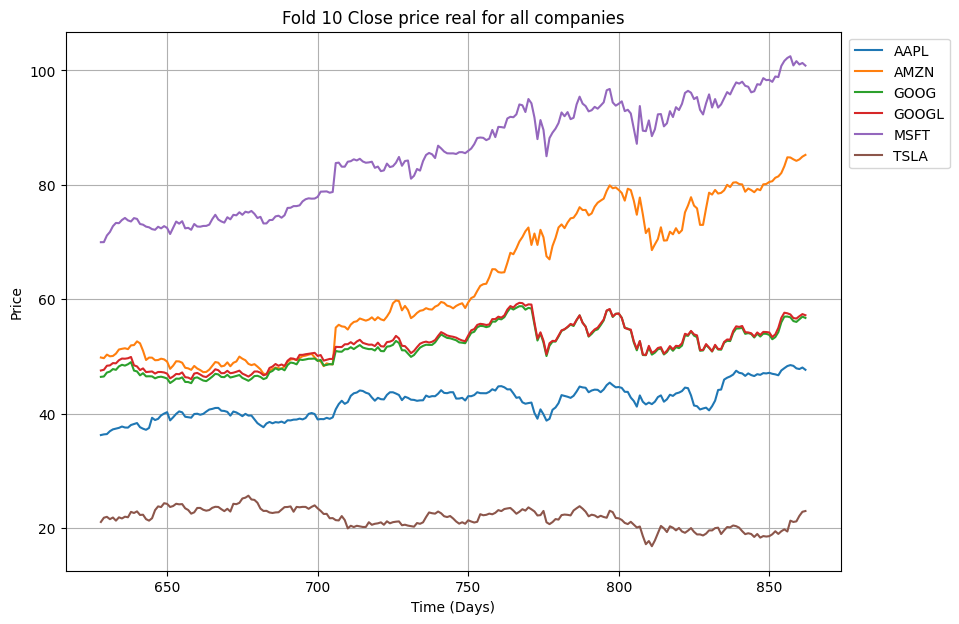

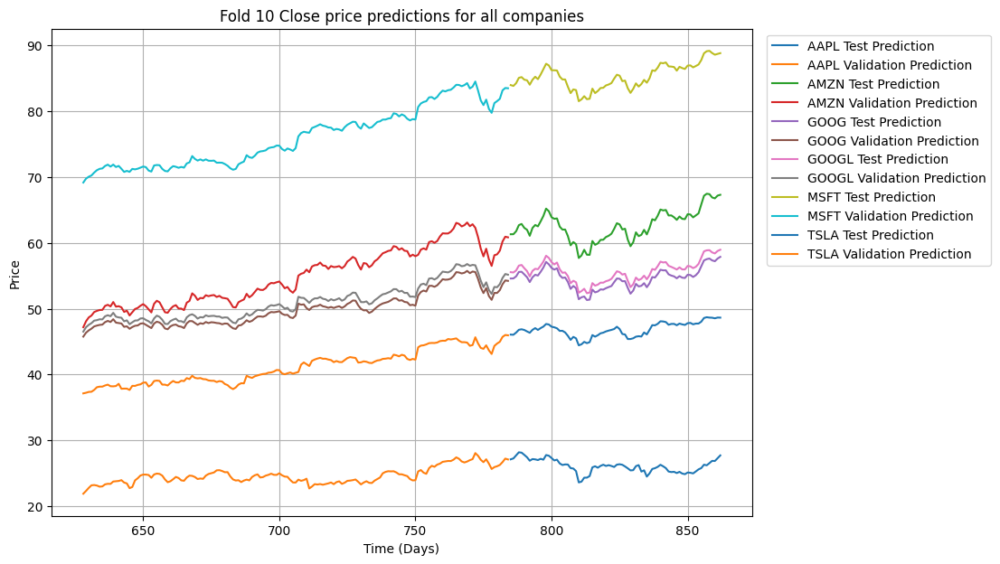

Fold_10 Done
Fold_11 Started


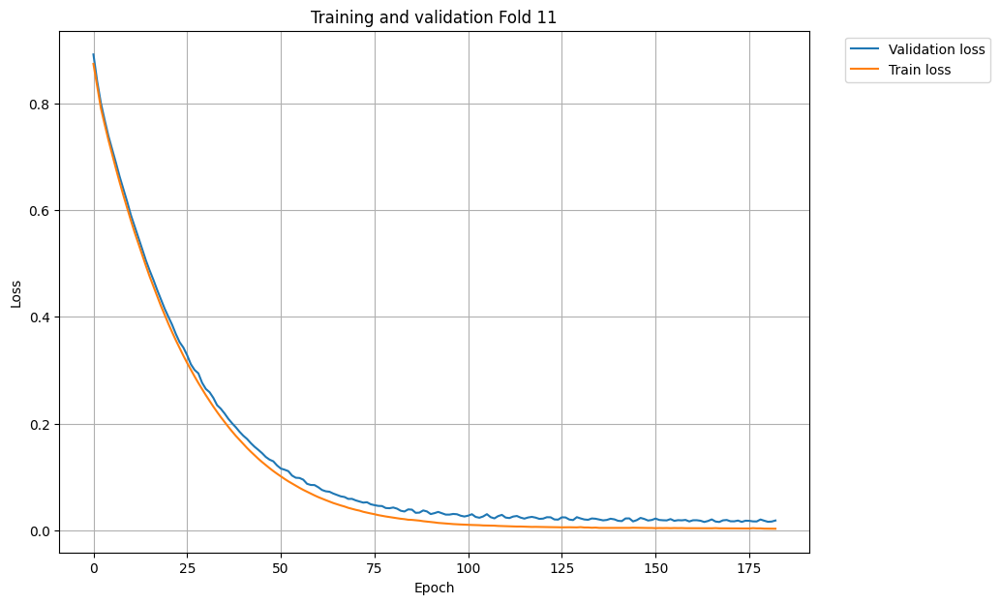

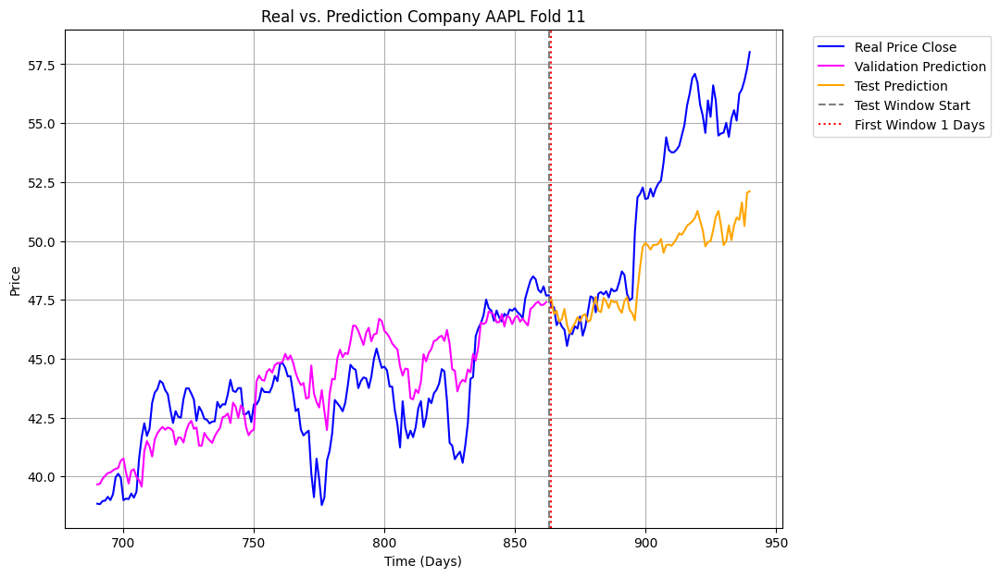

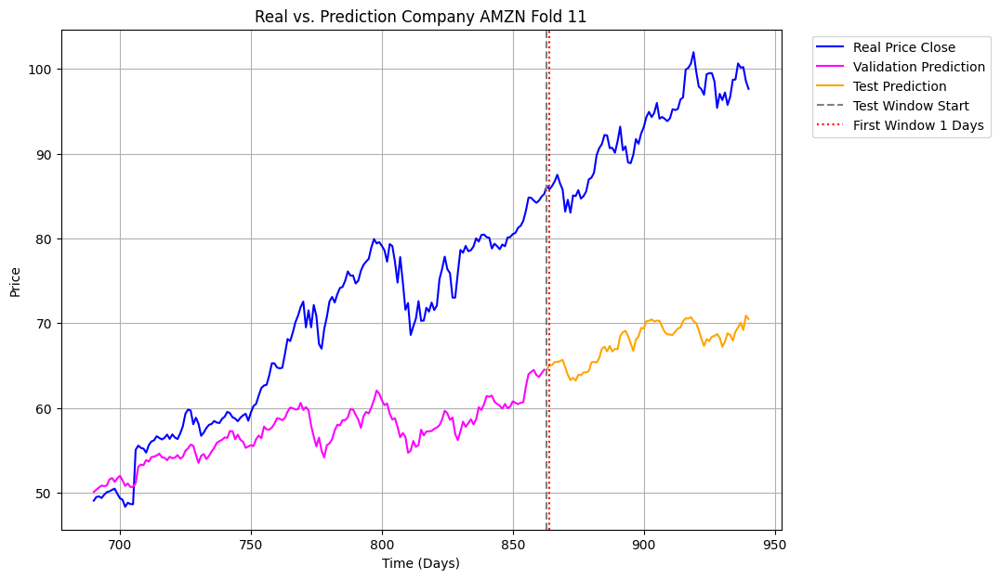

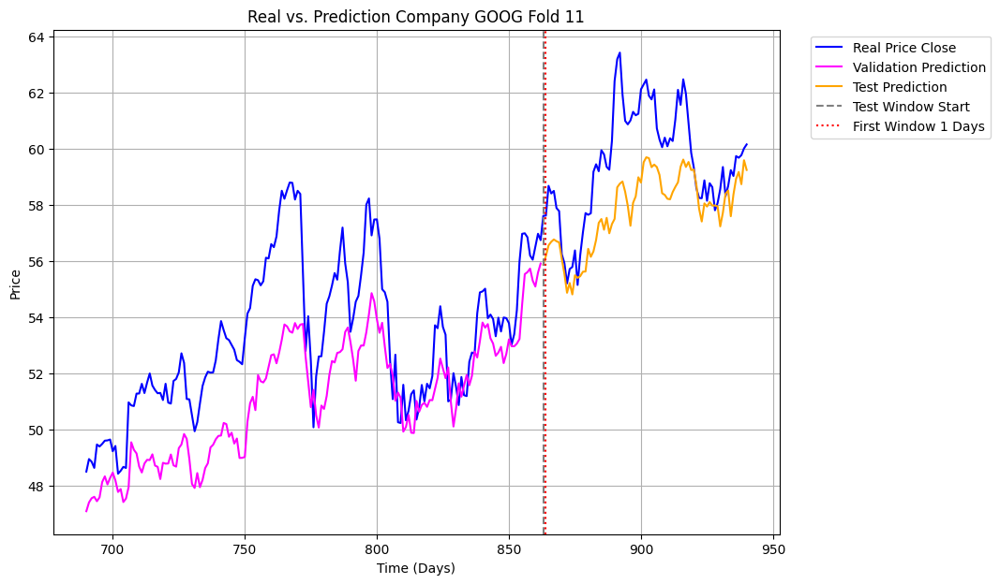

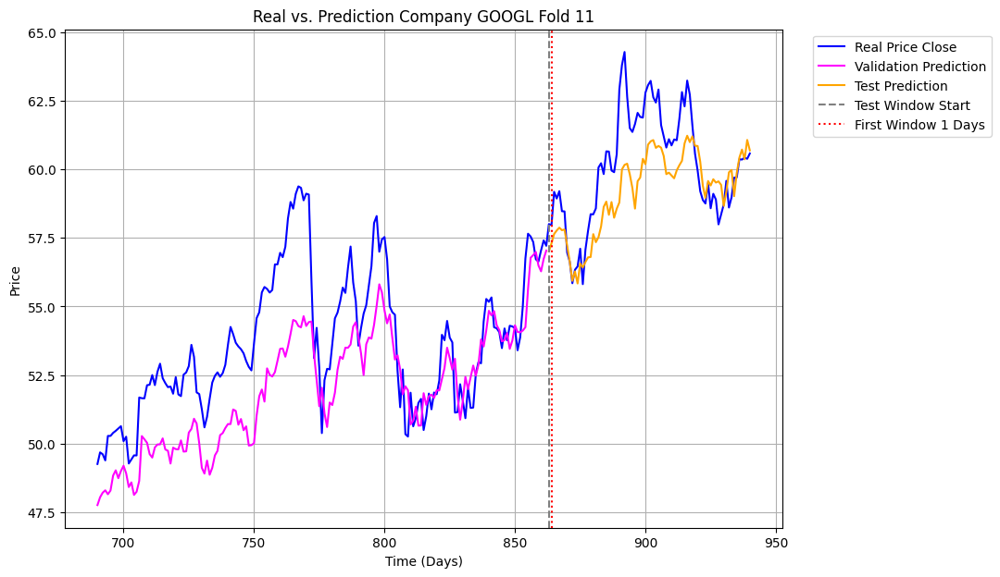

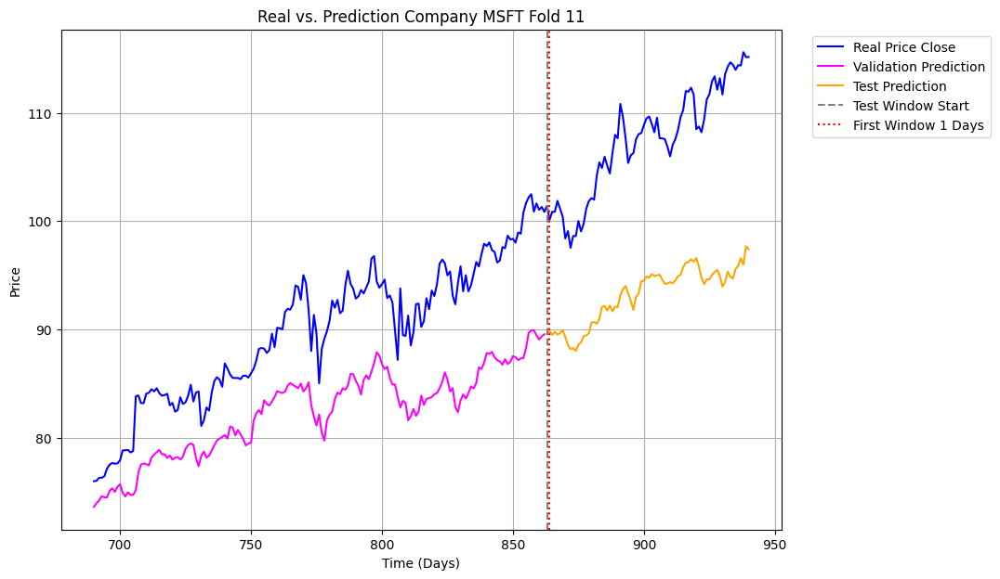

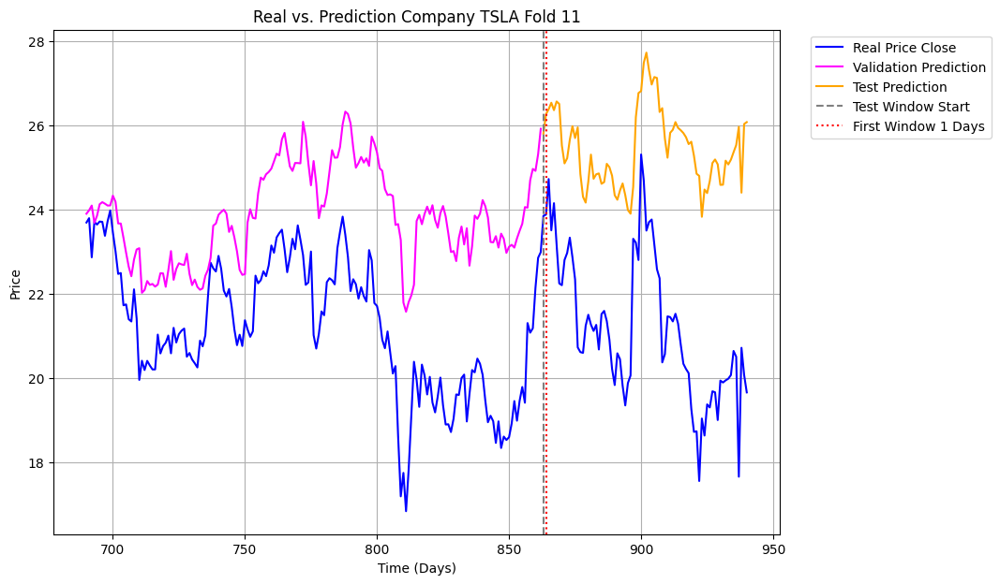

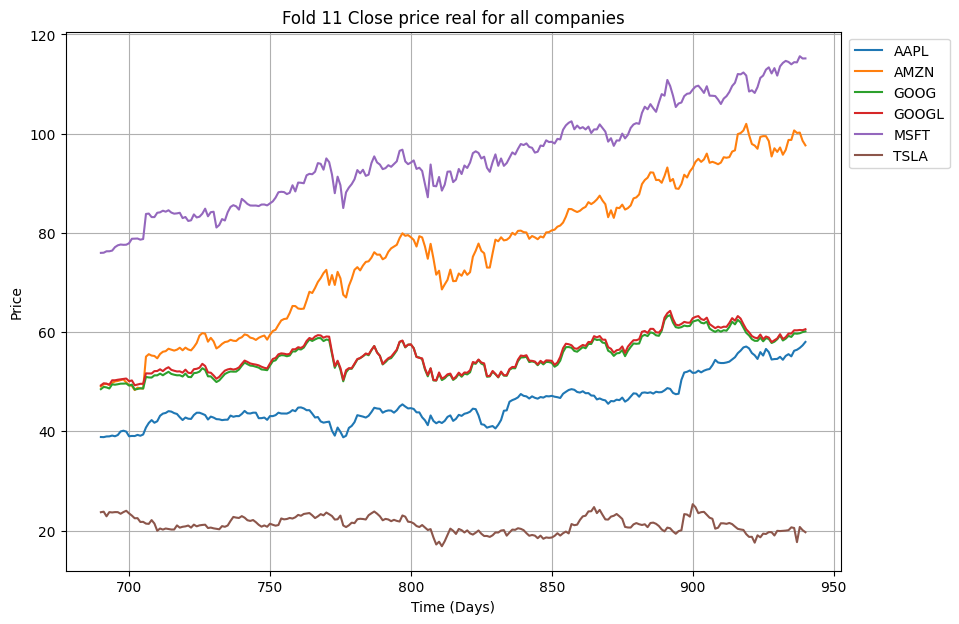

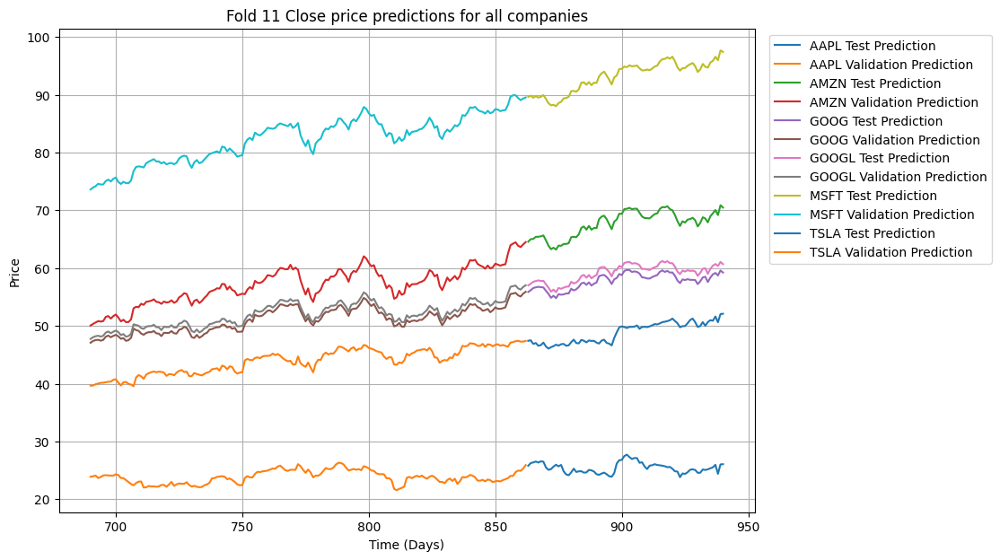

Fold_11 Done
Fold_12 Started


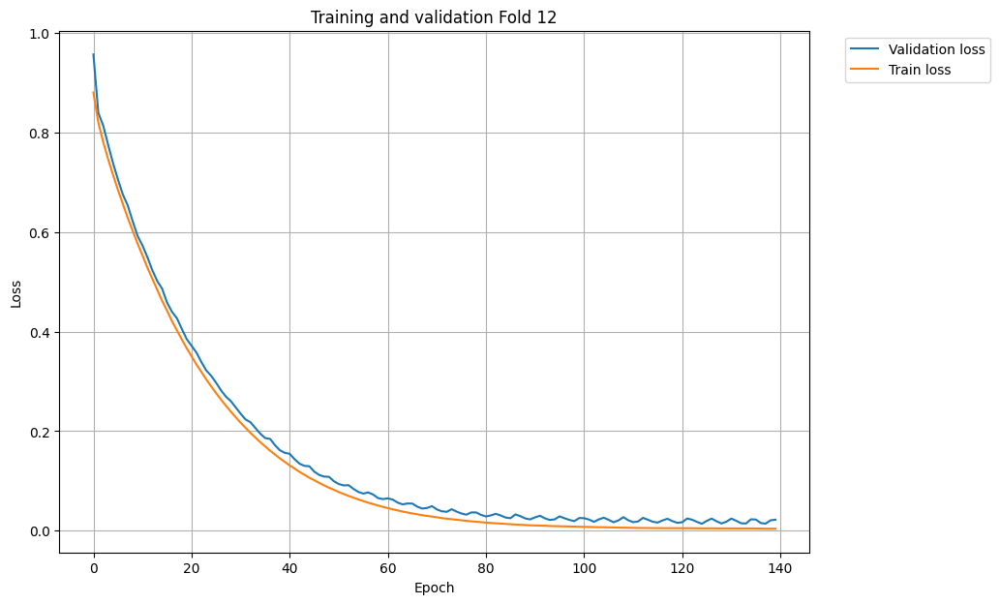

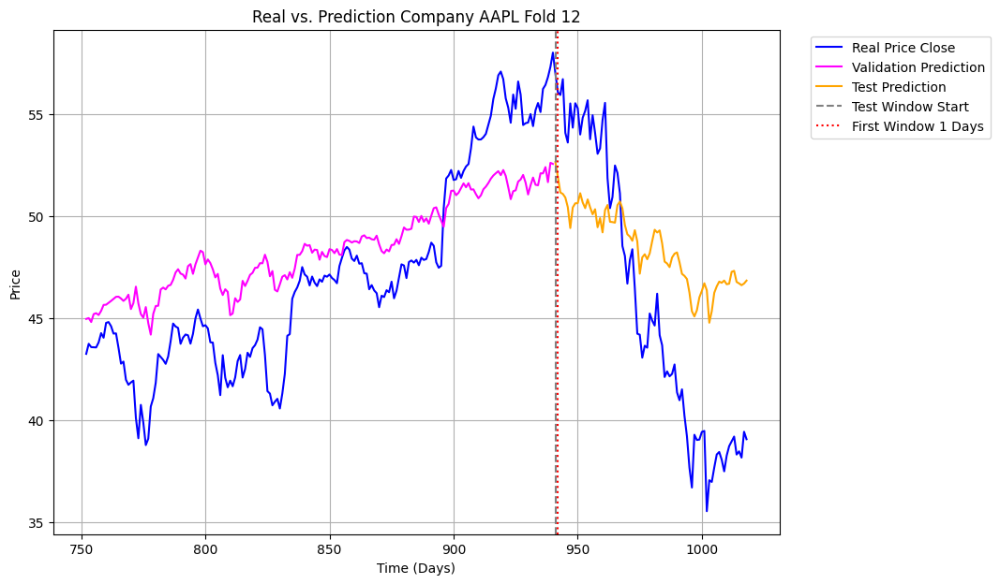

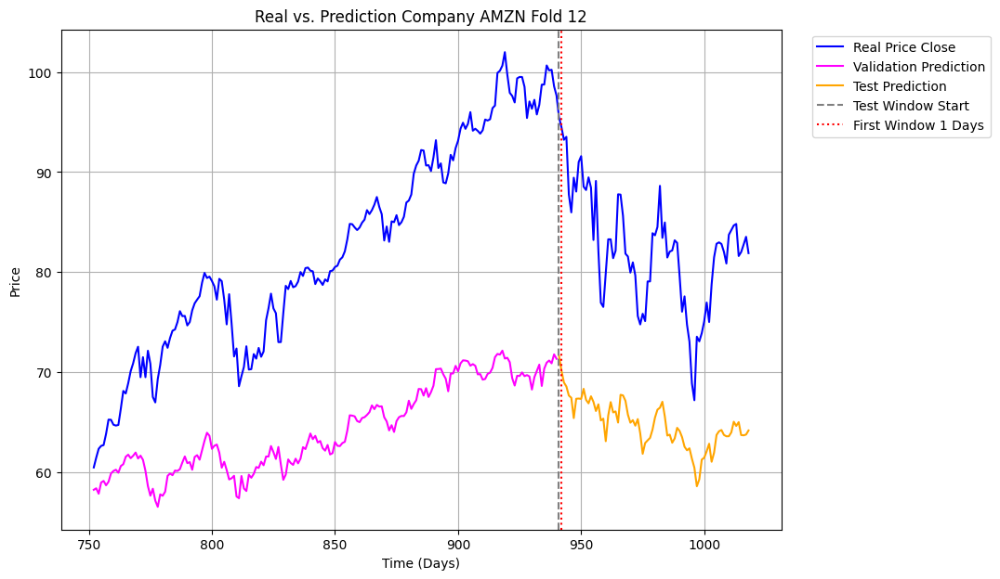

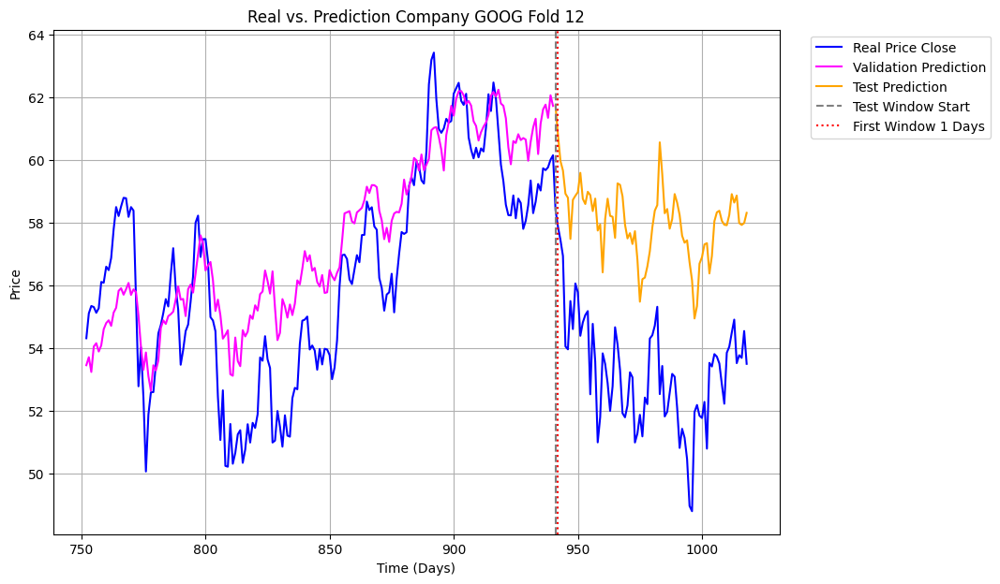

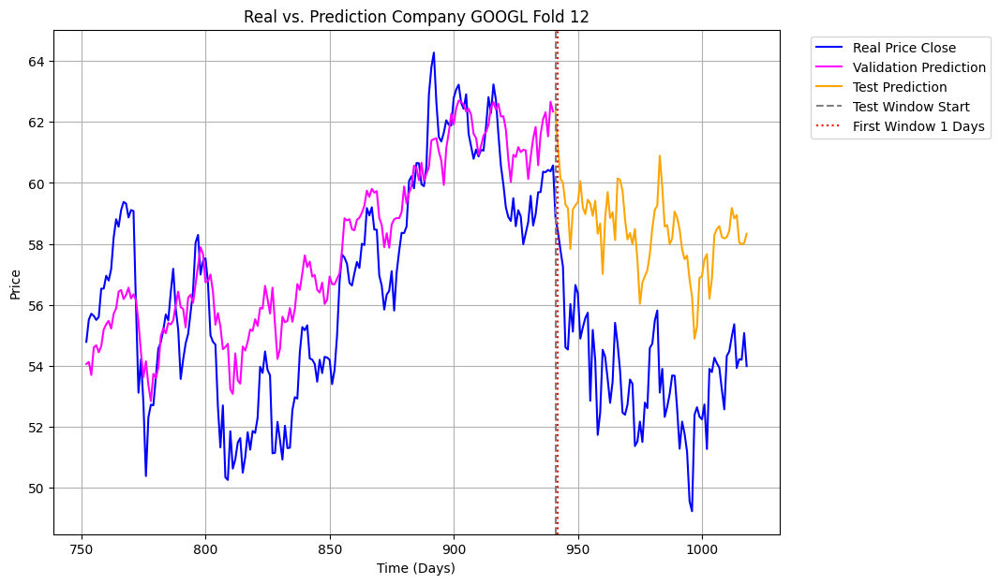

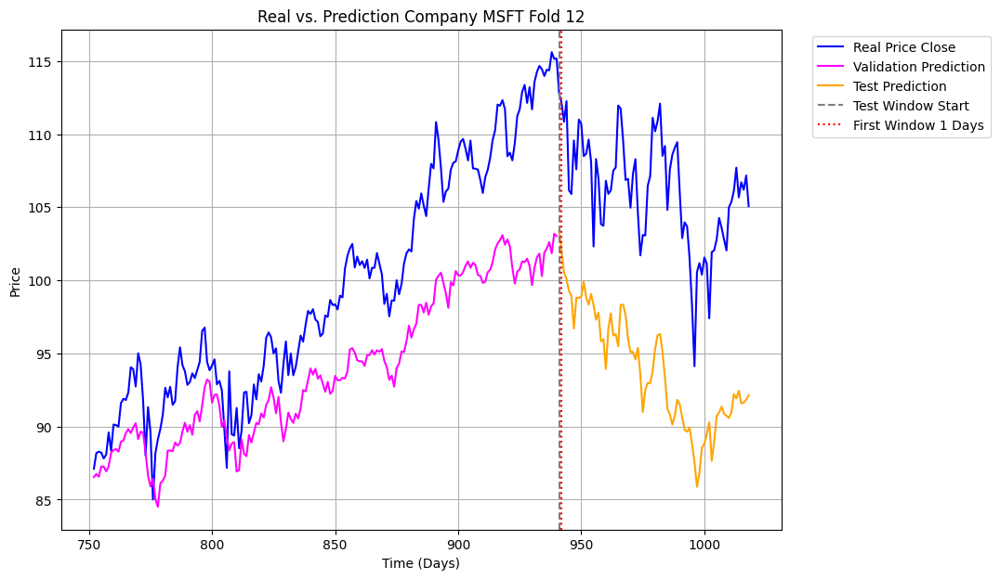

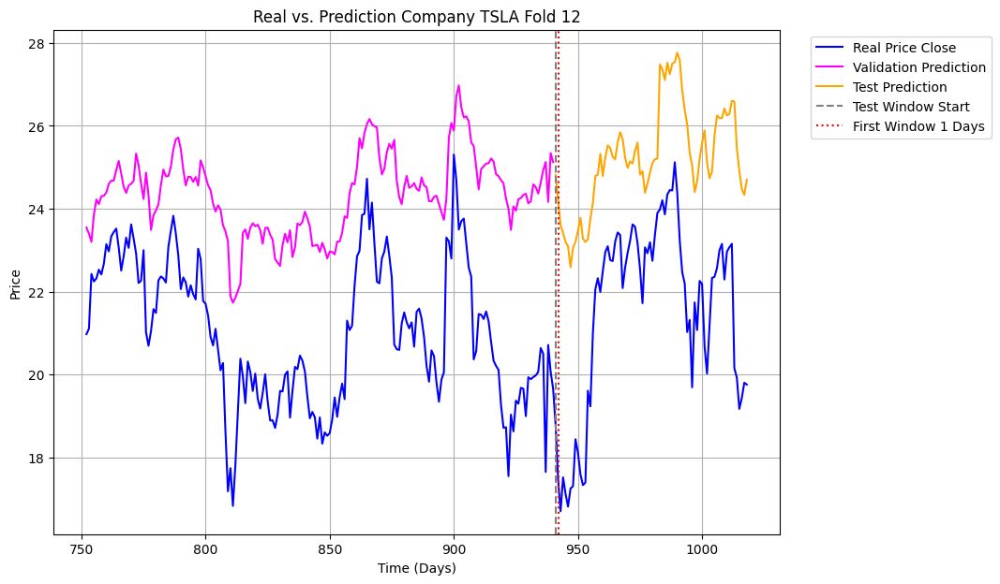

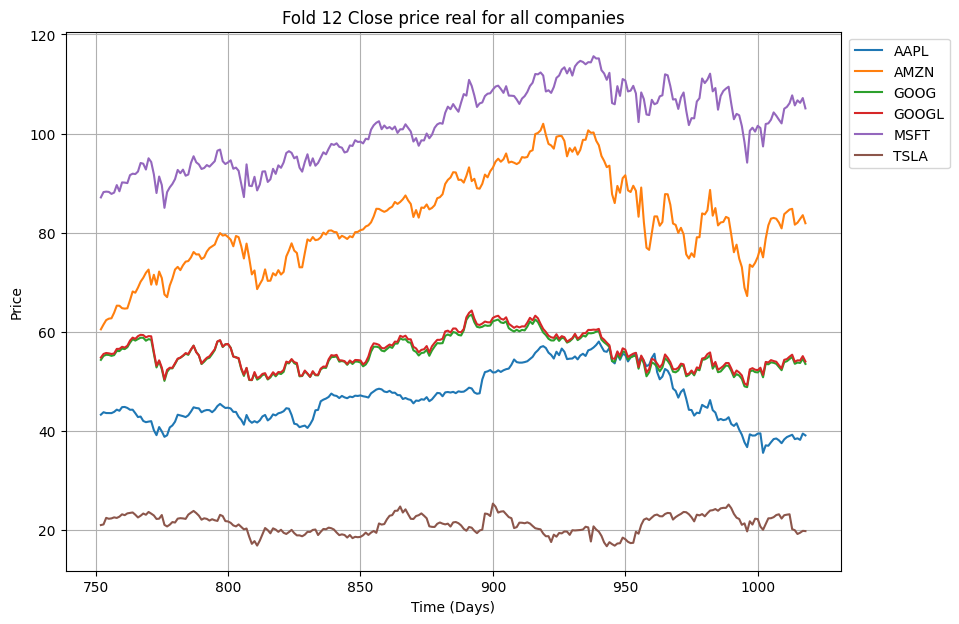

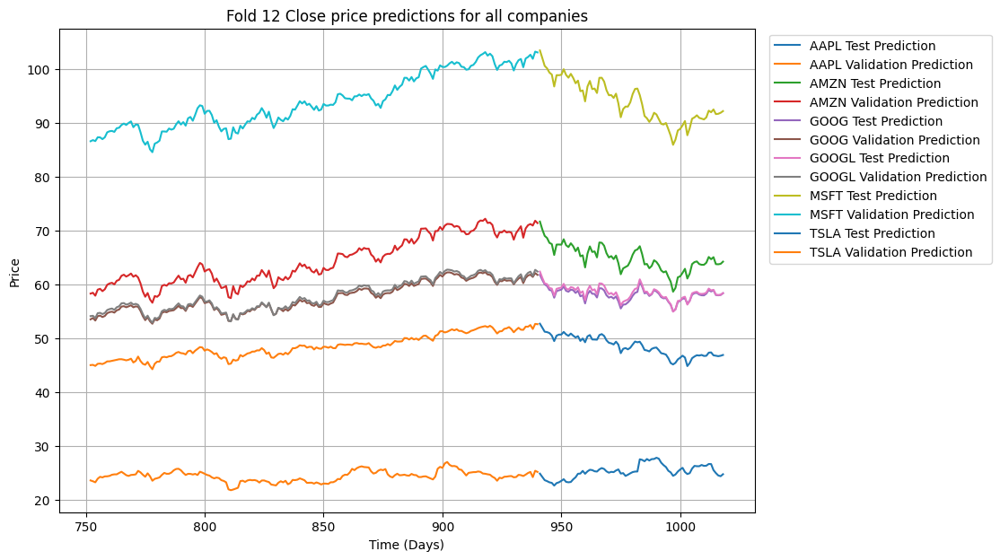

Fold_12 Done
Fold_13 Started


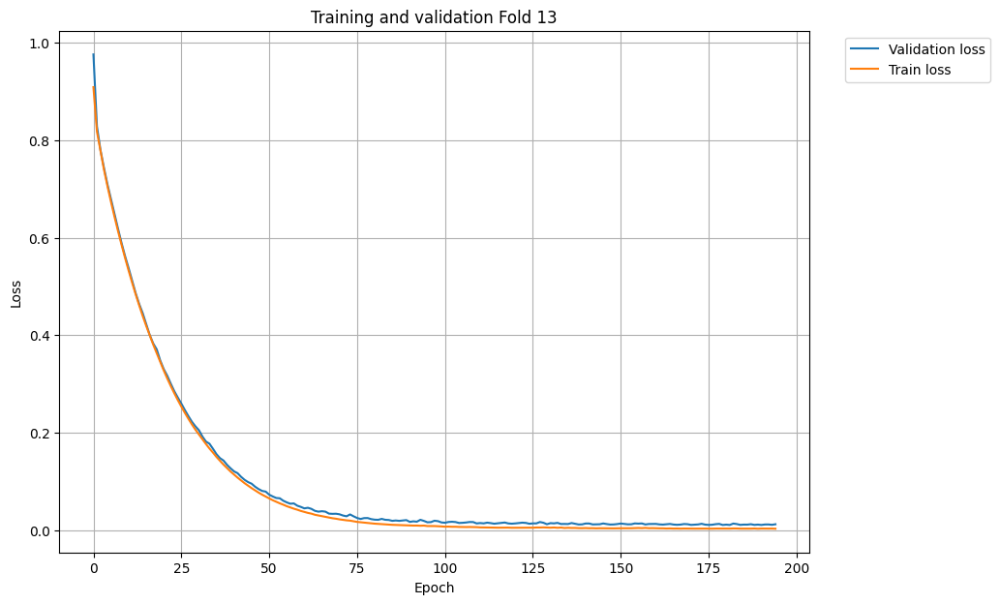

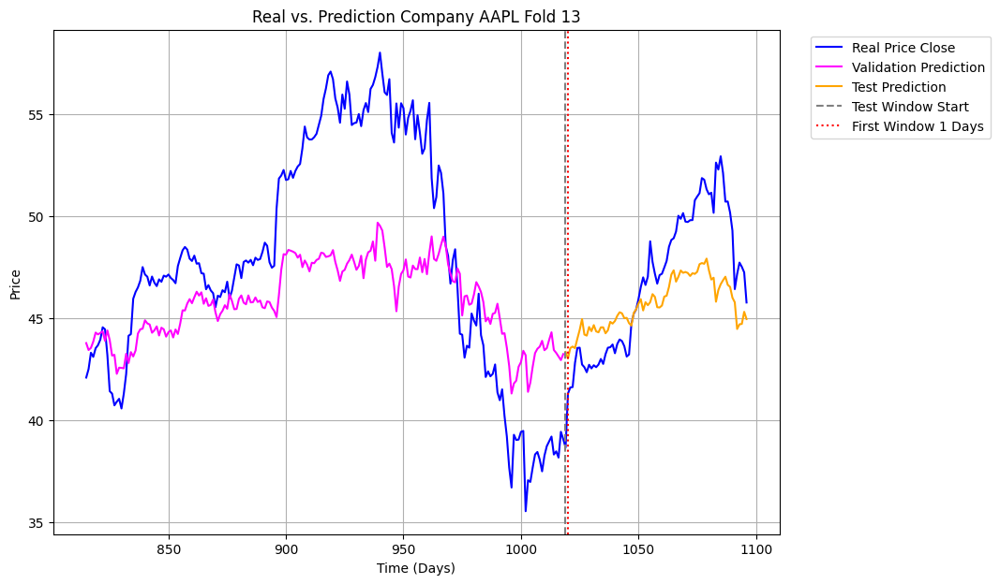

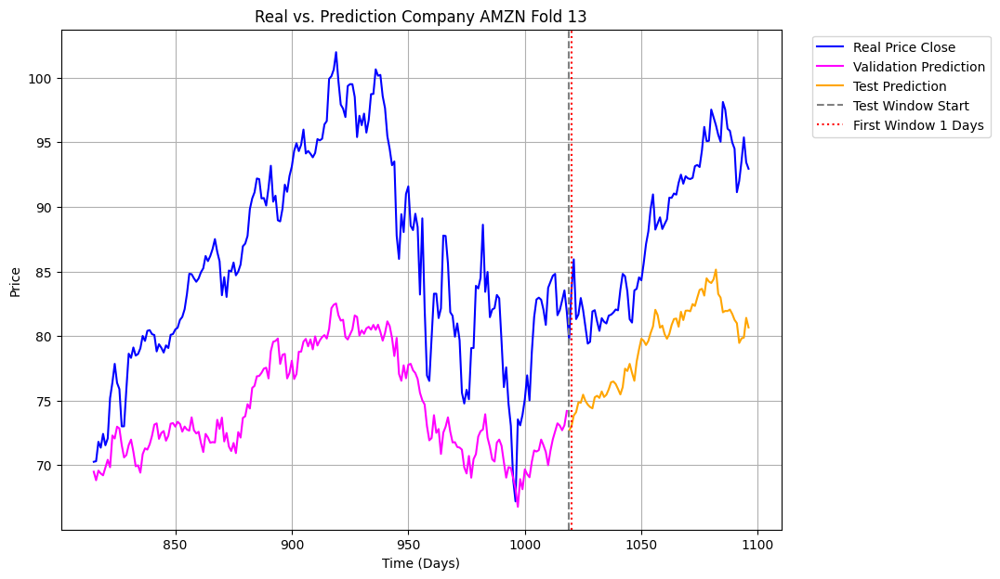

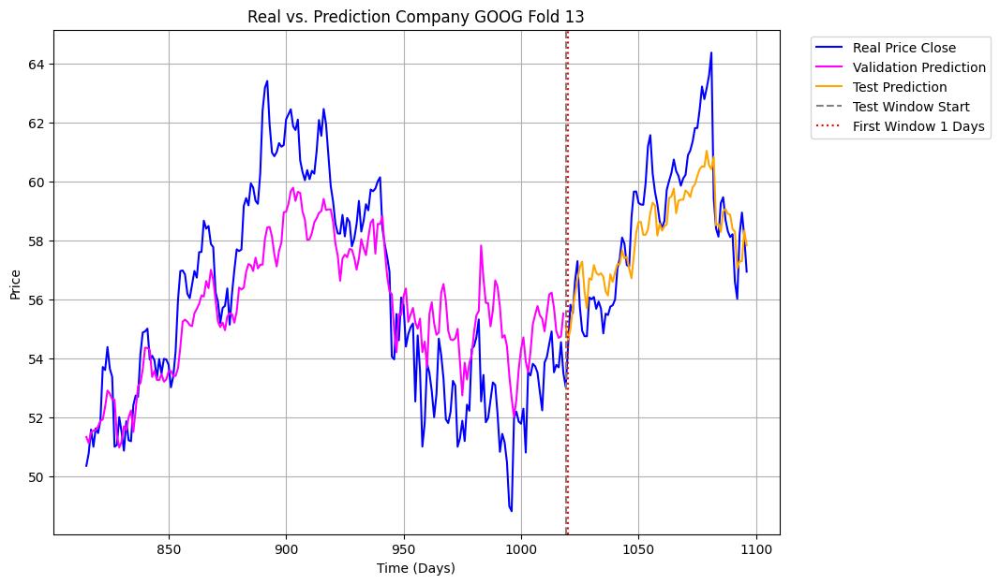

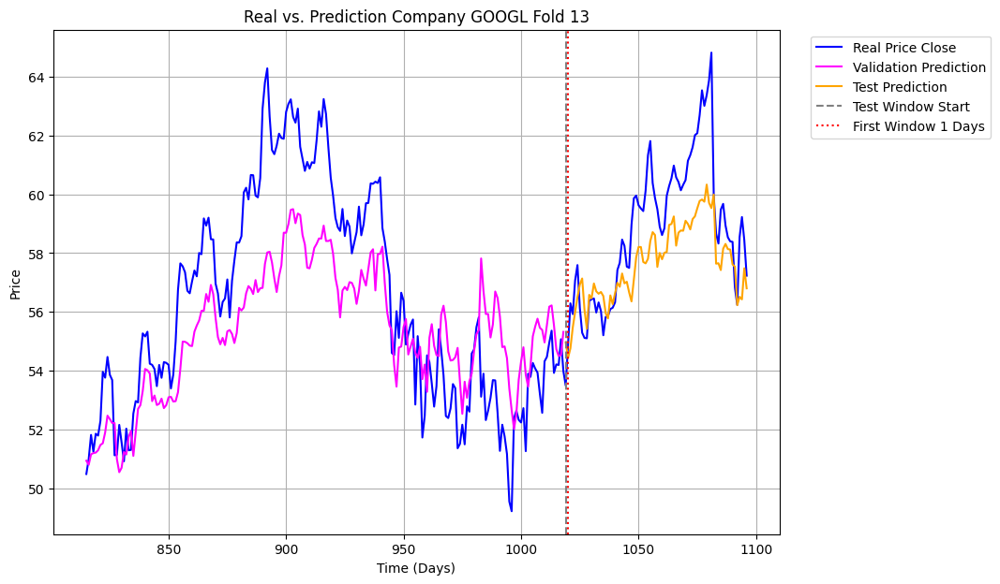

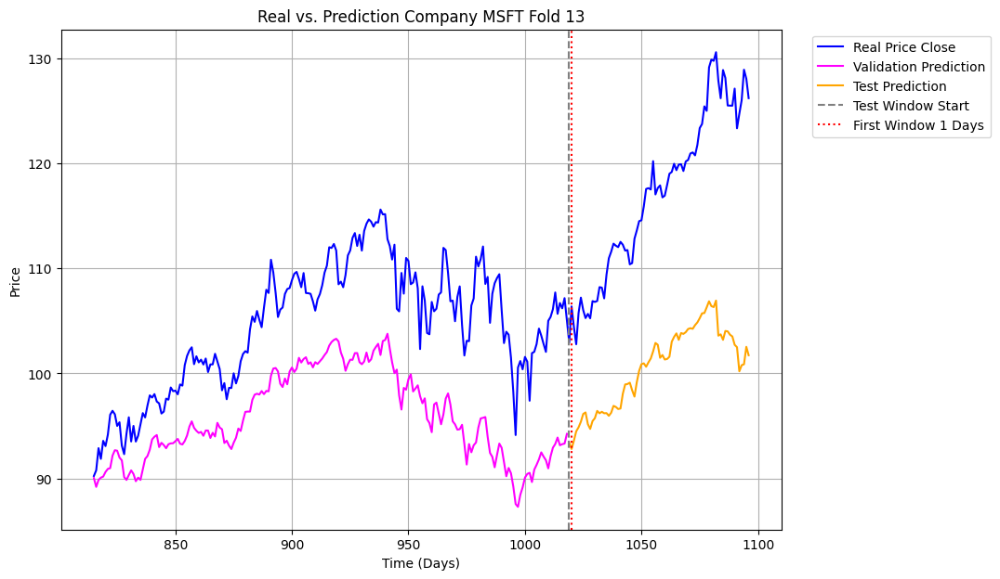

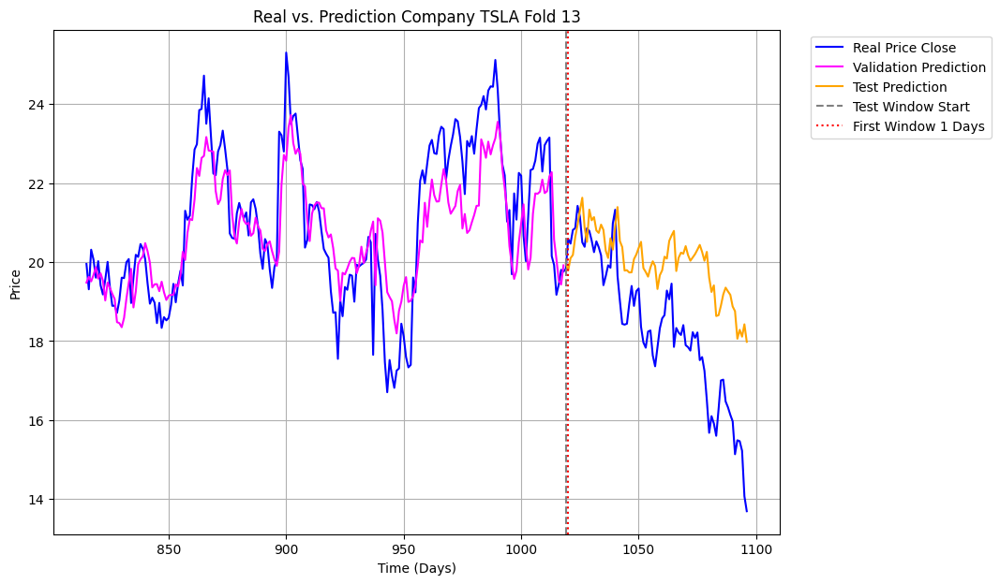

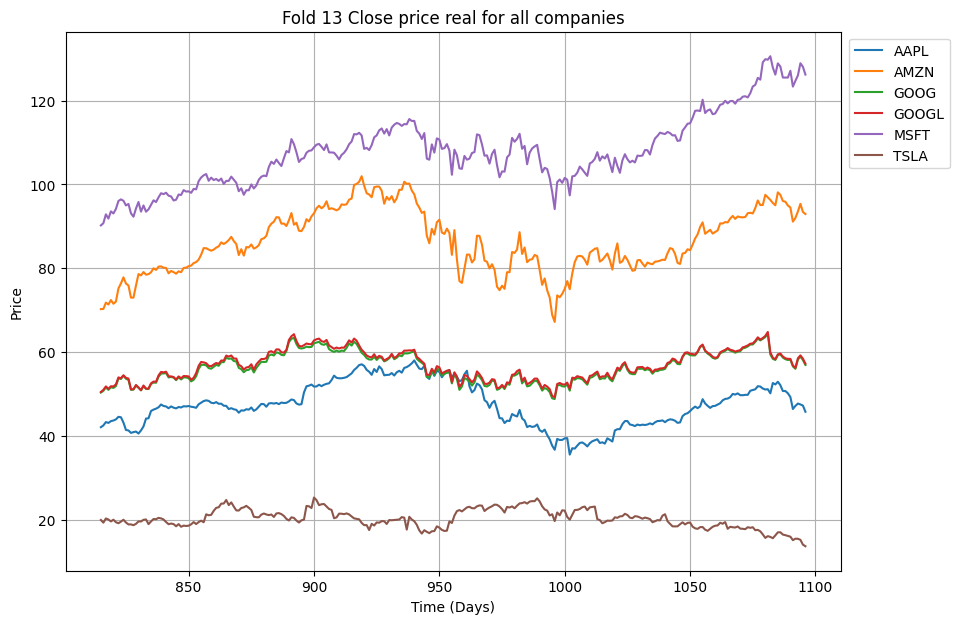

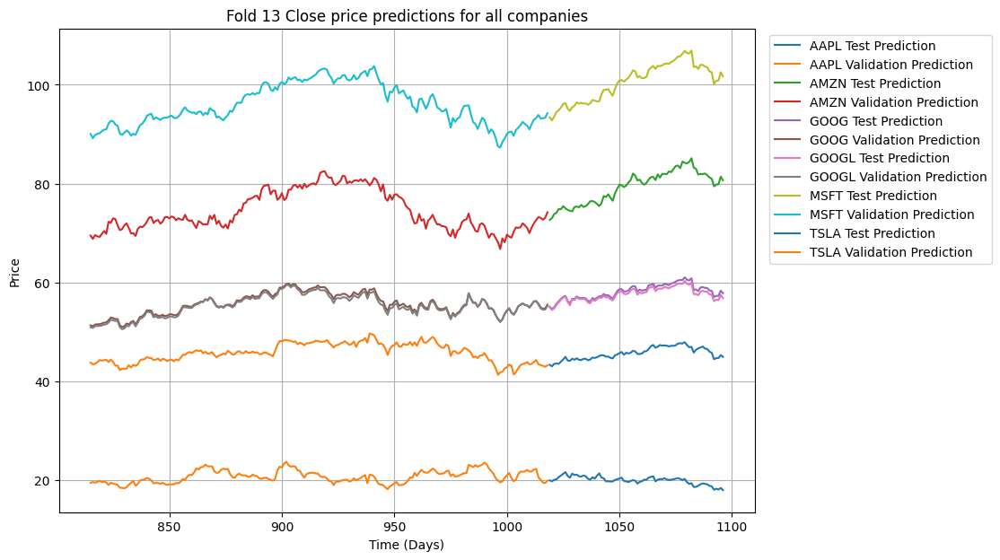

Fold_13 Done
Fold_14 Started


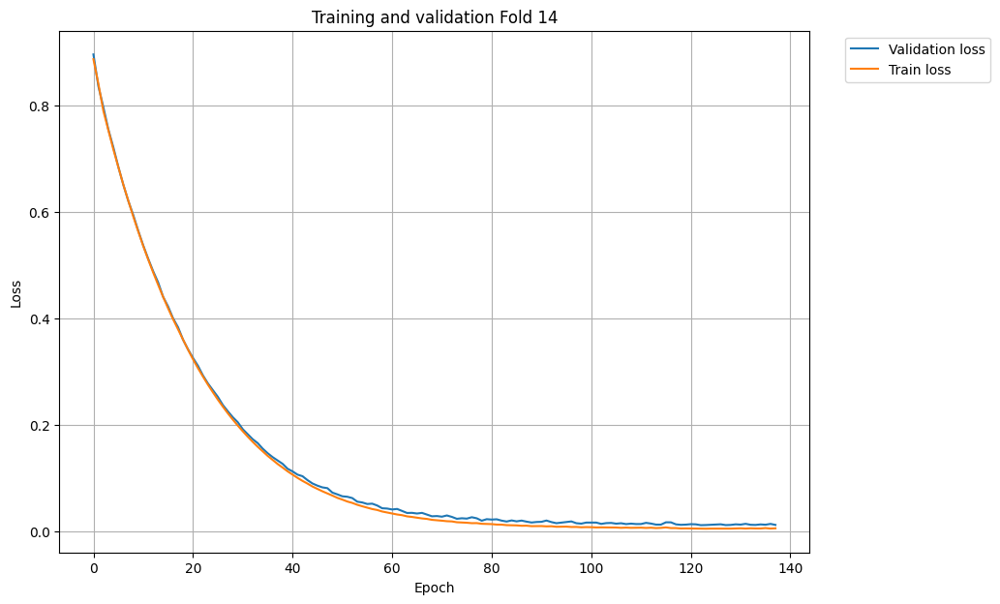

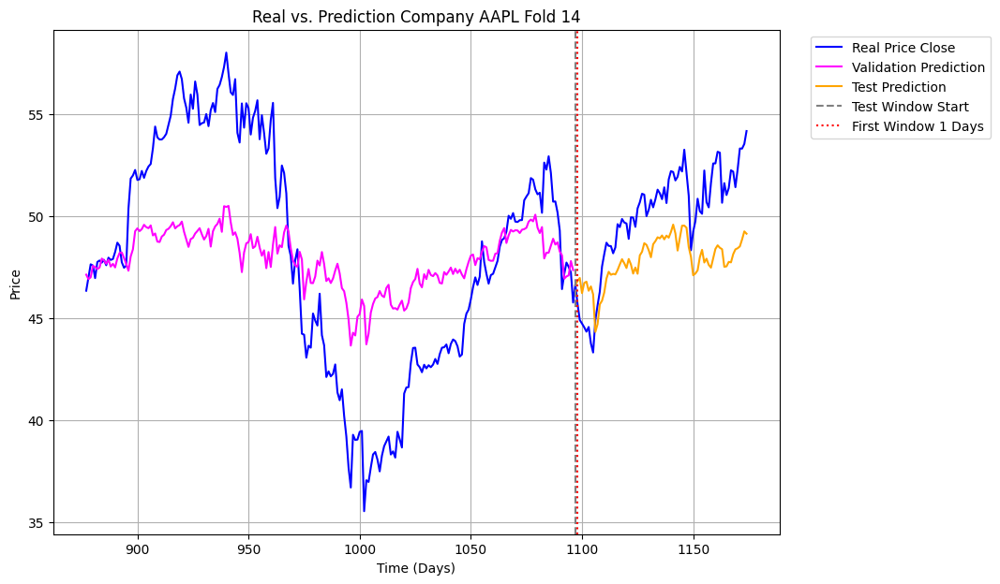

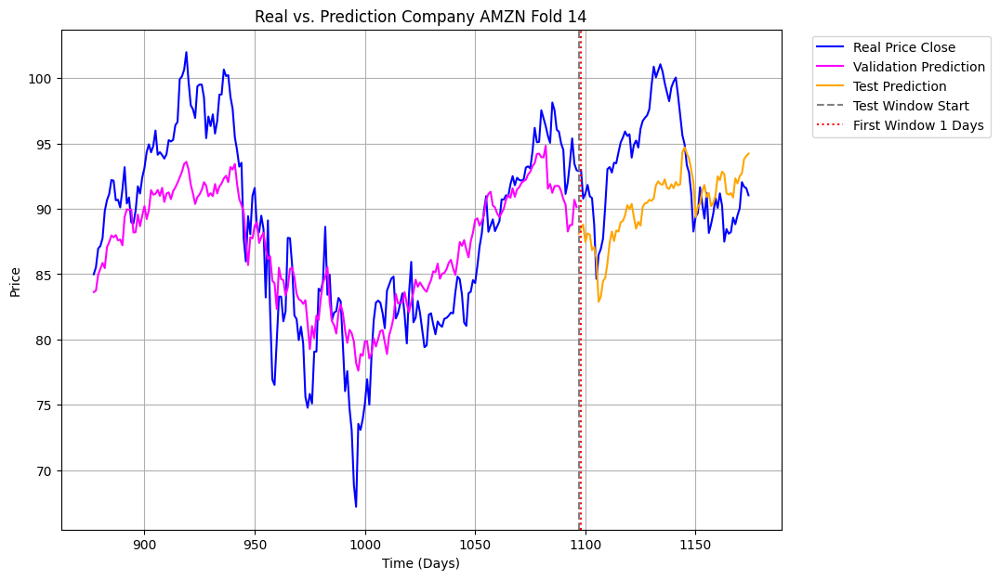

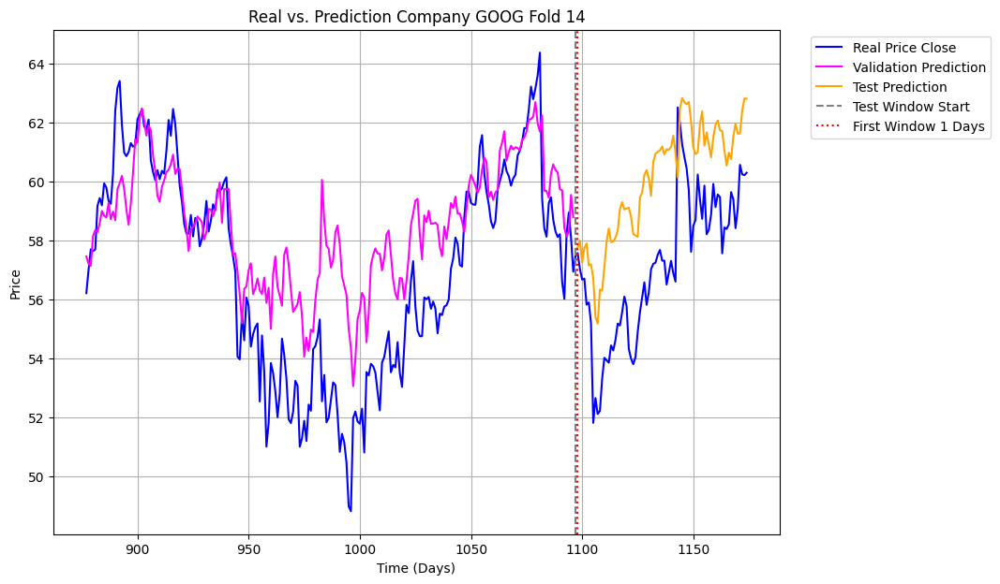

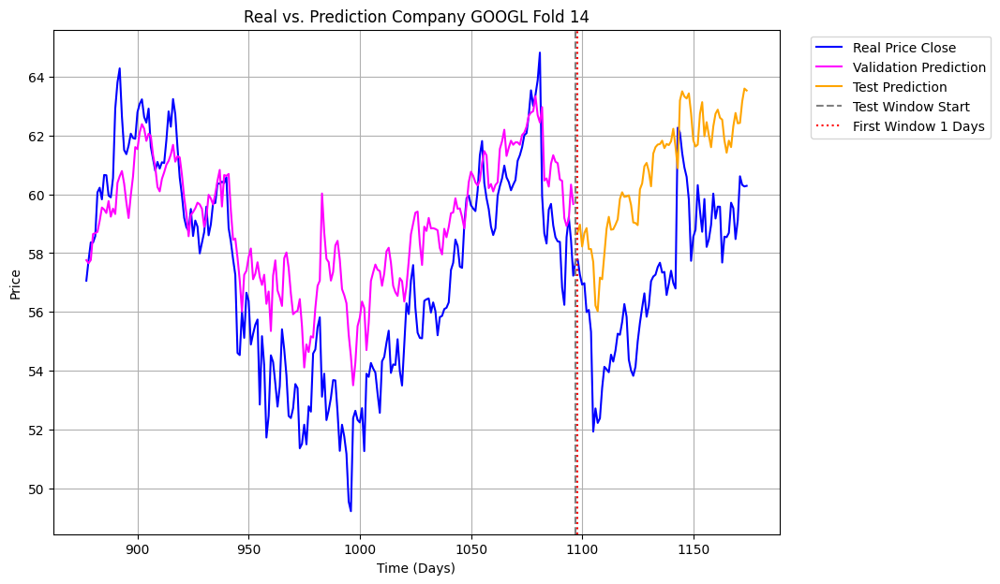

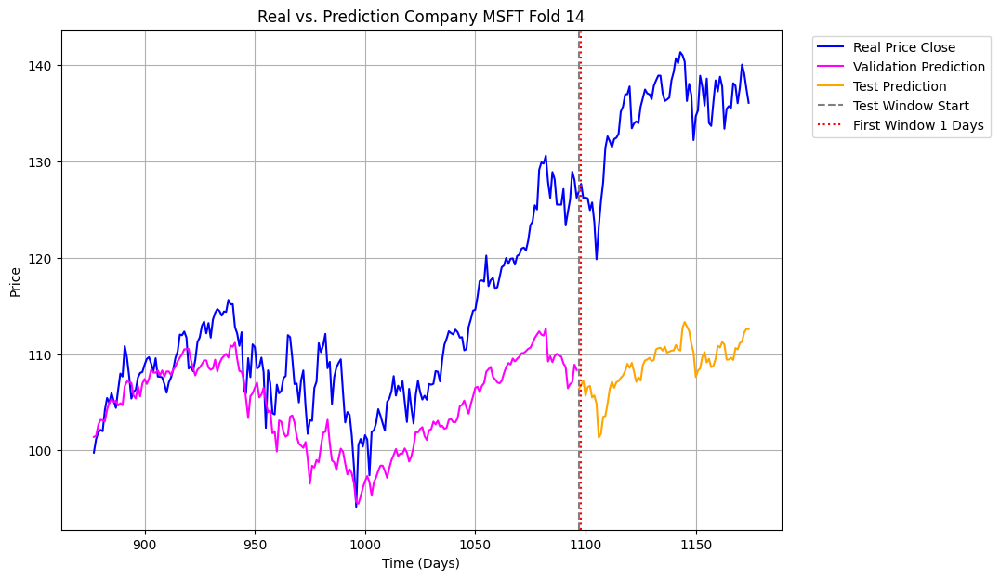

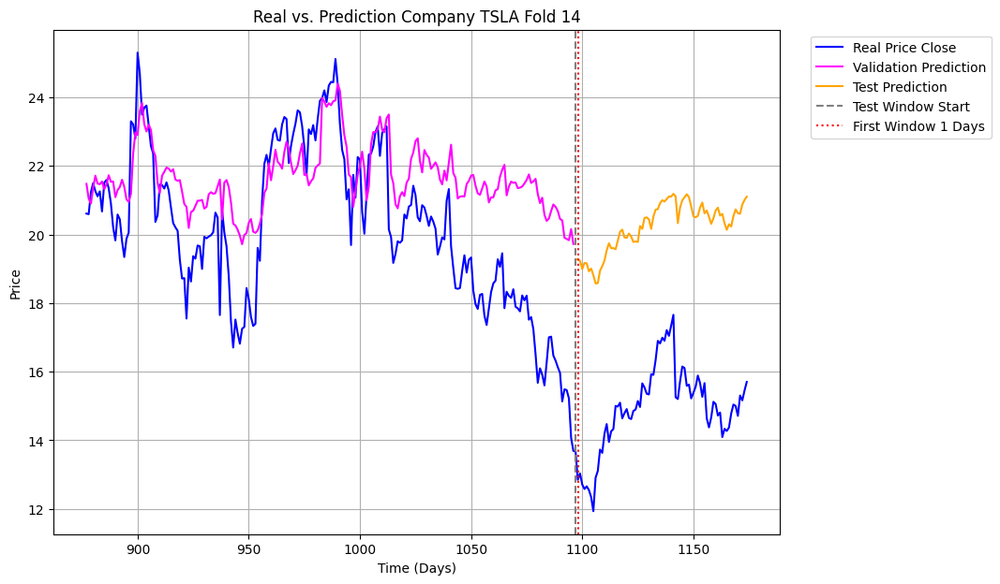

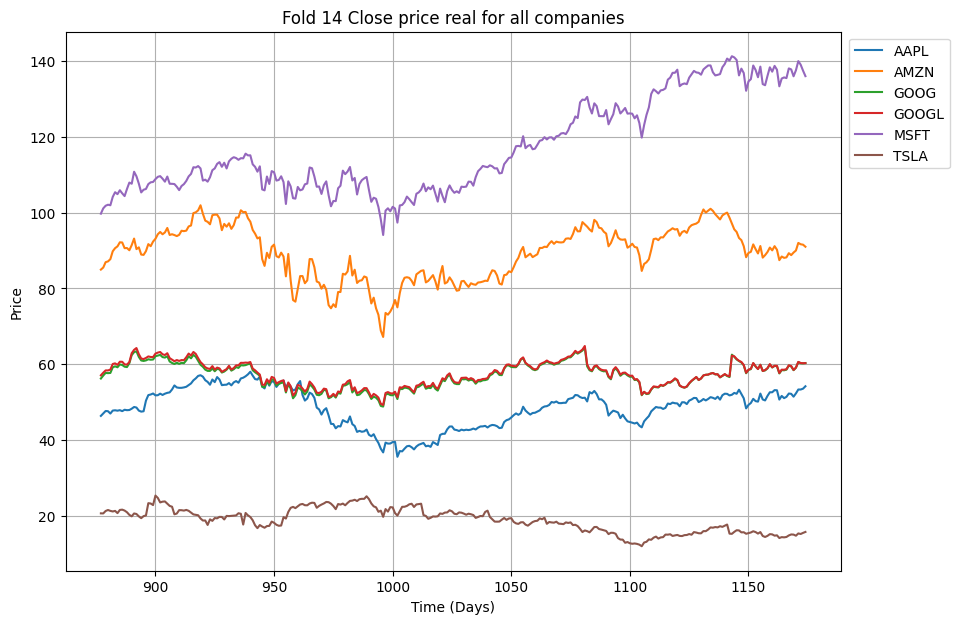

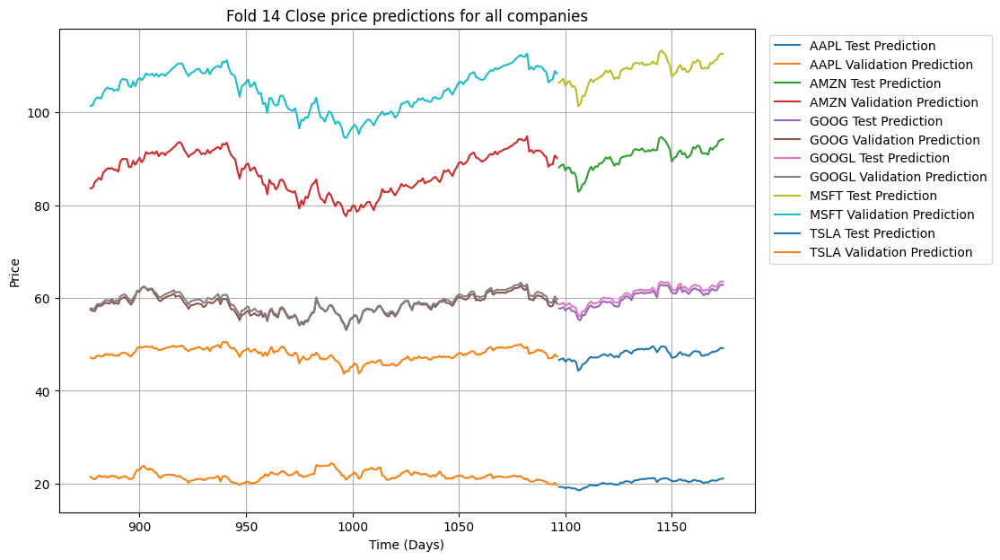

Fold_14 Done
Fold_15 Started


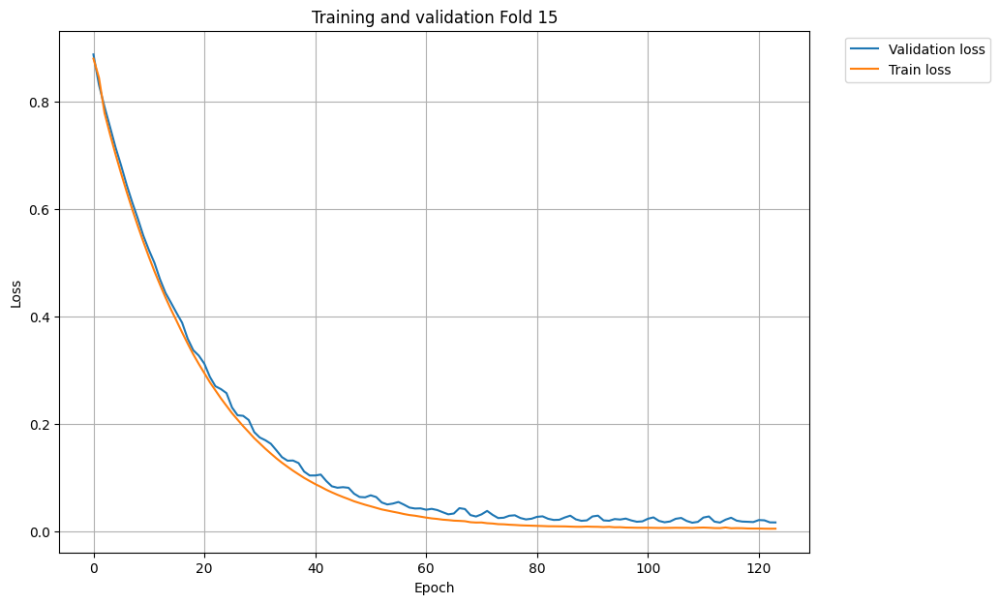

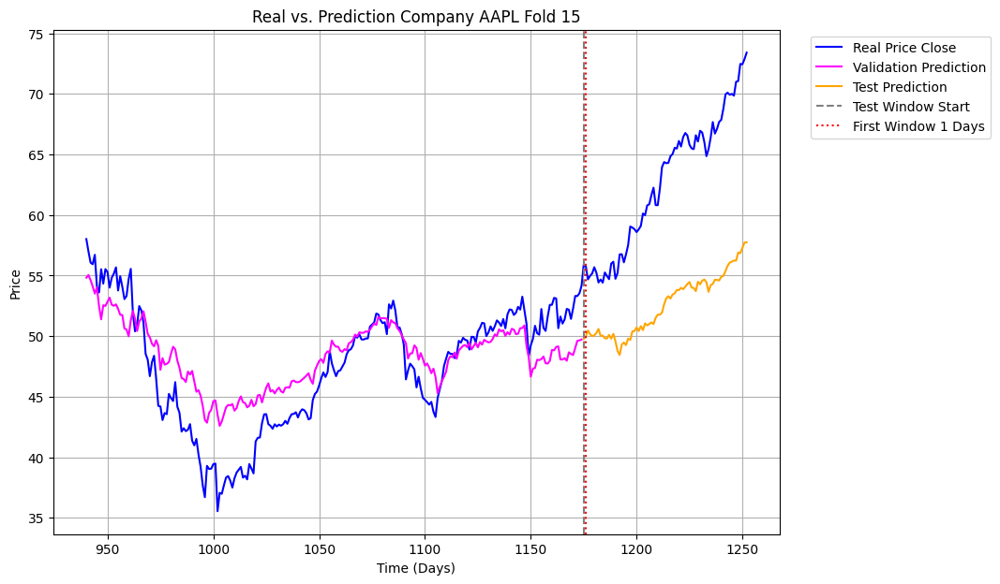

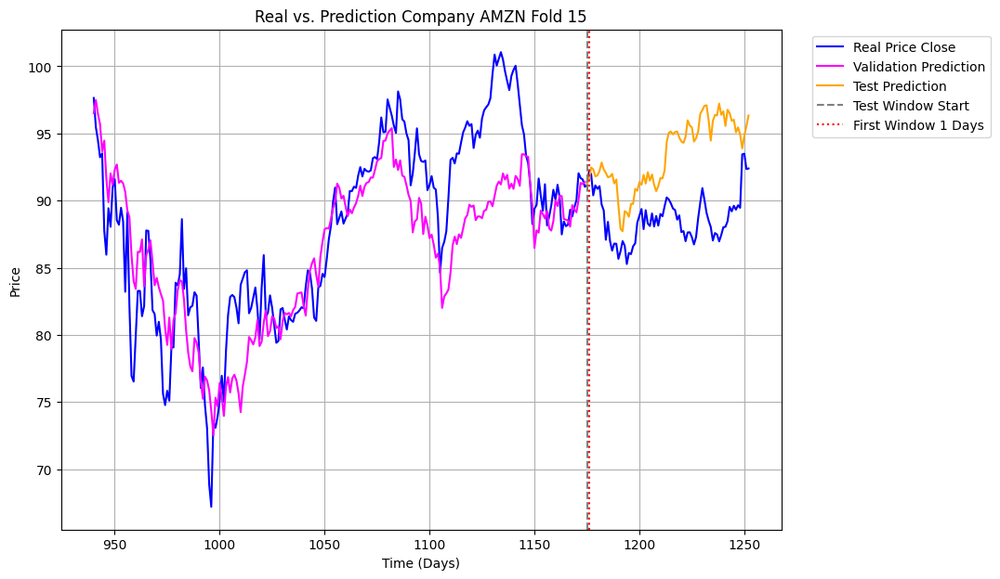

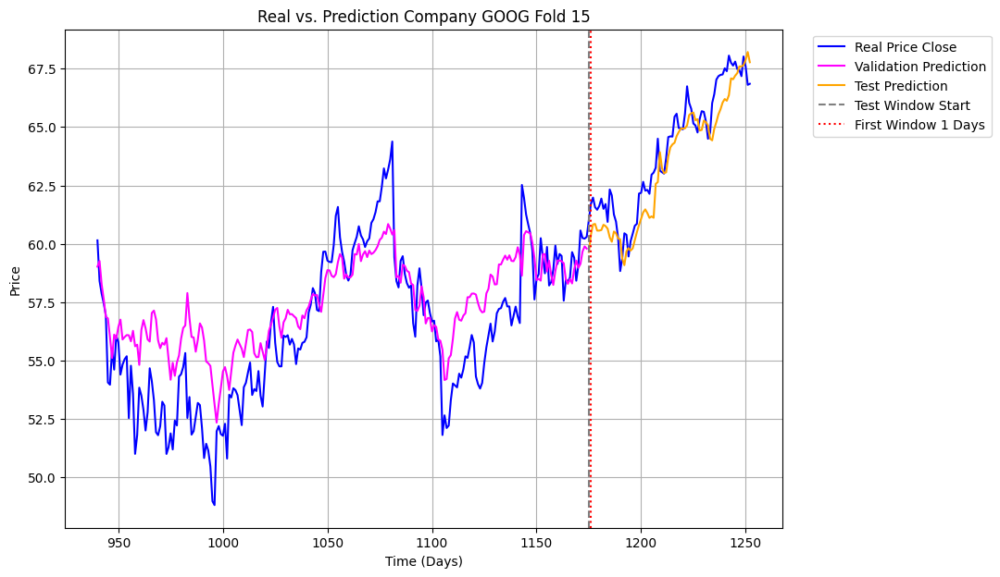

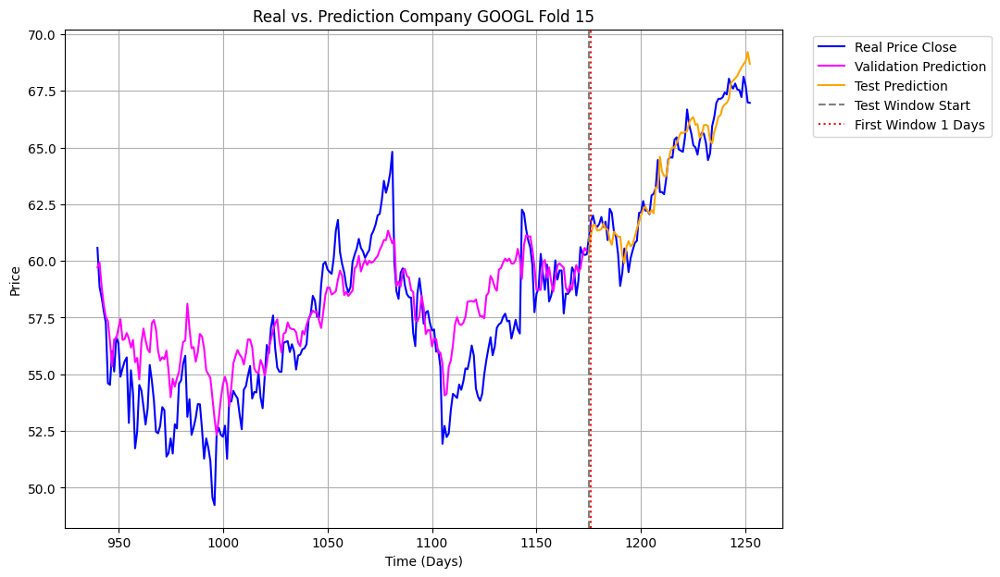

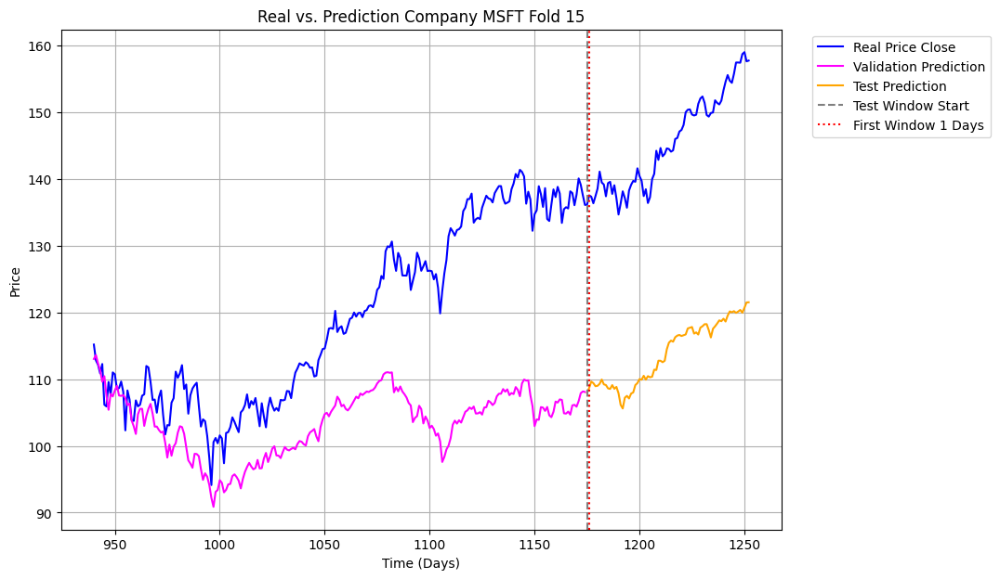

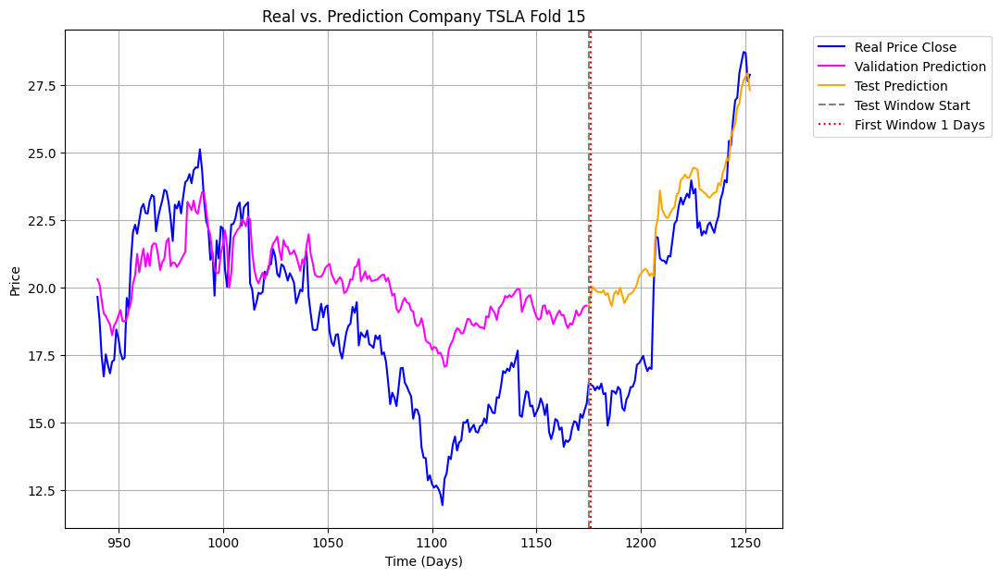

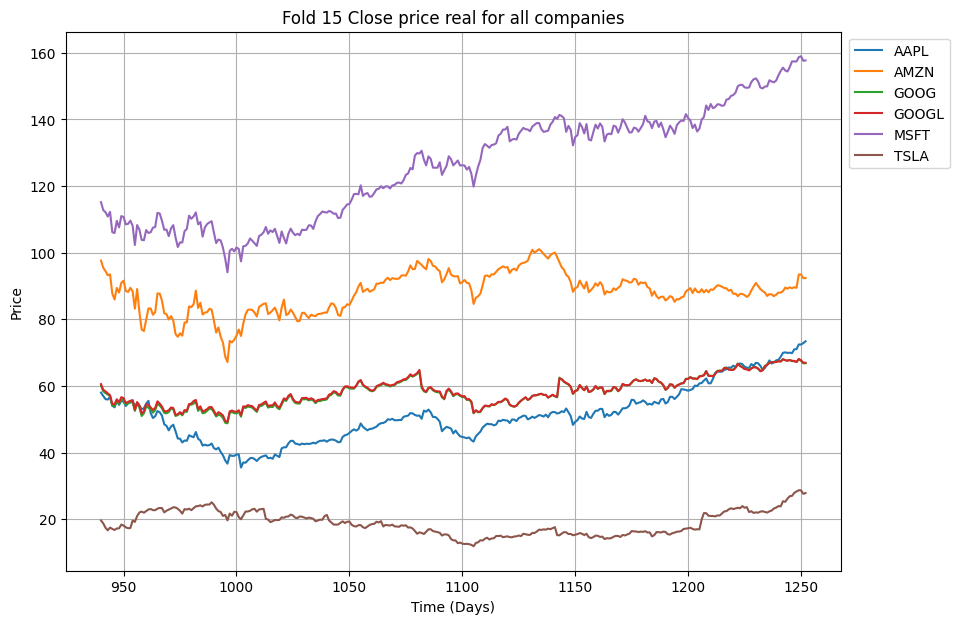

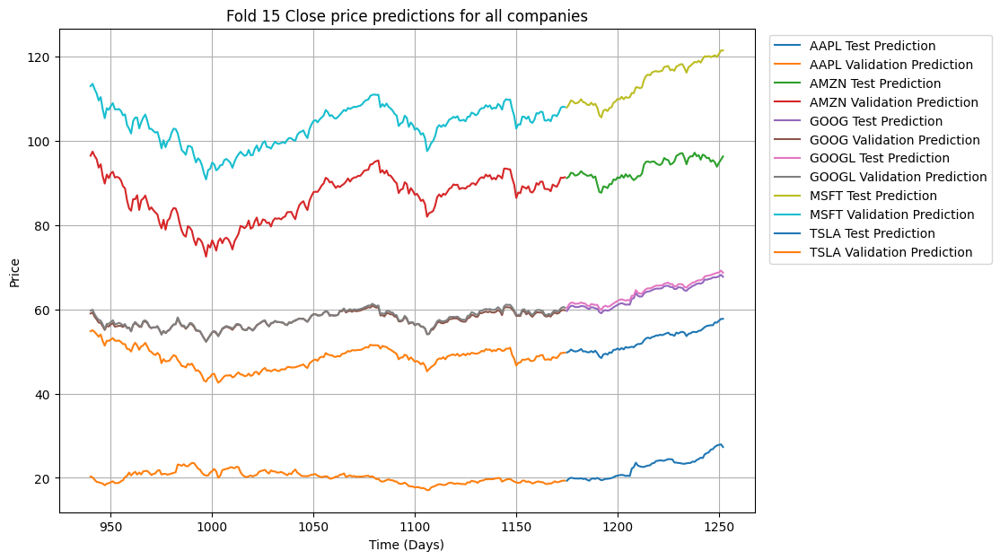

Fold_15 Done


In [ ]:
tf.keras.utils.set_random_seed(42)
# Instanciar el callback EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', patience=10)

# Definir el project_name incluyendo tanto el ticker como el canal de cada entrada
ticker = [f'{i}' for i in range(len(X_channels))]

# Instanciar el optimizador de hiperparámetros Kerastuner
tuner = kt.RandomSearch(build_model,
                        max_trials=30,
                     objective='val_loss',
                     directory=project_path + f'/Modelos/{arch}_Tuning',
                     project_name=''.join(ticker) + f'_{arch}_tuning_Vt1')

# Buscar los mejores hiperparámetros para el modelo
tuner.search(x_channels_comb, y_channels_comb, epochs=1000, validation_split=0.2, callbacks=[early_stop])

# Obtener los mejores hiperparámetros
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

dir=project_path+f'/GraficasModelosN/Graficas_T_Vt1/{arch}'
tscv = TimeSeriesSplit(n_splits=15)

val_losses=[]
train_losses=[]
history_ = []
# Cálculo de métricas para cada canal de entrada y salida
tr_mses, tr_maes, tr_mapes, tr_rmses, tr_mpes= [], [], [], [], []
t_mses, v_mses, t_maes, v_maes, t_mapes, v_mapes, t_rmses, v_rmses, t_mpes, v_mpes = [], [], [], [], [], [], [], [], [], []
mse_t_p, mae_t_p, mape_t_p, rmse_t_p, mpe_t_p, mse_v_p, mae_v_p, mape_v_p, rmse_v_p, mpe_v_p =[], [], [], [], [], [], [], [], [], []
mse_tr_p, mae_tr_p, mape_tr_p, rmse_tr_p, mpe_tr_p =[], [], [], [], []

model = tuner.hypermodel.build(best_hps)
early_stop=EarlyStopping(monitor='val_loss',patience=15)
# Reiniciar el índice de las capas en tu modelo
counter=0
# Dividir los datos en conjuntos de entrenamiento, validación y prueba usando TimeSeriesSplit
for train_index, test_index in tscv.split(X_channels[0]):  # Usamos solo la primera secuencia para generar los índices de división
    counter+=1
    Fold = 'Fold_' + str(counter)

    y_test1 = []
    y_val1 = []
    y_train1 = []
    y_val_pred = []
    y_pred = []
    y_val_pred_normal=[]
    y_train_pred_normal=[]
    y_pred_normal=[]
    y_val_pred_per_channel = [] # predicciones separadas por canal
    y_pred_per_channel = []

    print(f'{Fold} Started')
    # Crear directorio para cada fold si no existe
    if not os.path.exists(os.path.join(dir, Fold)):
      os.makedirs(os.path.join(dir, Fold))
    scalersX=[]
    scalersY=[]
    # Crear listas temporales para almacenar los datos normalizados
    X_train_scaled, X_val_scaled, X_test_scaled = [], [], []
    y_train_scaled, y_val_scaled, y_test_scaled = [], [], []
    # Dividir los datos en subconjuntos de entrenamiento y prueba
    X_train, X_test = [], []
    y_train, y_test = [], []
    X_train_list, X_val_list, X_test_list = [], [], []
    y_train_list, y_val_list, y_test_list = [], [], []
    X_train_blocks, y_train_blocks, X_val_blocks, y_val_blocks, X_test_blocks, y_test_blocks = [], [], [], [], [], []

    for i in range(len(X_channels)):
      X_train_tmp, X_test_tmp = X_channels[i][train_index], X_channels[i][test_index]
      y_train_tmp, y_test_tmp = y_channels[i][train_index], y_channels[i][test_index]

      # Normalizar los datos de entrada
      scaler_X = MinMaxScaler(feature_range=(0, 1))

      # Se redimensiona el arreglo a dos dimensiones para aplicar el escalado
      num_samples, time_steps, num_features = X_train_tmp.shape
      X_train_tmp_reshaped = X_train_tmp.reshape(-1, num_features)

      X_train_scaled_tmp = scaler_X.fit_transform(X_train_tmp_reshaped)
      #redimensiona a la forma original
      X_train_scaled_tmp = X_train_scaled_tmp.reshape(num_samples, time_steps, num_features)

      X_test_scaled_tmp = scaler_X.transform(X_test_tmp.reshape(-1, num_features))
      X_test_scaled_tmp = X_test_scaled_tmp.reshape(X_test_tmp.shape)

      scalersX.append(scaler_X)

      # X_train.append(X_train_tmp)
      # X_test.append(X_test_tmp)
      X_train_scaled.append(X_train_scaled_tmp)
      X_test_scaled.append(X_test_scaled_tmp)

      # Normalizar los datos de salida
      scaler_y = MinMaxScaler(feature_range=(0, 1))
      y_train_scaled_tmp = scaler_y.fit_transform(y_train_tmp)
      y_test_scaled_tmp = scaler_y.transform(y_test_tmp)
      scalersY.append(scaler_y)

      # y_train.append(y_train_tmp)
      # y_test.append(y_test_tmp)
      y_train_scaled.append(y_train_scaled_tmp)
      y_test_scaled.append(y_test_scaled_tmp)


    # Dividir el conjunto de entrenamiento en subconjuntos de entrenamiento y validación
    val_split = int(len(train_index) * 0.8)
    for i in range(len(X_train_scaled)):
        X_train_tmp, X_val_tmp = X_train_scaled[i][:val_split], X_train_scaled[i][val_split:]
        y_train_tmp, y_val_tmp = y_train_scaled[i][:val_split], y_train_scaled[i][val_split:]

        X_train_list.append(X_train_tmp)
        X_val_list.append(X_val_tmp)
        X_test_list.append(X_test_scaled[i])
        y_train_list.append(y_train_tmp)
        y_val_list.append(y_val_tmp)
        y_test_list.append(y_test_scaled[i])


    for i in range(0, len(X_train_list), 6):
      X_train_block = np.concatenate(X_train_list[i:i+6], axis=2)
      y_train_block = np.concatenate(y_train_list[i:i+6], axis=1)
      X_val_block = np.concatenate(X_val_list[i:i+6], axis=2)
      y_val_block = np.concatenate(y_val_list[i:i+6], axis=1)
      X_test_block = np.concatenate(X_test_list[i:i+6], axis=2)
      y_test_block = y_test_list[i:i+6]
      y_val_block_ = y_val_list[i:i+6]
      y_train_block_ = y_train_list[i:i+6]


    model = tuner.hypermodel.build(best_hps)
    history=model.fit(X_train_block, y_train_block, validation_data=(X_val_block, y_val_block), epochs=1000, shuffle=False, callbacks=[early_stop], verbose=False)

    val_losses.append(history.history['val_loss'])
    train_losses.append(history.history['loss'])
    plt.figure(figsize=(10,7))
    plt.plot(history.history['val_loss'], label=f'Validation loss')
    plt.plot(history.history['loss'],  label=f'Train loss')

    plt.title(f'Training and validation Fold {counter}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(bbox_to_anchor=(1.25, 1), loc='upper right')
    plt.grid()
    plt.savefig(os.path.join(dir,Fold,f'training_validation_fold{counter}.png'))
    plt.show()
    plt.close()

    for j in range(len(y_test_block)):
        y_test_channel = np.repeat(y_test_block[j], X_channels[0].shape[2], axis=1)
        y_test_channel_ = scalersY[j].inverse_transform(y_test_channel)[:, -1]
        y_test1.append(y_test_channel_)

    for j in range(len(y_val_block_)):
        y_val_channel = np.repeat(y_val_block_[j], X_channels[0].shape[2], axis=1)
        y_val_channel_ = scalersY[j].inverse_transform(y_val_channel)[:, -1]
        y_val1.append(y_val_channel_)

    for j in range(len(y_train_block_)):
        y_train_channel = np.repeat(y_train_block_[j], X_channels[0].shape[2], axis=1)
        y_train_channel_ = scalersY[j].inverse_transform(y_train_channel)[:, -1]
        y_train1.append(y_train_channel_)

    #Predicciones
    y_train_pred = model.predict(X_train_block, verbose=False)
    y_val_pred=model.predict(X_val_block, verbose=False)
    y_pred=model.predict(X_test_block, verbose=False)

    # Dividir la muestra en partes correspondientes a cada canal
    y_train_pred_per_channel = np.split(y_train_pred, 6, axis=1)
    y_val_pred_per_channel = np.split(y_val_pred, 6, axis=1)
    y_pred_per_channel = np.split(y_pred, 6, axis=1)

    for ptc in range(len(y_train_pred_per_channel)):
        y_train_pred_channel = np.repeat(y_train_pred_per_channel[ptc], X_channels[0].shape[2], axis=1)
        y_train_pred_channel_= scalersX[ptc].inverse_transform(y_train_pred_channel)[:, -1]
        y_train_pred_normal.append(y_train_pred_channel_)

    for xvc in range(len(y_val_pred_per_channel)):
        y_val_pred_channel = np.repeat(y_val_pred_per_channel[xvc], X_channels[0].shape[2], axis=1)
        y_val_pred_channel_= scalersX[xvc].inverse_transform(y_val_pred_channel)[:, -1]
        y_val_pred_normal.append(y_val_pred_channel_)

    for ypc in range(len(y_pred_per_channel)):
        y_pred_channel = np.repeat(y_pred_per_channel[ypc], X_channels[0].shape[2], axis=1)
        y_pred_channel_= scalersX[ypc].inverse_transform(y_pred_channel)[:, -1]
        y_pred_normal.append(y_pred_channel_)

    for k in range(len(y_test1)):
      t_mse = mse(y_test1[k], y_pred_normal[k])
      t_mses.append(t_mse)
      v_mse = mse(y_val1[k], y_val_pred_normal[k])
      v_mses.append(v_mse)
      tr_mse = mse(y_train1[k], y_train_pred_normal[k])
      tr_mses.append(tr_mse)


      t_mae = mae(y_test1[k], y_pred_normal[k])
      t_maes.append(t_mae)
      v_mae = mae(y_val1[k], y_val_pred_normal[k])
      v_maes.append(v_mae)
      tr_mae = mae(y_train1[k], y_train_pred_normal[k])
      tr_maes.append(tr_mae)

      t_mape = mape(y_test1[k], y_pred_normal[k])
      t_mapes.append(t_mape)
      v_mape = mape(y_val1[k], y_val_pred_normal[k])
      v_mapes.append(v_mape)
      tr_mape = mape(y_train1[k], y_train_pred_normal[k])
      tr_mapes.append(tr_mape)

      t_rmse = rmse(y_test1[k], y_pred_normal[k])
      t_rmses.append(t_rmse)
      v_rmse = rmse(y_val1[k], y_val_pred_normal[k])
      v_rmses.append(v_rmse)
      tr_rmse = rmse(y_train1[k], y_train_pred_normal[k])
      tr_rmses.append(tr_rmse)

      t_mpe = mpe(y_test1[k], y_pred_normal[k])
      t_mpes.append(t_mpe)
      v_mpe = mpe(y_val1[k], y_val_pred_normal[k])
      v_mpes.append(v_mpe)
      tr_mpe = mpe(y_train1[k], y_train_pred_normal[k])
      tr_mpes.append(tr_mpe)

      mse_t_p.append(t_mse)
      mse_v_p.append(v_mse)
      mse_tr_p.append(tr_mse)

      mae_t_p.append(t_mae)
      mae_v_p.append(v_mae)
      mae_tr_p.append(tr_mae)

      mape_t_p.append(t_mape)
      mape_v_p.append(v_mape)
      mape_tr_p.append(tr_mape)

      rmse_t_p.append(t_rmse)
      rmse_v_p.append(v_rmse)
      rmse_tr_p.append(tr_rmse)

      mpe_t_p.append(t_mpe)
      mpe_v_p.append(v_mpe)
      mpe_tr_p.append(tr_mpe)



      names_dict = {0: 'AAPL', 1: 'AMZN', 2: 'GOOG', 3: 'GOOGL', 4: 'MSFT', 5: 'TSLA'}
      names = names_dict.get(k, 'Unknown')

      t_window_start = X_train_block.shape[0] + len(y_val1[k])  # Inicio de la ventana de tiempo de prueba
      start_index = max(t_window_start - 1, 0)  # Inicio 1 días antes del inicio de la ventana de prueba

      v_time=range(X_train_block.shape[0],X_train_block.shape[0]+len(y_val1[k]))
      t_time=range(X_train_block.shape[0]+len(y_val1[k]),X_train_block.shape[0]+len(y_val1[k])+len(y_test1[k]))
      r_time=range(X_train_block.shape[0],X_train_block.shape[0]+len(y_val1[k])+len(y_test1[k]))

      real=np.concatenate((y_val1[k],y_test1[k]))
      plt.figure(figsize=(10,7))
      plt.plot(r_time,real,label='Real Price Close',color='blue',linestyle='-')
      plt.plot(v_time,y_val_pred_normal[k],label='Validation Prediction',color='magenta',linestyle='-')
      plt.plot(t_time,y_pred_normal[k], label='Test Prediction',color='orange',linestyle='-')
      # Marcadores para el inicio y fin de la ventana de tiempo de prueba
      plt.axvline(x=t_window_start, color='gray', linestyle='--', label='Test Window Start')
      plt.axvline(t_window_start + 1, color='red', linestyle='dotted', label='First Window 1 Days')

      plt.legend(bbox_to_anchor=(1.3, 1), loc='upper right')

      plt.title(f'Real vs. Prediction Company {names} Fold {counter}')
      plt.ylabel('Price')
      plt.xlabel('Time (Days)')
      plt.grid()
      plt.savefig(os.path.join(dir,Fold,f'real_vs_pred_company_{names}.png'))
      plt.show()
      plt.close()


    plt.figure(figsize=(10, 7))
    names_dict = {0: 'AAPL', 1: 'AMZN', 2: 'GOOG', 3: 'GOOGL', 4: 'MSFT', 5: 'TSLA'}

    for channel_index, (real_val, real_test) in enumerate(zip(y_val1,y_test1)):
      real2=np.concatenate((real_val, real_test))
      plt.plot(r_time, real2, label=f'{names_dict[channel_index]}',linestyle='-')


    plt.legend(bbox_to_anchor=(1.15, 1), loc='upper right')

    plt.title(f'Fold {counter} Close price real for all companies')
    plt.ylabel('Price')
    plt.xlabel('Time (Days)')
    plt.grid()
    plt.savefig(os.path.join(dir, f'Fold_{counter}_all_companies_real.png'))
    plt.show()
    plt.close()

    plt.figure(figsize=(10, 7))


    for channel_index, (predictions_normal, predictions_val) in enumerate(zip(y_pred_normal,y_val_pred_normal)):
      # Grafica las predicciones de prueba de este canal en este fold
      plt.plot(t_time, predictions_normal, label=f'{names_dict[channel_index]} Test Prediction', linestyle='-')
      # Grafica las predicciones de validación de este canal en este fold
      plt.plot(v_time, predictions_val, label=f'{names_dict[channel_index]} Validation Prediction', linestyle='-')

    # plt.axvline(x=t_window_start, color='gray', linestyle='--', label='Test Window Start')
    # plt.axvline(t_window_start + 7, color='red', linestyle='dotted', label='First Window 7 Days')
    plt.legend(bbox_to_anchor=(1.35, 1), loc='upper right')

    plt.title(f'Fold {counter} Close price predictions for all companies')
    plt.ylabel('Price')
    plt.xlabel('Time (Days)')
    plt.grid()
    plt.savefig(os.path.join(dir, f'Fold_{counter}_all_companies_predictions.png'))
    plt.show()
    plt.close()

    if counter==15:
        model.save_weights(f'/content/drive/MyDrive/Price_Prediction/Modelos/Weights/model_T_Vt1.h5')
    print(f'{Fold} Done')


In [ ]:
# Obtener un resumen de los resultados de la búsqueda
tuner.results_summary()
best_hps_values = best_hps.values
print("Mejores hiperparámetros encontrados:")
for key in best_hps_values.keys():
    print(f"{key}: {best_hps.get(key)}")

Results summary
Results in /content/drive/MyDrive/Price_Prediction/Modelos/TCN_Tuning/012345_TCN_tuning_Vt1
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 15 summary
Hyperparameters:
kernel_size: 6
nb_filters: 192
dropout_rate: 0.0
alpha: 0.1
units1: 56
l1: 0.01
l2: 0.0001
Score: 0.012344508431851864

Trial 29 summary
Hyperparameters:
kernel_size: 4
nb_filters: 176
dropout_rate: 0.0
alpha: 0.2
units1: 136
l1: 0.1
l2: 0.0001
Score: 0.013133666478097439

Trial 26 summary
Hyperparameters:
kernel_size: 3
nb_filters: 224
dropout_rate: 0.0
alpha: 0.1
units1: 92
l1: 0.01
l2: 0.0001
Score: 0.01316725555807352

Trial 14 summary
Hyperparameters:
kernel_size: 4
nb_filters: 224
dropout_rate: 0.0
alpha: 0.2
units1: 112
l1: 0.01
l2: 0.001
Score: 0.013686028309166431

Trial 04 summary
Hyperparameters:
kernel_size: 3
nb_filters: 80
dropout_rate: 0.0
alpha: 0.2
units1: 152
l1: 0.1
l2: 0.001
Score: 0.014362256973981857

Trial 20 summary
Hyperparameters:
kernel_size: 5
nb_filte

Entrenamiento, prediccion por cada Fold (10)

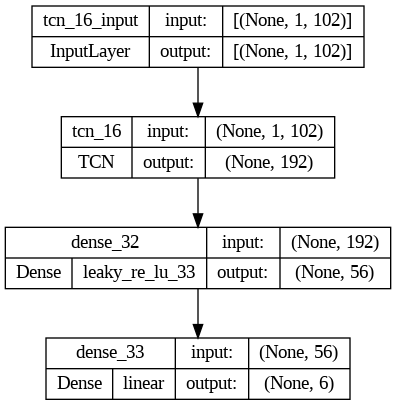

In [ ]:
plot_model(model, to_file='model.png',show_shapes=True, show_layer_names=True, show_layer_activations=True)

In [ ]:
model.summary()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 tcn_16 (TCN)                (None, 192)               801600    
                                                                 
 dense_32 (Dense)            (None, 56)                10808     
                                                                 
 dense_33 (Dense)            (None, 6)                 342       
                                                                 
Total params: 812750 (3.10 MB)
Trainable params: 812750 (3.10 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
from pandas import concat
dfhistory = pd.DataFrame()

for i in range(len(history_)):
    # historial de entrenamiento del modelo actual
    history_data = pd.DataFrame(history_[i].history)
    history_data['fold'] = i
    dfhistory = concat([dfhistory, history_data], ignore_index=True)

dfhistory.to_csv(project_path+f'/Resultados/{arch}_historyComplete_T_Vt1.csv',index=False)

In [ ]:
metric_labels=['Testing-MSE','Validation-MSE','testing-MAE','validation-MAE','testing-mape','validation-mape','testing-RMSE','validation-RMSE', 'testing-MPE','validation-MPE']
metrics_df=pd.DataFrame()
metrics_df['Metrics']=metric_labels
std_metrics_df=pd.DataFrame()
std_metrics_df['Metrics']=metric_labels

overall_mse_train, overall_mse_val, overall_std_train, overall_std_val=[], [], [], []

metrics=[]

#save dataframe as csv
metrics_df.to_csv(project_path+f'/Resultados/metricas_T_Vt1/{arch}_metrics.csv',index=False)
std_metrics_df.to_csv(project_path+f'/Resultados/metricas_T_Vt1/{arch}_std_metrics.csv',index=False)

Promedio de la perdida de entrenamiento y validacion

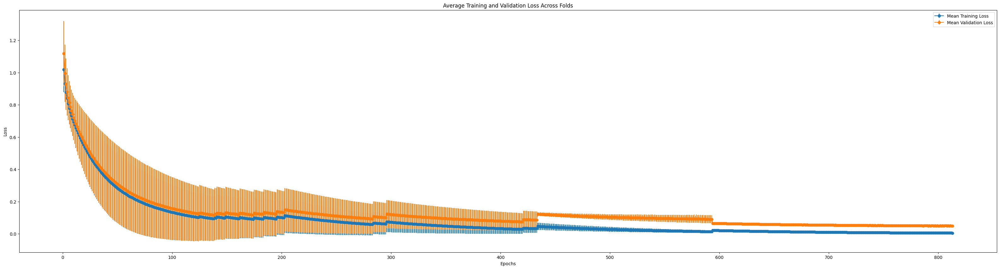

In [ ]:
max_train_epochs = max(len(losses) for losses in train_losses)
max_val_epochs = max(len(losses) for losses in val_losses)

padded_train_losses = [np.pad(losses, (0, max_train_epochs - len(losses)), mode='constant', constant_values=np.nan)
                    for losses in train_losses]

padded_val_losses = [np.pad(losses, (0, max_val_epochs - len(losses)), mode='constant', constant_values=np.nan)
                    for losses in val_losses]

mean_train_loss = np.nanmean(padded_train_losses, axis=0)
std_train_loss = np.nanstd(padded_train_losses, axis=0)

overall_mse_train.append(np.mean(mean_train_loss))
overall_std_train.append(np.std(mean_train_loss))

mean_val_loss = np.nanmean(padded_val_losses, axis=0)
std_val_loss = np.nanstd(padded_val_losses, axis=0)

overall_mse_val.append(np.mean(mean_val_loss))
overall_std_val.append(np.std(mean_val_loss))

plt.figure(figsize=(40,10))
plt.errorbar(range(1, max_train_epochs + 1), mean_train_loss, yerr=std_train_loss, label='Mean Training Loss', marker='o')
plt.errorbar(range(1, max_val_epochs + 1), mean_val_loss, yerr=std_val_loss, label='Mean Validation Loss', marker='o')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Average Training and Validation Loss Across Folds')

plt.legend()
plt.savefig(os.path.join(dir,'mean_loss.png'))
plt.show()
plt.close()


# Importante: se cambio estructura de metricas pero no esta ejecutada esta parte aun!

In [ ]:
def split_list(lst, chunk_size):
    return [lst[i:i+chunk_size] for i in range(0, len(lst), chunk_size)]

# Dividir cada lista en sublistas de 10, cada una con 6 elementos
t_mses_c = split_list(t_mses, 6)
v_mses_c = split_list(v_mses, 6)
t_maes_c = split_list(t_maes, 6)
v_maes_c = split_list(v_maes, 6)
t_mapes_c = split_list(t_mapes, 6)
v_mapes_c = split_list(v_mapes, 6)
t_rmses_c = split_list(t_rmses, 6)
v_rmses_c = split_list(v_rmses, 6)
t_mpes_c = split_list(t_mpes, 6)
v_mpes_c = split_list(v_mpes, 6)

t_mses_c_p = []
v_mses_c_p = []
t_maes_c_p = []
v_maes_c_p = []
t_mapes_c_p = []
v_mapes_c_p = []
t_rmses_c_p = []
v_rmses_c_p = []
t_mpes_c_p = []
v_mpes_c_p = []

t_mses_c_p_std = []
v_mses_c_p_std = []
t_maes_c_p_std = []
v_maes_c_p_std = []
t_mapes_c_p_std = []
v_mapes_c_p_std = []
t_rmses_c_p_std = []
v_rmses_c_p_std = []
t_mpes_c_p_std = []
v_mpes_c_p_std = []

for i in range(len(t_mses_c)):
  t_mses_c_p_i = []
  v_mses_c_p_i = []
  t_maes_c_p_i = []
  v_maes_c_p_i = []
  t_mapes_c_p_i = []
  v_mapes_c_p_i = []
  t_rmses_c_p_i = []
  v_rmses_c_p_i = []
  t_mpes_c_p_i = []
  v_mpes_c_p_i = []
  for j in range(len(t_mses_c[i])):
    t_mses_c_p_i.append(t_mses_c[i][j][0])
    v_mses_c_p_i.append(v_mses_c[i][j][0])
    t_maes_c_p_i.append(t_maes_c[i][j][0])
    v_maes_c_p_i.append(v_maes_c[i][j][0])
    t_mapes_c_p_i.append(t_mapes_c[i][j][0])
    v_mapes_c_p_i.append(v_mapes_c[i][j][0])
    t_rmses_c_p_i.append(t_rmses_c[i][j][0])
    v_rmses_c_p_i.append(v_rmses_c[i][j][0])
    t_mpes_c_p_i.append(t_mpes_c[i][j][0])
    v_mpes_c_p_i.append(v_mpes_c[i][j][0])

  t_mses_c_p.append(np.mean(t_mses_c_p_i))
  v_mses_c_p.append(np.mean(v_mses_c_p_i))
  t_maes_c_p.append(np.mean(t_maes_c_p_i))
  v_maes_c_p.append(np.mean(v_maes_c_p_i))
  t_mapes_c_p.append(np.mean(t_mapes_c_p_i))
  v_mapes_c_p.append(np.mean(v_mapes_c_p_i))
  t_rmses_c_p.append(np.mean(t_rmses_c_p_i))
  v_rmses_c_p.append(np.mean(v_rmses_c_p_i))
  t_mpes_c_p.append(np.mean(t_mpes_c_p_i))
  v_mpes_c_p.append(np.mean(v_mpes_c_p_i))

for i in range(len(t_mses_c)):
  t_mses_c_p_s = []
  v_mses_c_p_s = []
  t_maes_c_p_s = []
  v_maes_c_p_s = []
  t_mapes_c_p_s = []
  v_mapes_c_p_s = []
  t_rmses_c_p_s = []
  v_rmses_c_p_s = []
  t_mpes_c_p_s = []
  v_mpes_c_p_s = []
  for j in range(len(t_mses_c[i])):
    #print(t_mses_c[i][j][0])
    t_mses_c_p_s.append(t_mses_c[i][j][1])
    v_mses_c_p_s.append(v_mses_c[i][j][1])
    t_maes_c_p_s.append(t_maes_c[i][j][1])
    v_maes_c_p_s.append(v_maes_c[i][j][1])
    t_mapes_c_p_s.append(t_mapes_c[i][j][1])
    v_mapes_c_p_s.append(v_mapes_c[i][j][1])
    t_rmses_c_p_s.append(t_rmses_c[i][j][1])
    v_rmses_c_p_s.append(v_rmses_c[i][j][1])
    t_mpes_c_p_s.append(t_mpes_c[i][j][1])
    v_mpes_c_p_s.append(v_mpes_c[i][j][1])

  t_mses_c_p_std.append(np.mean(t_mses_c_p_s))
  v_mses_c_p_std.append(np.mean(v_mses_c_p_s))
  t_maes_c_p_std.append(np.mean(t_maes_c_p_s))
  v_maes_c_p_std.append(np.mean(v_maes_c_p_s))
  t_mapes_c_p_std.append(np.mean(t_mapes_c_p_s))
  v_mapes_c_p_std.append(np.mean(v_mapes_c_p_s))
  t_rmses_c_p_std.append(np.mean(t_rmses_c_p_s))
  v_rmses_c_p_std.append(np.mean(v_rmses_c_p_s))
  t_mpes_c_p_std.append(np.mean(t_mpes_c_p_s))
  v_mpes_c_p_std.append(np.mean(v_mpes_c_p_s))

metrics=[]
Taverage_mse = np.mean(t_mses_c_p)
metrics.append(Taverage_mse)
Vaverage_mse = np.mean(v_mses_c_p)
metrics.append(Vaverage_mse)
Taverage_mae = np.mean(t_maes_c_p)
metrics.append(Taverage_mae)
Vaverage_mae = np.mean(v_maes_c_p)
metrics.append(Vaverage_mae)
Taverage_mape = np.mean(t_mapes_c_p)
metrics.append(Taverage_mape)
Vaverage_mape = np.mean(v_mapes_c_p)
metrics.append(Vaverage_mape)
Taverage_rmse = np.mean(t_rmses_c_p)
metrics.append(Taverage_rmse)
Vaverage_rmse = np.mean(v_rmses_c_p)
metrics.append(Vaverage_rmse)
Taverage_mpe = np.mean(t_mpes_c_p)
metrics.append(Taverage_mpe)
Vaverage_mpe = np.mean(v_mpes_c_p)
metrics.append(Vaverage_mpe)
metrics_df['6 Channels']=metrics


Tstd_mse=np.mean(t_mses_c_p_std)
Vstd_mse=np.std(v_mses_c_p_std)
Tstd_mae=np.std(t_maes_c_p_std)
Vstd_mae=np.std(v_maes_c_p_std)
Tstd_mape=np.std(t_mapes_c_p_std)
Vstd_mape=np.std(v_mapes_c_p_std)
Tstd_rmse=np.std(t_rmses_c_p_std)
Vstd_rmse=np.std(v_rmses_c_p_std)
Tstd_mpe=np.std(t_mpes_c_p_std)
Vstd_mpe=np.std(v_mpes_c_p_std)
std_metrics=[Tstd_mse,Tstd_mae,Tstd_mape,Tstd_rmse,Vstd_mse,Vstd_mae,Vstd_mape,Vstd_rmse,Tstd_mpe,Vstd_mpe]
std_metrics_df['6 Channels']=std_metrics

# Convertir la lista de todas las métricas en un DataFrame
# metrics_df = pd.DataFrame(all_metrics, columns=['Taverage_mse', 'Vaverage_mse', 'Taverage_mae', 'Vaverage_mae', 'Taverage_mape', 'Vaverage_mape', 'Taverage_rmse', 'Vaverage_rmse', 'Taverage_mpe', 'Vaverage_mpe'])
# all_metrics_std_df = pd.DataFrame(all_metrics_std, columns=['Taverage_mse', 'Vaverage_mse', 'Taverage_mae', 'Vaverage_mae', 'Taverage_mape', 'Vaverage_mape', 'Taverage_rmse', 'Vaverage_rmse', 'Taverage_mpe', 'Vaverage_mpe'])

# Guardar el DataFrame como un archivo CSV
metrics_df.to_csv(project_path+f'/Resultados/metricas_T_Vt1/{arch}_metrics.csv', index=False)

std_metrics_df.to_csv(project_path+f'/Resultados/metricas_T_Vt1/{arch}_std_metrics.csv',index=False)

print(f'done')

#testing
df_psT = pd.DataFrame({
    'MSE': mse_t_p,
    'MAE': mae_t_p,
    'MAPE': mape_t_p,
    'RMSE': rmse_t_p,
    'MPE': mpe_t_p
})


# Guardar el DataFrame en un archivo CSV
df_psT.to_csv(project_path + f'/Resultados/metricas_T_Vt1/{arch}_hypothesisT.csv', index=False)

#validation
df_psV = pd.DataFrame({
    'MSE': mse_v_p,
    'MAE': mae_v_p,
    'MAPE': mape_v_p,
    'RMSE': rmse_v_p,
    'MPE': mpe_v_p
})


# Guardar el DataFrame en un archivo CSV
df_psV.to_csv(project_path + f'/Resultados/metricas_T_Vt1/{arch}_hypothesisV.csv', index=False)

#train
df_psTr = pd.DataFrame({
    'MSE': mse_tr_p,
    'MAE': mae_tr_p,
    'MAPE': mape_tr_p,
    'RMSE': rmse_tr_p,
    'MPE': mpe_tr_p
})

# Guardar el DataFrame en un archivo CSV
df_psTr.to_csv(project_path + f'/Resultados/metricas_T_Vt1/{arch}_hypothesisTr.csv', index=False)

# Crear un DataFrame para las pérdidas
df_loss = pd.DataFrame({
    'Training Loss': overall_mse_train,
    'Training Std': overall_std_train,
    'Validation Loss': overall_mse_val,
    'Validation Std': overall_std_val
})

# Guardar el DataFrame en un archivo CSV
df_loss.to_csv(project_path + f'/Resultados/metricas_T_Vt1/{arch}_loss.csv', index=False)


done


In [4]:
project_path2='/content/drive/MyDrive/Price_Prediction/Resultados/'
df_tcn_hypTr = pd.read_csv(project_path2+'metricas_T_Vt1/TCN_hypothesisTr.csv')
df_tcn_hypV = pd.read_csv(project_path2+'metricas_T_Vt1/TCN_hypothesisV.csv')
df_tcn_hypT = pd.read_csv(project_path2+'metricas_T_Vt1/TCN_hypothesisT.csv')
#df_psT = df_lstm_hypTr.astype(float)
dftcnTr = pd.DataFrame(df_tcn_hypTr)
dftcnTr = dftcnTr.applymap(lambda x: float(x.split(",")[0][1:]))

dftcnV = pd.DataFrame(df_tcn_hypV)
dftcnV = dftcnV.applymap(lambda x: float(x.split(",")[0][1:]))

dftcnT = pd.DataFrame(df_tcn_hypT)
dftcnT = dftcnT.applymap(lambda x: float(x.split(",")[0][1:]))

classes=['AAPL', 'AMZN', 'GOOG', 'GOOGL', 'MSFT', 'TSLA']

def get_company_split(df,metric):
    data=[[],[],[],[],[],[]]
    count=0
    for value in df[metric]:
        mod=count%6
        count+=1
        data[mod].append(value)
    return data

def dataframe_por_empresa(df, classes):
    metrics = ['MSE', 'MAE', 'MAPE', 'RMSE', 'MPE']
    data_by_empresa = {}

    for metric in metrics:
        data_by_empresa[metric] = get_company_split(df, metric)

    return pd.DataFrame(data_by_empresa, index=classes)

# Función para calcular el promedio de una lista
def calcular_promedio(lista):
    if not lista:
        return 0  # Return 0 if the list is empty
    else:
        return sum(lista) / len(lista)

dataframe_por_empresaTCNTr = dataframe_por_empresa(dftcnTr,classes)
dataframe_por_empresaTCNV = dataframe_por_empresa(dftcnV,classes)
dataframe_por_empresaTCNT = dataframe_por_empresa(dftcnT,classes)

# Entrenamiento

In [5]:
df_promedioTr = dataframe_por_empresaTCNTr.applymap(calcular_promedio)
df_promedioTr.to_csv(project_path2+'metricas_T_Vt1/empresasTCNTr.csv')
df_promedioTr

,MSE,MAE,MAPE,RMSE,MPE
AAPL,0.758639,0.627510,0.020747,0.781605,-0.203463
AMZN,3.566145,1.218696,0.037935,1.477484,-0.922922
GOOG,1.292575,0.765110,0.021334,0.931270,-0.469516
GOOGL,1.389054,0.783273,0.021261,0.952922,-0.712095
MSFT,2.892968,1.190633,0.022126,1.460807,-0.641331
TSLA,0.391150,0.471069,0.030562,0.578324,0.009804


# Validacion

In [6]:
df_promedioV = dataframe_por_empresaTCNV.applymap(calcular_promedio)
df_promedioV.to_csv(project_path2+'metricas_T_Vt1/empresasTCNV.csv')
df_promedioV

,MSE,MAE,MAPE,RMSE,MPE
AAPL,6.075432,1.777282,0.046693,2.110025,-0.381731
AMZN,55.969267,4.886671,0.086919,5.553291,-5.043129
GOOG,4.847994,1.685323,0.039196,1.953177,-0.732999
GOOGL,4.985400,1.721559,0.039318,1.972588,-0.592031
MSFT,49.680182,4.615048,0.053797,5.321589,-4.539149
TSLA,3.858543,1.484902,0.082774,1.724273,4.525846


# Prueba

In [7]:
df_promedioT = dataframe_por_empresaTCNT.applymap(calcular_promedio)
df_promedioT.to_csv(project_path2+'metricas_T_Vt1/empresasTCNT.csv')
df_promedioT

,MSE,MAE,MAPE,RMSE,MPE
AAPL,18.238627,3.254737,0.080766,3.572704,-1.802012
AMZN,103.407827,7.280563,0.114516,7.687675,-7.924654
GOOG,11.210178,2.519379,0.057349,2.734515,-0.660640
GOOGL,11.315664,2.613775,0.057949,2.838463,-0.080016
MSFT,183.272418,9.690205,0.095509,9.958395,-8.956731
TSLA,9.830185,2.545550,0.144891,2.738090,9.974779


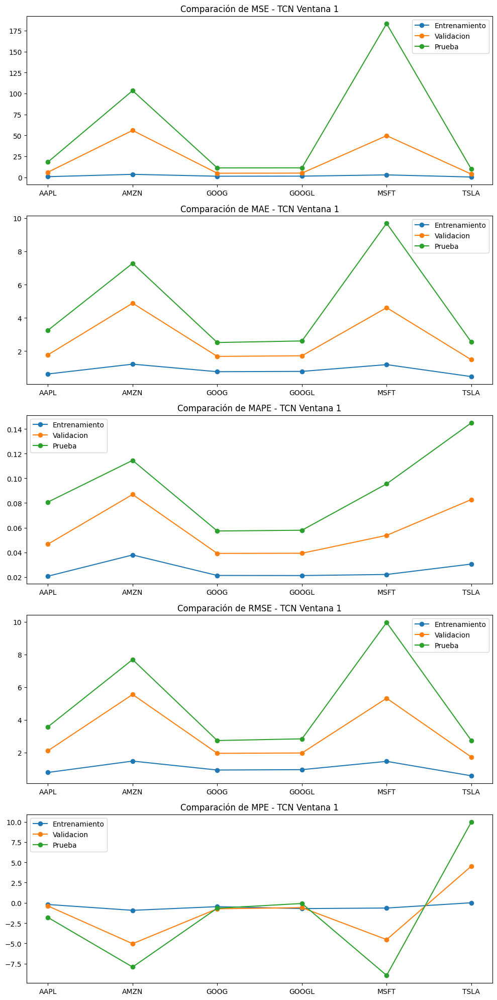

In [ ]:
fig, axs = plt.subplots(5, figsize=(10, 20))

# Comparar MSE
axs[0].plot(df_promedioTr['MSE'], label='Entrenamiento', marker='o')
axs[0].plot(df_promedioV['MSE'], label='Validacion', marker='o')
axs[0].plot(df_promedioT['MSE'], label='Prueba', marker='o')
axs[0].set_title('Comparación de MSE - TCN Ventana 1')
axs[0].legend()

# Comparar MAE
axs[1].plot(df_promedioTr['MAE'], label='Entrenamiento', marker='o')
axs[1].plot(df_promedioV['MAE'], label='Validacion', marker='o')
axs[1].plot(df_promedioT['MAE'], label='Prueba', marker='o')
axs[1].set_title('Comparación de MAE - TCN Ventana 1')
axs[1].legend()

# Comparar MAPE
axs[2].plot(df_promedioTr['MAPE'], label='Entrenamiento', marker='o')
axs[2].plot(df_promedioV['MAPE'], label='Validacion', marker='o')
axs[2].plot(df_promedioT['MAPE'], label='Prueba', marker='o')
axs[2].set_title('Comparación de MAPE - TCN Ventana 1')
axs[2].legend()

# Comparar RMSE
axs[3].plot(df_promedioTr['RMSE'], label='Entrenamiento', marker='o')
axs[3].plot(df_promedioV['RMSE'], label='Validacion', marker='o')
axs[3].plot(df_promedioT['RMSE'], label='Prueba', marker='o')
axs[3].set_title('Comparación de RMSE - TCN Ventana 1')
axs[3].legend()

# Comparar MPE
axs[4].plot(df_promedioTr['MPE'], label='Entrenamiento', marker='o')
axs[4].plot(df_promedioV['MPE'], label='Validacion', marker='o')
axs[4].plot(df_promedioT['MPE'], label='Prueba', marker='o')
axs[4].set_title('Comparación de MPE - TCN Ventana 1')
axs[4].legend()

plt.tight_layout()
plt.show()


Actividad detallada del modelo MILSTM

In [ ]:
# lista de capas del modelo
capas = model.layers
for capa in capas:
    print(f"Capa: {capa.name}")

    # Verificar si la capa tiene pesos entrenables
    if capa.trainable:
        # Obtener pesos de la capa
        weights = capa.get_weights()

        # detalles de los pesos
        for i, peso in enumerate(weights):
            print(f"Peso {i + 1}:")
            print(peso.shape)
            print(peso)
    else:
        print("Esta capa no tiene pesos entrenables")
    print()

Capa: tcn_31
Peso 1:
(6, 102, 224)
[[[ 0.01652069 -0.02646372  0.02650932 ...  0.06884757  0.08839457
   -0.01512598]
  [ 0.06751563  0.03060088  0.05348939 ... -0.02408377  0.11127719
   -0.05481718]
  [ 0.01177786 -0.01148996 -0.09113652 ... -0.04919839 -0.06216235
   -0.01503951]
  ...
  [ 0.02747614  0.03829177 -0.05943783 ... -0.02404238  0.03124754
    0.00708892]
  [-0.05017902 -0.01555565  0.01299223 ...  0.08657941 -0.03650667
    0.04010272]
  [ 0.00466711  0.01091059  0.03115125 ... -0.02749643  0.04652329
   -0.0397567 ]]

 [[ 0.12539232 -0.01036883 -0.03480856 ... -0.02183656 -0.09883875
    0.00662252]
  [-0.03599648  0.02507383 -0.02187901 ... -0.09012523 -0.03425738
    0.05064298]
  [ 0.00571695 -0.01020258 -0.07074099 ...  0.00797797 -0.0531662
    0.07042088]
  ...
  [ 0.07677173 -0.00388362  0.0147262  ...  0.00109324  0.03585524
    0.06861989]
  [-0.06446323 -0.07748174  0.10116448 ...  0.07389764 -0.03067621
   -0.06592101]
  [-0.0078431  -0.00092246  0.05618773 

Graficas generales de perdida de entrenamiento y validacion por cada fold

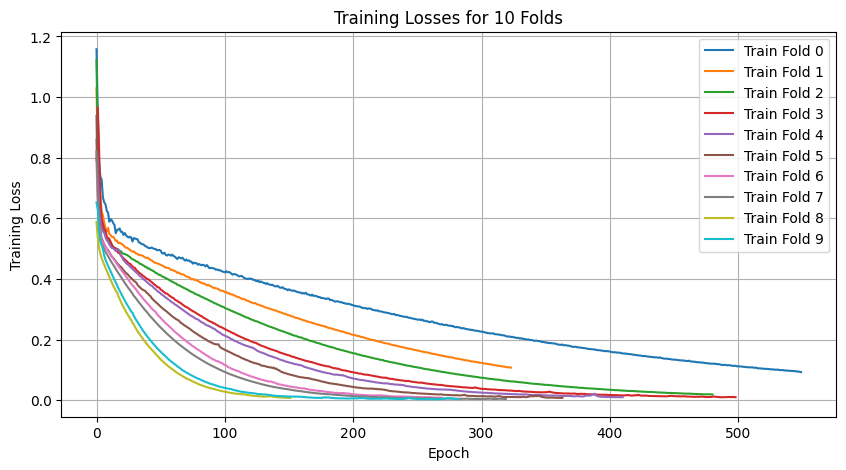

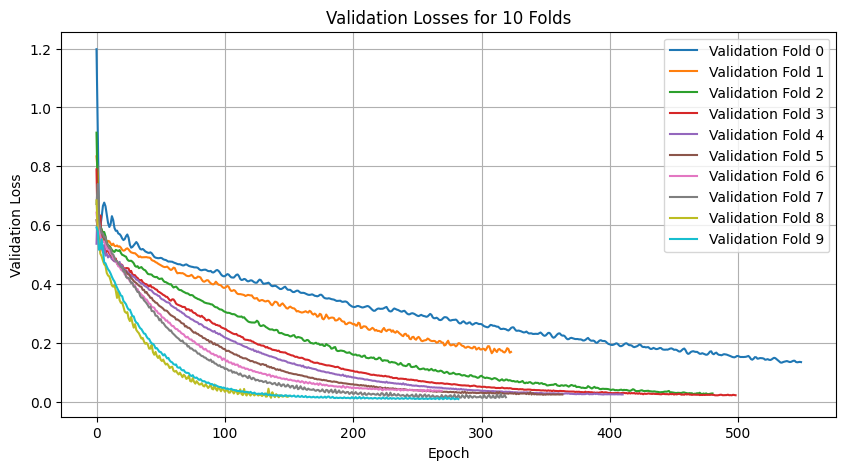

In [ ]:

plt.figure(figsize=(12, 8))
for i in range(1, 16):  # Comienza en 1 y termina en 15 (no inclusive)
    plt.plot(train_losses[i-1], label=f'Train Fold {i}')

plt.title('Training Losses TCN Window 1')
plt.xlabel('Epoch')
plt.ylabel('Training Loss')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()

plt.figure(figsize=(12, 8))
for i in range(1, 16):  # Comienza en 1 y termina en 15 (no inclusive)
    plt.plot(val_losses[i-1], label=f'Validation Fold {i}')

plt.title('Validation Losses TCN Window 1')
plt.xlabel('Epoch')
plt.ylabel('Validation Loss')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()


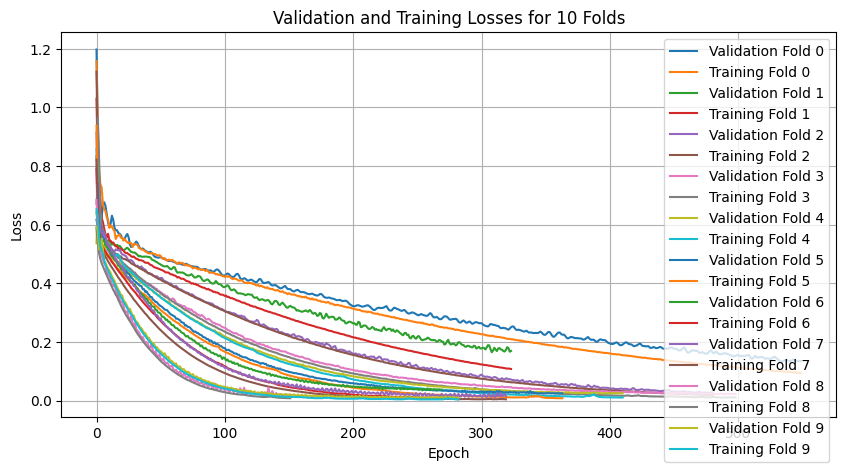

In [ ]:

plt.figure(figsize=(12, 8))
for i in range(1, 16):  # Comienza en 1 y termina en 15 (no inclusive)
    plt.plot(val_losses[i-1], label=f'Validation Fold {i}')
    plt.plot(train_losses[i-1], label=f'Training Fold {i}')

plt.title('Validation and Training Losses TCN Window 1')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()
